# infer_trajectory

In [1]:
here::i_am("rna/trajectories/infer_trajectory.R")

suppressPackageStartupMessages(library(scran))
suppressPackageStartupMessages(library(scater))
suppressPackageStartupMessages(library(destiny))

# Load default settings
source(here::here("settings.R"))
source(here::here("utils.R"))

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/code

Warning message:
“package ‘destiny’ was built under R version 4.1.3”


In [2]:
## START TEST ##
args <- list()
args$sce <-file.path(io$basedir,"data/processed/rna/SingleCellExperiment.rds")
# args$metadata <- file.path(io$basedir,"results/atac/archR/celltype_assignment/sample_metadata_after_celltype_assignment.txt.gz")
args$metadata <- file.path(io$basedir,"results/rna/mapping/sample_metadata_after_mapping.txt.gz")
args$trajectory_name <- "blood"
args$celltype_label <- "celltype"
args$outdir <- file.path(io$basedir,"results/rna_atac/gene_regulatory_networks/metacells/trajectories/erythroid")
args$n_pcs <- 25
args$sample <- c('E7.5_rep1','E7.5_rep2','E7.75_rep1','E8.0_rep1','E8.0_rep2','E8.5_rep1','E8.5_rep2','E8.75_rep1','E8.75_rep2')
## END TEST ##

# I/O
dir.create(args$outdir, showWarnings=F, recursive=T)

In [3]:
# Options
opts$celltype_trajectory_dic <- list(
  "epiblast_blood" =  c("Epiblast",
                        "Primitive_Streak" ,
                        "Nascent_mesoderm",
                        "ExE_mesoderm",
                        "Mixed_mesoderm",
                        "Allantois",
                        "Mesenchyme",
                        "Haematoendothelial_progenitors",
                        "Endothelium",
                        "Blood_progenitors_1",
                        "Blood_progenitors_2",
                        "Erythroid1",
                        "Erythroid2",
                        "Erythroid3"),
  "blood" = c("Haematoendothelial_progenitors", "Blood_progenitors_1", "Blood_progenitors_2", "Erythroid1", "Erythroid2", "Erythroid3"),
  "ectoderm" = c("Epiblast", "Rostral_neurectoderm", "Forebrain_Midbrain_Hindbrain"),
  "endoderm" = c("Epiblast", "Anterior_Primitive_Streak", "Def._endoderm", "Gut"),
  "mesoderm" = c("Epiblast", "Primitive_Streak", "Nascent_mesoderm"),
  "nmp" = c("NMP","Caudal_Mesoderm", "Somitic_mesoderm", "Spinal_cord")
  )

stopifnot(args$trajectory_name%in%names(opts$celltype_trajectory_dic))
opts$celltypes <- opts$celltype_trajectory_dic[[args$trajectory_name]]

opts$genes2plot <- list(
  "epiblast_blood" = c("Dnmt3b", "Mixl1", "Hbb-y","Etv2"),
  "blood" = c("Hbb-y","Etv2"),
  "ectoderm" = c("Utf1","Crabp1"),
  "endoderm" = c("Pou5f1","Krt8"),
  "mesoderm" = c("Dnmt3b","Mesp1"),
  "nmp" = c("Sox2","T")
)

stopifnot(args$trajectory_name%in%names(opts$genes2plot))
opts$genes_to_plot <- opts$genes2plot[[args$trajectory_name]]

In [4]:
##########################
## Load sample metadata ##
##########################

sample_metadata <- fread(args$metadata) %>%
  .[pass_rnaQC==TRUE & doublet_call==FALSE]

stopifnot(args$celltype_label%in%colnames(sample_metadata))
sample_metadata <- sample_metadata   %>%
  .[,celltype:=eval(as.name(args$celltype_label))] %>%
  .[celltype%in%opts$celltypes] %>%
  .[,celltype:=factor(celltype,levels=opts$celltypes)] %>%
  .[sample%in% args$sample]

table(sample_metadata$celltype)

# Save
fwrite(sample_metadata, file.path(args$outdir,sprintf("%s_sample_metadata.txt.gz",args$trajectory_name)))


Haematoendothelial_progenitors            Blood_progenitors_1 
                          1019                            272 
           Blood_progenitors_2                     Erythroid1 
                           673                           1243 
                    Erythroid2                     Erythroid3 
                          1029                            202 

In [5]:
#########################
## Load RNA expression ##
#########################
  
sce <- load_SingleCellExperiment(
  file = args$sce, 
  normalise = TRUE, 
  cells = sample_metadata$cell, 
  remove_non_expressed_genes = TRUE
)

colData(sce) <- sample_metadata %>% as.data.frame %>% tibble::column_to_rownames("cell") %>%
  .[colnames(sce),] %>% DataFrame()

In [6]:
#######################
## Feature selection ##
#######################

decomp <- modelGeneVar(sce)
decomp <- decomp[decomp$mean > 0.01,]
hvgs <- rownames(decomp)[decomp$p.value <= 0.01]

# Subset HVGs
sce_filt <- sce[hvgs,]
dim(sce_filt)

[1] 1185 4438

In [7]:
#########
## PCA ##
#########

# maybe need to incorporate batch control still.
# Or run metacells per stage and then compare GRNs of the different haematoendo stages/waves.
sce_filt <- runPCA(sce_filt, ncomponents = args$n_pcs, ntop=nrow(sce_filt))

# save
fwrite(as.data.table(reducedDim(sce_filt,"PCA"), keep.rownames=T) %>% setnames('rn', 'cell'), 
                     file.path(args$outdir,sprintf("PCA_%s.csv",args$n_pcs)))

# Define the starting point
foo <- mean(reducedDim(sce_filt,"PCA")[sce_filt$celltype==opts$celltypes[1],"PC1"])
if (foo>0) reducedDim(sce_filt,"PCA")[,"PC1"] <- -reducedDim(sce_filt,"PCA")[,"PC1"]


# Plot PCA
pdf(file.path(args$outdir,sprintf("%s_pca_celltype.pdf",args$trajectory_name)), width=8, height=5)
plotPCA(sce_filt, colour_by="celltype", ncomponents = c(1,2)) +
  scale_colour_manual(values=opts$celltype.colors) + theme(legend.position="none")
dev.off()

pdf(file.path(args$outdir,sprintf("%s_pca_stage.pdf",args$trajectory_name)), width=8, height=5)
plotPCA(sce_filt, colour_by="stage", ncomponents = c(1,2)) +
  scale_colour_manual(values=opts$stage.colors) + theme(legend.position="top", legend.title = element_blank())
dev.off()

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



png 
  2

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



png 
  2

In [8]:
###################
## Diffusion map ##
###################

set.seed(42)
dm <- DiffusionMap(sce_filt, n_pcs=args$n_pcs)

# Add to the SingleCellExperiment object
reducedDim(sce_filt, "DiffusionMap") <- dm@eigenvectors[,c(1,2)]

# Define the starting point
foo <- mean(reducedDim(sce_filt,"DiffusionMap")[sce_filt$celltype==opts$celltypes[1],"DC1"])
if (foo>0) reducedDim(sce_filt,"DiffusionMap")[,"DC1"] <- -reducedDim(sce_filt,"DiffusionMap")[,"DC1"]

# Plot
pdf(file.path(args$outdir,sprintf("%s_diffmap_celltype.pdf",args$trajectory_name)), width=8, height=5)
plotReducedDim(sce_filt, dimred = "DiffusionMap", colour_by="celltype", ncomponents = c(1,2)) +
  scale_colour_manual(values=opts$celltype.colors) + theme(legend.position="none")
dev.off()

pdf(file.path(args$outdir,sprintf("%s_diffmap_stage.pdf",args$trajectory_name)), width=8, height=5)
plotReducedDim(sce_filt, dimred = "DiffusionMap", colour_by="stage", ncomponents = c(1,2)) +
  scale_colour_manual(values=opts$stage.colors) + theme(legend.position="top", legend.title = element_blank())
dev.off()

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



png 
  2

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



png 
  2

In [9]:
####################
## Prepare output ##
####################

pseudotime.dt <- data.table(
  cell = colnames(sce_filt),
  PC1 = reducedDim(sce_filt,"PCA")[,"PC1"],
  DC1 = reducedDim(sce_filt,"DiffusionMap")[,"DC1"],
  DC2 = reducedDim(sce_filt,"DiffusionMap")[,"DC2"]

) %>% setorder(PC1)

# Save
fwrite(pseudotime.dt, file.path(args$outdir,sprintf("/%s_trajectory.txt.gz",args$trajectory_name)))

In [10]:
################################################
## Boxplots of pseudotime values per celltype ##
################################################

to.plot <- pseudotime.dt %>%
  merge(sample_metadata[,c("cell","celltype","stage")], by="cell") %>%
  .[,pca:=minmax.normalisation(PC1)] %>% .[,diffmap:=minmax.normalisation(DC1)]

for (i in c("pca","diffmap")) {
  p <- ggboxplot(to.plot, x="celltype", y=i, fill="celltype", outlier.shape=NA) +
    scale_fill_manual(values=opts$celltype.colors[opts$celltypes]) +
    stat_summary(fun.data = give.n, geom = "text", size=4) +
    labs(x="", y=sprintf("Pseudotime (%s)",i)) +
    theme_classic() +
    theme(
      legend.position = "none",
      # legend.position = c(.8,.3),
      legend.title = element_blank(),
      axis.text.x = element_text(angle=-25, hjust=0, vjust=1),
      axis.ticks.x = element_blank(),
      # axis.text.x = element_text(color="black", size=rel(0.75)),
      axis.text.y = element_text(color="black", size=rel(0.9)),
      axis.title.y = element_text(color="black", size=rel(1)),
      axis.title.x = element_blank()
    )
  
  pdf(file.path(args$outdir,sprintf("%s_%s_boxplot_celltype.pdf",args$trajectory_name,i)), width=6, height=3.5)
  print(p)
  dev.off()
}

In [11]:
#########################################################################
## Scatterplots of pseudotime values versus expression of marker genes ##
#########################################################################

# Denoise
# pca.rna <- fread(io$pca.rna) %>% matrix.please %>% .[colnames(sce),]
# assay(sce_filt,"logcounts_denoised") <- smoother_aggregate_nearest_nb(mat=as.matrix(logcounts(sce_filt)), D=pdist(pca.rna), k=25)

rna.dt <- data.table(as.matrix(logcounts(sce)[opts$genes_to_plot,]), keep.rownames = T) %>% 
  setnames("rn","gene") %>%
  melt(id.vars="gene", variable.name="cell", value.name="expr") %>% 
  merge(sample_metadata[,c("cell","celltype","stage")])

to.plot2 <- to.plot %>% 
  merge(rna.dt[gene%in%opts$genes_to_plot],by=c("cell", "celltype", "stage")) %>%
  .[,gene:=factor(gene,levels=opts$genes_to_plot)] %>%
  .[,expr:=minmax.normalisation(expr),by="gene"]

for (i in c("pca","diffmap")) {
  p <- ggplot(to.plot2, aes_string(x=i, y="expr")) +
    geom_point(aes(fill=celltype), size=1.75, shape=21, stroke=0.1, alpha=0.5) +
    # ggrastr::geom_point_rast(aes(fill=celltype), size=1.5, shape=21, stroke=0.1, alpha=0.75) +
    stat_smooth(aes(fill=expr), method="loess", color="black", alpha=0.85, span=0.5) +
    geom_rug(aes(color=celltype), sides="b") +
    # viridis::scale_fill_viridis() +
    scale_color_manual(values=opts$celltype.colors) +
    scale_fill_manual(values=opts$celltype.colors) +
    facet_wrap(~gene, scales="free_y") +
    labs(x=sprintf("Pseudotime (%s)",i), y="Gene expression") +
    theme_classic() +
    guides(fill="none", color="none") +
    theme(
      axis.text.x = element_blank(),
      axis.text.y = element_blank(),
      # axis.text.y = element_text(color="black"),
      axis.ticks.x = element_blank(),
      axis.ticks.y = element_blank(),
      strip.text = element_text(size=rel(1.25), color="black"),
      legend.position="right",
      legend.title = element_blank()
    )
  
  pdf(file.path(args$outdir,sprintf("%s_%s_vs_expression.pdf",args$trajectory_name,i)), width=7.5, height=4)
  print(p)
  dev.off()
}


`geom_smooth()` using formula 'y ~ x'

`geom_smooth()` using formula 'y ~ x'



In [12]:
###############################
## Save SingleCellExperiment ##
###############################

logcounts(sce) <- NULL
saveRDS(sce, file.path(args$outdir,sprintf("%s_SingleCellExperiment.rds",args$trajectory_name)))

In [13]:
sce = readRDS(file.path(args$outdir,sprintf("%s_SingleCellExperiment.rds",args$trajectory_name)))

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



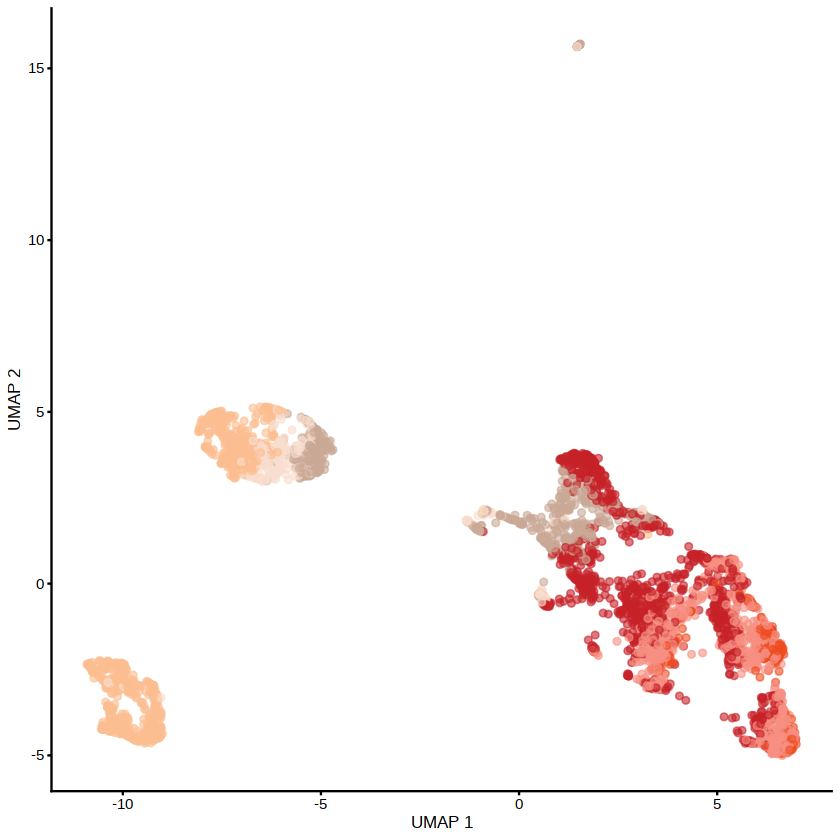

In [14]:
plotReducedDim(runUMAP(sce_filt), dimred = "UMAP", colour_by="celltype", ncomponents = c(1,2)) +
  scale_colour_manual(values=opts$celltype.colors) + theme(legend.position="none")

In [15]:
##################
## Batch Corr ####
##################
library(batchelor)
pca.mtx <- multiBatchPCA(sce_filt, batch = colData(sce_filt)$stage, d = args$n_pcs, preserve.single=FALSE)

In [16]:
pca.corrected <- reducedMNN(pca.mtx)$corrected

In [17]:
library(uwot)
umap = umap(pca.corrected)

Loading required package: Matrix


Attaching package: ‘Matrix’


The following object is masked from ‘package:S4Vectors’:

    expand




In [18]:
umap = umap %>% as.data.table(keep.rownames=T) %>% setnames(c('cell', 'umap1', 'umap2')) %>% merge(sample_metadata, by='cell')

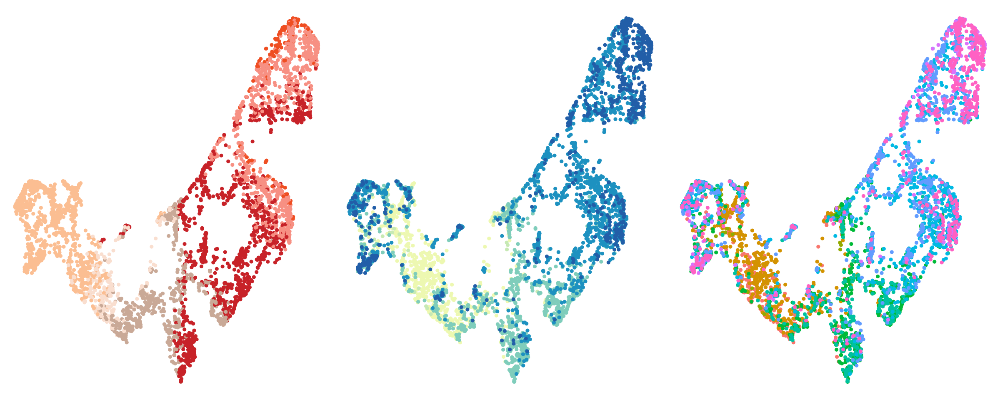

In [19]:
options(repr.plot.width=20, repr.plot.height=8)

ggarrange(
    ggplot(umap, aes(umap1, umap2, col=celltype)) + 
        geom_point() + 
        scale_colour_manual(values=opts$celltype.colors) + theme_void() + theme(legend.position="none"),
    ggplot(umap, aes(umap1, umap2, col=stage)) + 
        geom_point() + 
        scale_colour_manual(values=opts$stage.colors) + theme_void() + theme(legend.position="none"),
    ggplot(umap, aes(umap1, umap2, col=sample)) + 
        geom_point() + theme_void() + theme(legend.position="none"),
ncol=3
)

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.

Scale for 'colour' is already present. Adding another scale for 'colour',
which will replace the existing scale.



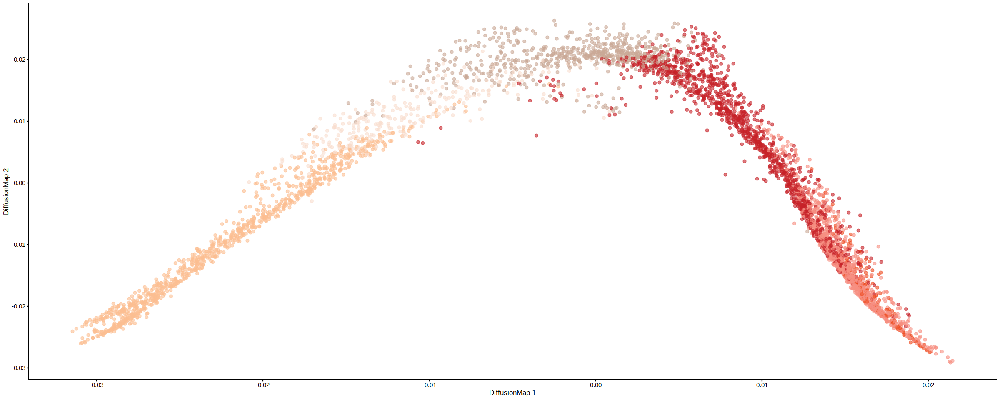

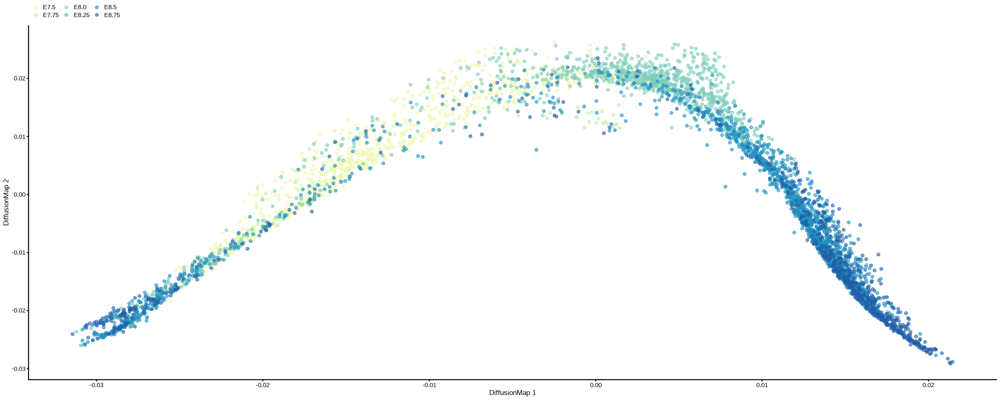

In [20]:
dm <- DiffusionMap(pca.corrected, n_pcs=args$n_pcs)
# Add to the SingleCellExperiment object
reducedDim(sce_filt, "DiffusionMap") <- dm@eigenvectors[,c(1,2)]

# Define the starting point
foo <- mean(reducedDim(sce_filt,"DiffusionMap")[sce_filt$celltype==opts$celltypes[1],"DC1"])
if (foo>0) reducedDim(sce_filt,"DiffusionMap")[,"DC1"] <- -reducedDim(sce_filt,"DiffusionMap")[,"DC1"]

# Plot
plotReducedDim(sce_filt, dimred = "DiffusionMap", colour_by="celltype", ncomponents = c(1,2)) +
  scale_colour_manual(values=opts$celltype.colors) + theme(legend.position="none")

plotReducedDim(sce_filt, dimred = "DiffusionMap", colour_by="stage", ncomponents = c(1,2)) +
  scale_colour_manual(values=opts$stage.colors) + theme(legend.position="top", legend.title = element_blank())

# inspect metacells

[1] "Number of metacells: 222"


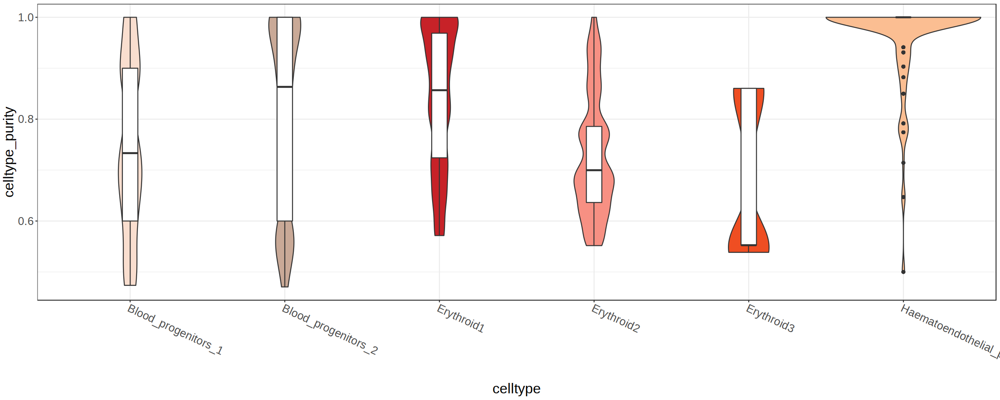

In [21]:
args$cell2metacell <- file.path(args$outdir, "cell2metacell_assignment.txt.gz")
cell2metacell.dt <- args$cell2metacell %>% map(~ fread(.)) %>% rbindlist

print(sprintf("Number of metacells: %s", length(unique(cell2metacell.dt$metacell))))


ggplot(cell2metacell.dt, aes(celltype, celltype_purity, fill=celltype)) + 
    geom_violin(width=1) + 
    geom_boxplot(width=0.1, fill='white') + 
    scale_fill_manual(values=opts$celltype.colors) +
    theme_bw() + 
    theme(axis.text.x=element_text(angle=-25, hjust=0, vjust=1),
             legend.position='none',
         text=element_text(size=20))

# aggregate_rna_metacell.R

In [22]:
#here::i_am("rna/metacells/run/aggregate_rna_metacell.R")

# source(here::here("settings.R"))
# source(here::here("utils.R"))

#library(reticulate)

In [23]:
io$basedir

[1] "/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome"

In [24]:
## START TEST ##
#args = list()
#args$metadata <- file.path(io$basedir,"results/rna/mapping/sample_metadata_after_mapping.txt.gz")
#args$sce <- file.path(io$basedir,"data/processed/rna/SingleCellExperiment.rds")
# args$cell2metacell <- file.path(io$basedir,sprintf("results/rna/metacells/%s/cell2metacell_assignment.txt.gz",opts$samples))
# args$cell2metacell <- file.path(io$basedir,"results/rna/metacells/trajectories/nmp/cell2metacell_assignment.txt.gz")
args$cell2metacell <- file.path(args$outdir, "cell2metacell_assignment.txt.gz")
args$python <- "/rds/project/rds-SDzz0CATGms/users/bt392/miniconda3/envs/env_multiome/bin/python" # "/Users/argelagr/opt/anaconda3/envs/main/bin/python"
args$metacell_min_reads <- 2e4
args$normalisation_method <- "cpm"
## END TEST ##

In [25]:
#####################
## Define settings ##
#####################

# stopifnot(file.exists(args$cell2metacell))

# # Reticulate
# use_python(args$python, required = TRUE)
# sc <- import("scanpy")

In [26]:
###########################
## Load metacell results ##
###########################

cell2metacell.dt <- args$cell2metacell %>% map(~ fread(.)) %>% rbindlist
cell2metacell.dt = cell2metacell.dt[,c('cell', 'metacell')]
# stopifnot(mapping_mnn.dt$cell%in%sample_metadata$cell)



In [27]:
###################
## Load metadata ##
###################

sample_metadata <- fread(args$metadata) %>%
  # .[cell%in%cell2metacell.dt$cell] %>%
  # .[,c("cell","sample","stage","genotype","celltype.mapped","closest.cell")] %>%
  # setnames("celltype.mapped","celltype") %>%
  merge(cell2metacell.dt,"cell")

In [28]:
###############################
## Load SingleCellExperiment ##
###############################

sce <- load_SingleCellExperiment(file=args$sce, cells=sample_metadata$cell)
colData(sce) <- sample_metadata %>% tibble::column_to_rownames("cell") %>% DataFrame



In [29]:
######################
## Filter metacells ##
######################

# nreads_per_metacell.dt <- data.table(
#   metacell = colnames(sce_pseudobulk),
#   nreads = colSums(counts(sce_pseudobulk))
# )
nreads_per_metacell.dt <- sample_metadata[,.(nreads=sum(nFeature_RNA)),by="metacell"]

# Plot
p <- gghistogram(nreads_per_metacell.dt[nreads<=1e6], x="nreads", y="..density..", bins=100, fill="gray70", color="gray50") +
  geom_vline(xintercept=args$metacell_min_reads, linetype="dashed") +
  labs(x="Number of reads per metacell", y="Density") +
  theme(
    axis.text =  element_text(size=rel(0.8)),
    axis.title.x = element_blank()
  )

pdf(file.path(args$outdir,"nreads_metacell_threshold.pdf"), width=8, height=4)
print(p)
dev.off()

png 
  2

In [30]:
# Filter
print(sprintf("Removing metacells that have less than %d reads (%d/%d)", args$metacell_min_reads, nreads_per_metacell.dt[nreads<=args$metacell_min_reads,.N], nrow(nreads_per_metacell.dt)))

metacells.to.use <- intersect(sample_metadata$cell, nreads_per_metacell.dt[nreads>=args$metacell_min_reads,metacell])
sample_metadata <- sample_metadata[metacell%in%metacells.to.use]
cell2metacell.dt <- cell2metacell.dt[metacell%in%metacells.to.use]
sce <- sce[,colnames(sce)%in%sample_metadata$cell]

###################################
## Aggregate counts per metacell ##
###################################

sce_pseudobulk <- pseudobulk_sce_fn(
  x = sce,
  assay = "counts",
  by = "metacell",
  fun = "sum",
  scale = FALSE # Should pseudo-bulks be scaled with the effective library size & multiplied by 1M?
)

# set assay name
assayNames(sce_pseudobulk) <- "counts"

[1] "Removing metacells that have less than 20000 reads (6/222)"


In [31]:
###################
## Normalisation ##
###################

if (args$normalisation_method=="deseq2") {
  
  suppressPackageStartupMessages(library(DESeq2))
  dds <- DESeqDataSet(sce_pseudobulk, design=~1)
  dds <- varianceStabilizingTransformation(dds)
  logcounts(sce_pseudobulk) <- assay(dds)
  
} else if (args$normalisation_method=="cpm") {
  
  logcounts(sce_pseudobulk) <- log2(1e6*(sweep(counts(sce_pseudobulk),2,colSums(counts(sce_pseudobulk)),"/"))+1)
  # atac.mtx <- log2(t(t(assay(atac.se)) / colSums(assay(atac.se))) * 1e6)
  
} else {
  stop("Normalisation method not recognised")
}

In [32]:
##############################
## Define metacell metadata ##
##############################

metacell_metadata.dt <- sample_metadata %>%
  .[,c("cell","sample","stage","genotype","celltype","closest.cell")] %>%
  .[cell%in%colnames(sce_pseudobulk)] %>% setkey(cell) %>% .[colnames(sce_pseudobulk)] %>%
  setnames("cell","metacell") %>%
  merge(cell2metacell.dt[,.(ncells=.N),by="metacell"],by="metacell")

# Add QC stats
tmp <- data.table(
  metacell = colnames(sce_pseudobulk), 
  nFeature_RNA = colSums(counts(sce_pseudobulk))
)
metacell_metadata.dt <- metacell_metadata.dt %>% merge(tmp,by="metacell")

# Add metacell metadata as colData
stopifnot(metacell_metadata.dt$metacell == colnames(sce_pseudobulk))
colData(sce_pseudobulk) <- metacell_metadata.dt %>% tibble::column_to_rownames("metacell") %>% DataFrame

In [33]:
#############################################
## Convert SingleCellExperiment to anndata ##
#############################################

# adata_sce <- sc$AnnData(
#     X   = t(counts(sce_pseudobulk)),
#     obs = as.data.frame(colData(sce_pseudobulk)),
#     var = data.frame(gene=rownames(sce_pseudobulk), row.names=rownames(sce_pseudobulk))
# )


# Add cell type colors
# adata_sce$uns$update(celltype_colors = opts$celltype.colors[sort(unique(as.character(adata_sce$obs$celltype)))])
# adata_sce$uns["celltype_colors"]

##########
## Save ##
##########

#adata_sce$write_h5ad(file.path(args$outdir,"anndata_metacells.h5ad"))
fwrite(metacell_metadata.dt, file.path(args$outdir,"metacells_metadata.txt.gz"), sep="\t", quote=F, na="NA")
saveRDS(sce_pseudobulk, file.path(args$outdir,"SingleCellExperiment_metacells.rds"))

In [34]:
sce_pseudobulk

class: SingleCellExperiment 
dim: 32285 216 
metadata(2): agg_pars n_cells
assays(2): counts logcounts
rownames(32285): Xkr4 Gm1992 ... AC234645.1 AC149090.1
rowData names(0):
colnames(216): E7.5_rep1#AATCTCAAGGAGTAAT-1
  E7.5_rep1#AATGCATGTAGTTACG-1 ... E8.75_rep2#TGGACTAGTCATGCCC-1
  E8.75_rep2#TTGGGCGGTCAAGACC-1
colData names(7): sample stage ... ncells nFeature_RNA
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):

# aggregate_atac_metacell

In [35]:
suppressPackageStartupMessages(library(ArchR))
addArchRVerbose(verbose = FALSE)

Setting addArchRVerbose = FALSE



In [36]:
###################
## Load settings ##
###################

# START TEST ##
args$archr_directory <- file.path(io$basedir,"data/processed/atac/archR")
args$metadata <- file.path(io$basedir,"results/atac/archR/celltype_assignment/sample_metadata_after_celltype_assignment.txt.gz")
args$cell2metacell <- file.path(args$outdir, "cell2metacell_assignment.txt.gz")
args$matrices <- c("PeakMatrix") # c("PeakMatrix", "GeneScoreMatrix_distal", "GeneScoreMatrix_TSS")
args$metacell_min_frags <- 2e5
## END TEST ##

In [37]:
###########################
## Load metacell results ##
###########################

cell2metacell.dt <- args$cell2metacell %>% map(~ fread(.)) %>% rbindlist
cell2metacell.dt = cell2metacell.dt[,c('cell', 'metacell')]

###################
## Load metadata ##
###################

sample_metadata <- fread(args$metadata) %>%
  .[pass_atacQC==TRUE] %>% # temporary 
  # .[cell%in%cell2metacell.dt$cell] %>%
  # .[,c("cell","sample","stage","genotype","celltype.mapped","closest.cell")] %>%
  merge(cell2metacell.dt,"cell")

print(sprintf("Number of metacells before filtering by minimum number of fragments: %s", length(unique(sample_metadata$metacell))))

[1] "Number of metacells before filtering by minimum number of fragments: 222"


In [38]:
######################
## Filter metacells ##
######################

nfrags_per_metacell.dt <- sample_metadata[,.(nfrags=sum(nFrags_atac)),by="metacell"]

# Plot
p <- gghistogram(nfrags_per_metacell.dt[nfrags<=5e6], x="nfrags", y="..density..", bins=100, fill="gray70", color="gray50") +
  geom_vline(xintercept=args$metacell_min_frags, linetype="dashed") +
  labs(x="Number of ATAC fragments per metacell", y="Density") +
  theme(
    axis.text =  element_text(size=rel(0.8)),
    axis.title.x = element_blank()
  )

pdf(file.path(args$outdir,"nfrags_metacell_threshold.pdf"), width=8, height=4)
print(p)
dev.off()

metacells.to.use <- intersect(sample_metadata$cell, nfrags_per_metacell.dt[nfrags>=args$metacell_min_frags,metacell])
sample_metadata <- sample_metadata[metacell%in%metacells.to.use]
cell2metacell.dt <- cell2metacell.dt[metacell%in%metacells.to.use]

print(sprintf("Number of metacells after filtering by total number of fragments: %s", length(unique(sample_metadata$metacell))))

png 
  2

[1] "Number of metacells after filtering by total number of fragments: 175"


In [39]:
########################
## Load ArchR Project ##
########################

setwd(args$archr_directory)

addArchRGenome("mm10")
addArchRThreads(threads = 1) 

ArchRProject <- loadArchRProject(args$archr_directory)

# Subset metacells
ArchRProject <- ArchRProject[sample_metadata$cell]

# Sanity checks
stopifnot(args$matrices%in%getAvailableMatrices(ArchRProject))

Setting default genome to Mm10.

Setting default number of Parallel threads to 1.

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\__

In [40]:
#############################################
## Add metacell assignment to ArchR object ##
#############################################

tmp <- sample_metadata %>% 
  .[cell%in%rownames(ArchRProject)] %>% setkey(cell) %>% .[rownames(ArchRProject)] %>%
  as.data.frame() %>% tibble::column_to_rownames("cell")
stopifnot(all(rownames(tmp) == rownames(getCellColData(ArchRProject))))
ArchRProject <- addCellColData(
  ArchRProject,
  data = tmp$metacell,
  name = "metacell",
  cells = rownames(tmp),
  force = TRUE
)

In [41]:
###################################################
## Pseudobulk into a SummarizedExperiment object ##
###################################################

# i <- "PeakMatrix"
for (i in args$matrices) {
  print(sprintf("Calculating pseudobulk matrix for %s",i))
  
  # summarise
  atac_metacells.se <- getGroupSE(ArchRProject, groupBy = "metacell", useMatrix = i, divideN = FALSE)
  
  # rename features
  if (grepl("peak",tolower(i),ignore.case=T)) {
    rownames(atac_metacells.se) <- rowData(atac_metacells.se) %>% as.data.table %>% .[,idx:=sprintf("%s:%s-%s",seqnames,start,end)] %>% .$id
  }
  if (grepl("gene",tolower(i),ignore.case=T)) {
    rownames(atac_metacells.se) <- rowData(atac_metacells.se)$name
  }
  
  # TO-DO: ADD CELL METADATA LIKE CELLTYPE
  # colData(atac_metacells.se) <- metacell_metadata.dt %>% tibble::column_to_rownames("metacell") %>% DataFrame
  
  # save
  saveRDS(atac_metacells.se, file.path(args$outdir,sprintf("%s_summarized_experiment_metacells.rds",i)))
}

[1] "Calculating pseudobulk matrix for PeakMatrix"


In [42]:
##############################
## Define metacell metadata ##
##############################

metacell_metadata.dt <- sample_metadata %>%
  .[cell%in%colnames(atac_metacells.se)] %>% setkey(cell) %>% .[colnames(atac_metacells.se)] %>%
  .[,c("metacell", "cell", "sample", "stage", "genotype",  "celltype", "closest.cell")] %>%
  merge(cell2metacell.dt[,.(ncells=.N),by="metacell"],by="metacell")

# Add QC stats
tmp <- data.table(
  metacell = colnames(atac_metacells.se), 
  nFrags_atac = colSums(assay(atac_metacells.se))
)
metacell_metadata.dt <- metacell_metadata.dt %>% merge(tmp,by="metacell")

In [43]:
####################################
## Plot coverage before and after ##
####################################

to.plot <- rbind(
  metacell_metadata.dt[,c("metacell","nFrags_atac")] %>% .[,class:="metacell"],
  sample_metadata[,c("metacell","nFrags_atac")] %>% .[,class:="cell"]
) %>% .[,log_nFrags_atac:=log10(nFrags_atac)] 

p <- gghistogram(to.plot, x="log_nFrags_atac", fill="class", bins=100) +
  labs(x="Number of ATAC fragments (log10)") +
  theme(
    legend.title = element_blank(),
    axis.text = element_text(size=rel(0.75), color="black")
  )

pdf(file.path(args$outdir,"nfrags_before_vs_after.pdf"), width=7, height=4)
print(p)
dev.off()

png 
  2

In [44]:
##########
## Save ##
##########

fwrite(metacell_metadata.dt, file.path(args$outdir,"metacells_metadata.txt.gz"), sep="\t", quote=F, na="NA")

# run_cor_TFexpr_vs_peakAcc_metacells

In [45]:
## START TEST ##
args$sce <- file.path(args$outdir,"SingleCellExperiment_metacells.rds")
args$atac_peak_matrix <- file.path(args$outdir,"PeakMatrix_summarized_experiment_metacells.rds")
args$motif_annotation <- "CISBP"
args$motifmatcher <- file.path(io$basedir,sprintf("data/processed/atac/archR/Annotations/%s-Scores.rds",args$motif_annotation))
args$motif2gene <- file.path(io$basedir,sprintf("data/processed/atac/archR/Annotations/%s_motif2gene.txt.gz",args$motif_annotation))
## END TEST ##

In [46]:
#######################
## Load RNA and ATAC ##
#######################

# Load SingleCellExperiment
rna_metacells.sce <- readRDS(args$sce)

# Load ATAC SummarizedExperiment
atac_peakMatrix_metacells.se <- readRDS(args$atac_peak_matrix)

# Normalise ATAC data
assayNames(atac_peakMatrix_metacells.se) <- "counts"
assay(atac_peakMatrix_metacells.se,"logcounts") <- log(1e6*(sweep(assay(atac_peakMatrix_metacells.se),2,colSums(assay(atac_peakMatrix_metacells.se),na.rm=T),"/"))+1)

# Make sure that samples are consistent
samples <- intersect(colnames(rna_metacells.sce),colnames(atac_peakMatrix_metacells.se))
rna_metacells.sce <- rna_metacells.sce[,samples]
atac_peakMatrix_metacells.se <- atac_peakMatrix_metacells.se[,samples]

print(sprintf("Number of metacells: %s",length(samples)))

[1] "Number of metacells: 175"


In [47]:
###############################
## Load motifmatcher results ##
###############################

motifmatcher.se <- readRDS(args$motifmatcher)

# Subset peaks
stopifnot(sort(rownames(motifmatcher.se))==sort(rownames(atac_peakMatrix_metacells.se)))
motifmatcher.se <- motifmatcher.se[rownames(atac_peakMatrix_metacells.se),]

###########################
## Load motif annotation ##
###########################

motif2gene.dt <- fread(args$motif2gene)

In [48]:
################
## Filter TFs ##
################

motifs <- intersect(colnames(motifmatcher.se),motif2gene.dt$motif)
motifmatcher.se <- motifmatcher.se[,motifs]
motif2gene.dt <- motif2gene.dt[motif%in%motifs]

genes <- intersect(toupper(rownames(rna_metacells.sce)),motif2gene.dt$gene)
rna_tf_metacells.sce <- rna_metacells.sce[str_to_title(genes),]
rownames(rna_tf_metacells.sce) <- toupper(rownames(rna_tf_metacells.sce))
motif2gene.dt <- motif2gene.dt[gene%in%genes]

# Manually remove some motifs
motif2gene.dt <- motif2gene.dt[!motif%in%c("T_789")]

# Remove duplicated gene-motif pairs
genes.to.remove <- names(which(table(motif2gene.dt$gene)>1))
cat(sprintf("Removing %d TFs that have duplicated gene-motif pairs:\n%s", length(genes.to.remove), paste(genes.to.remove, collapse=", ")))
motif2gene.dt <- motif2gene.dt[!gene%in%genes.to.remove]
rna_tf_metacells.sce <- rna_tf_metacells.sce[rownames(rna_tf_metacells.sce)%in%motif2gene.dt$gene]
motifmatcher.se <- motifmatcher.se[,colnames(motifmatcher.se)%in%motif2gene.dt$motif]
stopifnot(table(motif2gene.dt$gene)==1)

Removing 0 TFs that have duplicated gene-motif pairs:


In [49]:
#########################################################
## Correlate peak accessibility with TF RNA expression ##
#########################################################

# Sanity checks
stopifnot(colnames(rna_tf_metacells.sce)==colnames(atac_peakMatrix_metacells.se))

TFs <- rownames(rna_tf_metacells.sce)

# Prepare output data objects
cor.mtx <- matrix(as.numeric(NA), nrow=nrow(atac_peakMatrix_metacells.se), ncol=length(TFs))
pvalue.mtx <- matrix(as.numeric(NA), nrow=nrow(atac_peakMatrix_metacells.se), ncol=length(TFs))
rownames(cor.mtx) <- rownames(atac_peakMatrix_metacells.se); colnames(cor.mtx) <- TFs
dimnames(pvalue.mtx) <- dimnames(cor.mtx)

# i <- "GATA1"
for (i in TFs) {
  motif_i <- motif2gene.dt[gene==i,motif]
  
  print(i)
  all_peaks_i <- rownames(motifmatcher.se)[which(assay(motifmatcher.se[,motif_i],"motifMatches")==1)]
  
  # calculate correlations
  corr_output <- psych::corr.test(
    x = t(logcounts(rna_tf_metacells.sce[i,])), 
    y = t(assay(atac_peakMatrix_metacells.se[all_peaks_i,],"logcounts")), 
    ci = FALSE
  )
  
  # Fill matrices
  cor.mtx[all_peaks_i,i] <- round(corr_output$r[1,],3)
  pvalue.mtx[all_peaks_i,i] <- round(corr_output$p[1,],10)
}

[1] "SOX17"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "MYBL1"
[1] "MSC"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "TFAP2D"
[1] "TFAP2B"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ARID5A"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "NPAS2"
[1] "RFX8"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "POU3F3"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "STAT4"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "STAT1"
[1] "HSFY2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "KLF7"
[1] "CREB1"
[1] "FEV"
[1] "PAX3"
[1] "GBX2"
[1] "TWIST2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "TFCP2L1"
[1] "GLI2"
[1] "EN1"
[1] "ELK4"
[1] "SOX13"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "MYOG"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ELF3"
[1] "NR5A2"
[1] "LHX9"
[1] "LHX4"
[1] "PRRX1"
[1] "TBX19"
[1] "POU2F1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "RXRG"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "LMX1A"
[1] "PBX1"
[1] "ATF6"
[1] "NR1I3"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "USF1"
[1] "NHLH1"
[1] "MIXL1"
[1] "HLX"
[1] "ESRRG"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "PROX1"
[1] "BATF3"
[1] "ATF3"
[1] "IRF6"
[1] "GATA3"
[1] "PTF1A"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "TBPL2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "PAX8"
[1] "LHX3"
[1] "RXRA"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "GFI1B"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "BARHL1"
[1] "PRRX2"
[1] "NAIF1"
[1] "LMX1B"
[1] "PBX3"
[1] "LHX6"
[1] "ZBTB6"
[1] "LHX2"
[1] "NR5A1"
[1] "NR6A1"
[1] "NR4A2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "TBR1"
[1] "SP5"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "DLX1"
[1] "DLX2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "SP3"
[1] "SP9"
[1] "ATF2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "EVX2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "HOXD13"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "HOXD12"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "HOXD11"
[1] "HOXD10"
[1] "HOXD9"
[1] "HOXD8"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "HOXD3"
[1] "HOXD4"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "HOXD1"
[1] "NFE2L2"
[1] "NEUROD1"
[1] "SPI1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "NR1H3"
[1] "CREB3L1"
[1] "ALX4"
[1] "EHF"
[1] "ELF5"
[1] "LMO2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "WT1"
[1] "PAX6"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "MEIS2"
[1] "MGA"
[1] "CENPB"
[1] "INSM1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "NKX2-4"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "NKX2-2"
[1] "PAX1"
[1] "FOXA2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "VSX1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "SCRT2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "TCF15"
[1] "SOX12"
[1] "ID1"
[1] "FOXS1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "E2F1"
[1] "TGIF2"
[1] "MAFB"
[1] "MYBL2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "HNF4A"
[1] "SNAI1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "CEBPB"
[1] "NFATC2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "TFAP2C"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "CTCFL"
[1] "GATA5"
[1] "TCFL5"
[1] "BHLHE23"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "GMEB2"
[1] "SOX18"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "HNF4G"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "HEY1"
[1] "E2F5"
[1] "BHLHE22"
[1] "HLTF"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "MECOM"
[1] "SOX2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ELF2"
[1] "FOXO1"
[1] "SMAD9"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "SOHLH2"
[1] "SHOX2"
[1] "ETV3"
[1] "MEF2D"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ZBTB7B"
[1] "CREB3L4"
[1] "RORC"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "RFX5"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ARNT"
[1] "TBX15"
[1] "NHLH2"
[1] "ALX3"
[1] "NEUROG2"
[1] "PITX2"
[1] "LEF1"
[1] "NFKB1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "FUBP1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "LHX8"
[1] "PLAG1"
[1] "POU3F2"
[1] "BACH2"
[1] "TOPORS"
[1] "ARID3C"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "CREB3"
[1] "PAX5"
[1] "FOXE1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "NR4A3"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "TAL2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "KLF4"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "NFIB"
[1] "JUN"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "NFIA"
[1] "FOXD3"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "GLIS1"
[1] "DMRTA2"
[1] "FOXD2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "FOXE3"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "TAL1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "DMBX1"
[1] "YBX1"
[1] "FOXJ3"
[1] "HIVEP3"
[1] "FOXO6"
[1] "NFYC"
[1] "MYCL"
[1] "HEYL"
[1] "POU3F1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "MTF1"
[1] "TFAP2E"
[1] "GMEB1"
[1] "RUNX3"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ID3"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "E2F2"
[1] "PAX7"
[1] "ENO1"
[1] "HES2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "PRDM16"
[1] "HES5"
[1] "GBX1"
[1] "EN2"
[1] "MNX1"
[1] "TCF23"
[1] "FOSL2"
[1] "NKX1-1"
[1] "HMX1"
[1] "MSX1"
[1] "ZBTB49"
[1] "NKX3-2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "RBPJ"
[1] "KLF3"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "PHOX2B"
[1] "GSX2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "CLOCK"
[1] "REST"
[1] "LIN54"
[1] "NKX6-1"
[1] "BARHL2"
[1] "GFI1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "HNF1A"
[1] "TBX3"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "TBX5"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "LHX5"
[1] "CUX2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "KDM2B"
[1] "MLXIP"
[1] "MLXIPL"
[1] "CUX1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ZKSCAN1"
[1] "UNCX"
[1] "MAFK"
[1] "FOXK1"
[1] "BHLHA15"
[1] "GSX1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "PDX1"
[1] "CDX2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "DLX6"
[1] "DLX5"
[1] "FOXP2"
[1] "TFEC"
[1] "FEZF1"
[1] "PAX4"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "IRF5"
[1] "NRF1"
[1] "KLF14"
[1] "CREB3L2"
[1] "NOBOX"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "NFE2L3"
[1] "HOXA1"
[1] "HOXA2"
[1] "HOXA3"
[1] "HOXA4"
[1] "HOXA5"
[1] "HOXA6"
[1] "HOXA7"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "HOXA9"
[1] "HOXA11"
[1] "HOXA13"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "EVX1"
[1] "CREB5"
[1] "NEUROD6"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ATOH1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ATOH8"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "TCF7L1"
[1] "TLX2"
[1] "LBX2"
[1] "VAX2"
[1] "EMX1"
[1] "NOTO"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "EGR4"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "FIGLA"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "GATA2"
[1] "KLF15"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "NR2C2"
[1] "MITF"
[1] "FOXP1"
[1] "BHLHE40"
[1] "PPARG"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "NANOG"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "FOXJ2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "TEAD4"
[1] "FOXM1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ETV6"
[1] "SOX5"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "BHLHE41"
[1] "ARNTL2"
[1] "MZF1"
[1] "CRX"
[1] "MEIS3"
[1] "NPAS1"
[1] "MYPOP"
[1] "FOXA3"
[1] "SIX5"
[1] "FOSB"
[1] "RELB"
[1] "DMRTC2"
[1] "POU2F2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ERF"
[1] "CIC"
[1] "ETV2"
[1] "USF2"
[1] "CEBPG"
[1] "CEBPA"
[1] "SPIB"
[1] "NR1H2"
[1] "ATF5"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "IRF3"
[1] "DBP"
[1] "MYOD1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "E2F8"
[1] "KLF13"
[1] "MEF2A"
[1] "NR2F2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "MESP1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "MESP2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "CPEB1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ARNT2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "PHOX2A"
[1] "TEAD1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ARNTL"
[1] "SOX6"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "MAZ"
[1] "HMX3"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "HMX2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "FOXI2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "NKX6-2"
[1] "IRF7"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ASCL2"
[1] "SOX1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "TFDP1"
[1] "NKX6-3"
[1] "THAP1"
[1] "ZFP42"
[1] "IRF2"
[1] "HAND2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "PBX4"
[1] "MEF2B"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "JUND"
[1] "NR2F6"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "KLF2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ISX"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "NR3C2"
[1] "POU4F2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "SMAD1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "RFX1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "NFIX"
[1] "LYL1"
[1] "KLF1"
[1] "JUNB"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "IRX3"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "IRX5"
[1] "IRX6"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "CBFB"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "HSF4"
[1] "E2F4"
[1] "CTCF"
[1] "NFATC3"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "TERF2"
[1] "NFAT5"
[1] "ZFHX3"
[1] "MAF"
[1] "IRF8"
[1] "FOXF1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "FOXC2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "FOXL1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "SNAI3"
[1] "PGR"
[1] "DNMT1"
[1] "TBX20"
[1] "BARX2"
[1] "FLI1"
[1] "ETS1"
[1] "PKNOX2"
[1] "BSX"
[1] "POU2F3"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "HINFP"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ISL2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ARID3B"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "NR2E3"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "SMAD3"
[1] "RORA"
[1] "FOXB1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "TCF12"
[1] "RFX7"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ONECUT1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "GCM1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "TBX18"
[1] "ZIC1"
[1] "ZIC4"
[1] "TFDP2"
[1] "FOXL2"
[1] "SOX14"
[1] "SMARCC1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "UBP1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "EOMES"
[1] "ESR1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "PLAGL1"
[1] "HIVEP2"
[1] "OLIG3"
[1] "MYB"
[1] "TCF21"
[1] "HEY2"
[1] "FOXO3"
[1] "NR2E1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "PRDM1"
[1] "SIM1"
[1] "RFX6"
[1] "HSF2"
[1] "NEUROG3"
[1] "TET1"
[1] "ATOH7"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "EGR2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ARID5B"
[1] "AIRE"
[1] "ARID3A"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "TCF3"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ONECUT3"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "KLF16"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "CREB3L3"
[1] "ZBTB7A"
[1] "HMG20B"
[1] "NFIC"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "NFYB"
[1] "RFX4"
[1] "PRDM4"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ASCL1"
[1] "SPIC"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "NR1H4"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ELK3"
[1] "NR2C1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ALX1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "MYF5"
[1] "MYF6"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "E2F7"
[1] "HMGA2"
[1] "DDIT3"
[1] "GLI1"
[1] "STAT6"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "STAT2"
[1] "SMARCC2"
[1] "IKZF4"
[1] "NEUROD4"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "PATZ1"
[1] "XBP1"
[1] "IKZF1"
[1] "MEIS1"
[1] "OTX1"
[1] "REL"
[1] "BCL11A"
[1] "TLX3"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "FOXI1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "EBF1"
[1] "SOX30"
[1] "PROP1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "TCF7"
[1] "IRF1"
[1] "HAND1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "SREBF1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "HES7"
[1] "SOX15"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ZBTB4"
[1] "YBX2"
[1] "BCL6B"
[1] "MNT"
[1] "HIC1"
[1] "VTN"
[1] "HNF1B"
[1] "LHX1"
[1] "TBX2"
[1] "TBX4"
[1] "HLF"
[1] "DLX3"
[1] "DLX4"
[1] "HOXB13"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "HOXB9"
[1] "HOXB8"
[1] "HOXB7"
[1] "HOXB6"
[1] "HOXB5"
[1] "HOXB4"
[1] "HOXB3"
[1] "HOXB2"
[1] "HOXB1"
[1] "NFE2L1"
[1] "SP2"
[1] "SP6"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "TBX21"
[1] "NEUROD2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "THRA"
[1] "NR1D1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "RARA"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "STAT5B"
[1] "STAT5A"
[1] "STAT3"
[1] "MLX"
[1] "BRCA1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ETV4"
[1] "MEOX1"
[1] "BPTF"
[1] "SOX9"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "FOXJ1"
[1] "MAFG"
[1] "FOXK2"
[1] "OSR1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "MYCN"
[1] "E2F6"
[1] "GRHL1"
[1] "KLF11"
[1] "ID2"
[1] "SOX11"
[1] "HBP1"
[1] "FERD3L"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "TWIST1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "AHR"
[1] "MEOX2"
[1] "ETV1"
[1] "FOXG1"
[1] "NPAS3"
[1] "NKX2-1"
[1] "PAX9"
[1] "FOXA1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "SIX6"
[1] "SIX1"
[1] "SIX4"
[1] "HIF1A"
[1] "ESR2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ZBTB1"
[1] "MAX"
[1] "VSX2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "FOS"
[1] "JDP2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "BATF"
[1] "ESRRB"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "FOXN3"
[1] "GSC"
[1] "BCL11B"
[1] "YY1"
[1] "ZBTB42"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "SP4"
[1] "SP8"
[1] "KLF6"
[1] "GLI3"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "POU6F2"
[1] "ZKSCAN3"
[1] "ZKSCAN4"
[1] "SOX4"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "E2F3"
[1] "IRF4"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "FOXQ1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "FOXF2"
[1] "FOXC1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "RREB1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "TFAP2A"
[1] "GCM2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "HIVEP1"
[1] "ID4"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "BARX1"
[1] "NFIL3"
[1] "MSX2"
[1] "PITX1"
[1] "NEUROG1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "SMAD5"
[1] "IRX1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "IRX2"
[1] "IRX4"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "AHRR"
[1] "NR2F1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "MEF2C"
[1] "SPZ1"
[1] "OTP"
[1] "FOXD1"
[1] "ISL1"
[1] "FEZF2"
[1] "RARB"
[1] "THRB"
[1] "NR1D2"
[1] "HESX1"
[1] "OTX2"
[1] "CEBPE"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "HOMEZ"
[1] "ZFHX2"
[1] "NRL"
[1] "IRF9"
[1] "NFATC4"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "GATA4"
[1] "SOX7"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "HMBOX1"
[1] "NKX2-6"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "NKX3-1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "EGR3"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ELF1"
[1] "KLF5"
[1] "KLF12"
[1] "POU4F1"
[1] "SOX21"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ZIC5"
[1] "ZIC2"
[1] "OSR2"
[1] "KLF10"
[1] "ZHX1"
[1] "MYC"
[1] "MAFA"
[1] "HSF1"
[1] "SCRT1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "FOXH1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "SOX10"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "MAFF"
[1] "ATF4"
[1] "EP300"
[1] "TEF"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "SREBF2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "PPARA"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "DBX2"
[1] "ARID2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "VDR"
[1] "ATF1"
[1] "TFCP2"
[1] "POU6F1"
[1] "NR4A1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "RARG"
[1] "SP7"
[1] "SP1"
[1] "ATF7"
[1] "HOXC13"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "HOXC12"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "HOXC11"
[1] "HOXC10"
[1] "HOXC5"
[1] "HOXC9"
[1] "HOXC8"
[1] "HOXC6"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "NFE2"
[1] "TFAP4"
[1] "GLIS2"
[1] "SNAI2"
[1] "CEBPD"
[1] "HIC2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "GSC2"
[1] "TBX1"
[1] "ETV5"
[1] "BCL6"
[1] "HES1"
[1] "NR1I2"
[1] "BBX"
[1] "POU1F1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "GABPA"
[1] "BACH1"
[1] "OLIG2"
[1] "OLIG1"
[1] "RUNX1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "SIM2"
[1] "ERG"
[1] "ETS2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "T"
[1] "TBP"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ZSCAN10"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "E4F1"
[1] "SOX8"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "NKX2-5"
[1] "HMGA1"
[1] "SPDEF"
[1] "PPARD"
[1] "TEAD3"
[1] "PKNOX1"
[1] "RXRB"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "PBX2"
[1] "ATF6B"
[1] "ZBTB12"
[1] "POU5F1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "RUNX2"
[1] "CDC5L"
[1] "SRF"
[1] "TFEB"
[1] "FOXP4"
[1] "NFYA"
[1] "RFX2"
[1] "TGIF1"
[1] "CEBPZ"
[1] "SIX3"
[1] "SIX2"
[1] "EPAS1"
[1] "FOXN2"
[1] "CREM"
[1] "ZEB1"
[1] "GATA6"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "EGR1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "PURA"
[1] "NR3C1"
[1] "POU4F3"
[1] "CDX1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ONECUT2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "RAX"
[1] "TCF4"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "MBD2"
[1] "SMAD4"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "CXXC1"
[1] "ZBTB7C"
[1] "SMAD2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "NFATC1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "TBX10"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "NPAS4"
[1] "FOSL1"
[1] "OVOL1"
[1] "RELA"
[1] "ESRRA"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ZBTB3"
[1] "FOXB2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "RORB"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "KLF9"
[1] "FOXD4"
[1] "DMRT1"
[1] "DMRT3"
[1] "DMRT2"
[1] "RFX3"
[1] "GLIS3"
[1] "HHEX"
[1] "LCOR"
[1] "NKX2-3"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "PAX2"
[1] "TLX1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "LBX1"
[1] "PITX3"
[1] "NFKB2"
[1] "MXI1"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "TCF7L2"
[1] "VAX1"
[1] "EMX2"
[1] "FOXP3"
[1] "TFE3"
[1] "GATA1"
[1] "ELK1"
[1] "ZBTB33"
[1] "ELF4"
[1] "ZIC3"
[1] "SOX3"
[1] "MECP2"
[1] "NR0B1"
[1] "ARX"
[1] "ZFX"
[1] "AR"
[1] "FOXO4"
[1] "CDX4"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "TBX22"
[1] "POU3F4"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "HDX"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "ESX1"
[1] "KLF8"
[1] "YY2"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


[1] "SRY"


Warning message in cor(x, y, use = use, method = method):
“the standard deviation is zero”


In [50]:

##########
## Save ##
##########

to.save <- SummarizedExperiment(
  assays = SimpleList("cor" = dropNA(cor.mtx), "pvalue" = dropNA(pvalue.mtx)),
  rowData = rowData(atac_peakMatrix_metacells.se)
)
saveRDS(to.save, file.path(args$outdir,sprintf("%s_cor_TFexpr_vs_peakAcc.rds",args$motif_annotation)))

# create_virtual_chipseq_library_metacells

In [51]:
args$peak_metadata <- file.path(io$basedir,"data/processed/atac/archR/PeakCalls/peak_metadata.tsv.gz")
args$tf2peak_cor <- file.path(args$outdir,sprintf("%s_cor_TFexpr_vs_peakAcc.rds",args$motif_annotation))
# args$max_acc_score <- 4.5
args$min_peak_score <- 15

args$min_number_peaks <- 50
# args$outdir <- file.path(io$basedir,"results/rna_atac/virtual_chipseq/metacells/JASPAR/test")
#args$outdir <- file.path(io$basedir,sprintf("results/rna_atac/virtual_chipseq/metacells/trajectories/nmp/%s/test",args$motif_annotation))
args$threads <- 1

#####################
## Define settings ##
#####################

# I/O
dir.create(args$outdir, showWarnings = F, recursive = T)

# Parallel processing
# plan(sequential)
#plan(multisession, workers=args$threads)

In [52]:
###############################
## Load pseudobulk ATAC data ##
###############################

# Load ATAC SummarizedExperiment
atac_peak_matrix_metacells.se <- readRDS(args$atac_peak_matrix)

# Normalise
assayNames(atac_peak_matrix_metacells.se) <- "counts"
assay(atac_peak_matrix_metacells.se,"logcounts") <- log2(1e6*(sweep(assay(atac_peak_matrix_metacells.se),2,colSums(assay(atac_peak_matrix_metacells.se)),"/"))+0.5)

# Load peak metadata
peak_metadata.dt <- fread(args$peak_metadata) %>% 
  # .[score>=args$min_peak_score] %>%
  .[,idx:=sprintf("%s:%s-%s",chr,start,end)]

In [53]:

######################
## Load motifmatchR ##
######################

motifmatcher.se <- readRDS(args$motifmatcher)

# Subset peaks
stopifnot(sort(rownames(motifmatcher.se))==sort(rownames(atac_peak_matrix_metacells.se)))
motifmatcher.se <- motifmatcher.se[rownames(atac_peak_matrix_metacells.se),]

In [54]:
###############################
## Load TF2peak correlations ##
###############################

tf2peak_cor.se <- readRDS(args$tf2peak_cor)

stopifnot(rownames(tf2peak_cor.se)%in%rownames(motifmatcher.se))
stopifnot(rownames(tf2peak_cor.se)%in%rownames(atac_peak_matrix_metacells.se))

In [55]:
##################
## Subset peaks ##
##################

peaks <- Reduce(intersect,list(rownames(motifmatcher.se),rownames(tf2peak_cor.se),peak_metadata.dt$idx))

print(sprintf("Number of peaks: %s",length(peaks)))

# motifmatcher.se <- motifmatcher.se[peaks,]
tf2peak_cor.se <- tf2peak_cor.se[peaks,]
atac_peak_matrix_metacells.se <- atac_peak_matrix_metacells.se[peaks,]
peak_metadata.dt <- peak_metadata.dt[idx%in%peaks]

[1] "Number of peaks: 192251"


In [56]:
################################
## Load motif2gene annotation ##
################################

motif2gene.dt <- fread(args$motif2gene)

# Manually remove some motifs
motif2gene.dt <- motif2gene.dt[!motif%in%c("T_789")]

In [57]:
################
## Rename TFs ##
################

motifs <- intersect(colnames(motifmatcher.se),motif2gene.dt$motif)
TFs <- intersect(colnames(tf2peak_cor.se),motif2gene.dt$gene)

motif2gene_filt.dt <- motif2gene.dt[motif%in%motifs & gene%in%TFs]
motifs <- motif2gene_filt.dt$motif
TFs <- motif2gene_filt.dt$gene

tmp <- TFs; names(tmp) <- motifs

stopifnot(motif2gene_filt.dt$motif%in%colnames(motifmatcher.se))
stopifnot(motif2gene_filt.dt$gene%in%colnames(tf2peak_cor.se))

motifmatcher.se <- motifmatcher.se[,motifs]
colnames(motifmatcher.se) <- tmp[colnames(motifmatcher.se)]
tf2peak_cor.se <- tf2peak_cor.se[,TFs]
stopifnot(colnames(motifmatcher.se)==colnames(tf2peak_cor.se))

In [58]:
##################
## Prepare data ##
##################

tf2peak_cor.mtx <- assay(tf2peak_cor.se,"cor")
motifmatcher.mtx <- assay(motifmatcher.se,"motifScores")
atac.mtx <- assay(atac_peak_matrix_metacells.se[peaks,],"logcounts") %>% round(3)

In [59]:
######################################
## Create virtual chip-seq library ##
######################################

print("Predicting TF binding sites...")

# opts$TFs <- c("T", "ZIC2", "SOX2", "TAL1", "GATA1", "FOXA2", "GATA4", "NKX2-5")
opts$TFs <- TFs
stopifnot(!duplicated(opts$TFs))
print(sprintf("Number of TFs: %s",length(opts$TFs)))

# i <- "GATA1"
# virtual_chip.dt <- opts$TFs %>% future_map(function(i) {
virtual_chip.dt <- opts$TFs %>% map(function(i) {
  print(sprintf("%s (%s/%s)",i,match(i,opts$TFs),length(opts$TFs)))
  
  # motif <- motif2gene.dt[gene==i,motif]
  # stopifnot(length(motif)==1)

  # peaks <- names(which(abs(assay(tf2peak_cor.se[peaks,i],"cor")[,1])>=0))
  peaks <- names(which(abs(tf2peak_cor.mtx[,i])>0)) # we only consider chromatin activators
  
  if (length(peaks)>=args$min_number_peaks) {
    
    # calculate accessibility score
    # max_accessibility_score <- apply(assay(atac_peak_matrix_metacells.se[peaks,]),1,max) %>% round(2)
    max_accessibility_score <- apply(atac.mtx[peaks,],1,max) %>% round(2)
    # max_accessibility_score[max_accessibility_score>=args$max_acc_score] <- args$max_acc_score
    
    # calculate correlation score
    # correlation_score <- assay(tf2peak_cor.se[,i],"cor")[peaks,1] %>% round(2)
    correlation_score <- tf2peak_cor.mtx[peaks,i] %>% round(2)
    correlation_score[correlation_score==0] <- NA
    
    # calculate motif score
    # motif_score <- assay(motifmatcher.se[peaks,motif2gene.dt[gene==i,motif]],"motifScores")[,1]
    motif_score <- motifmatcher.mtx[peaks,i]
    motif_score <- round(motif_score/max(motif_score),2)
    
    # calculate motif counts
    # motif_counts <- assay(motifmatcher.se[peaks,i],"motifCounts")[,1] %>% round(2)
    
    # predicted_score <- minmax.normalisation(max_accessibility_score * correlation_score * motif_score * motif_counts) 
    predicted_score <- correlation_score * minmax.normalisation(max_accessibility_score * motif_score)
    # predicted_score <- predicted_score/max(predicted_score,na.rm=T) %>% round(2)
    
    tmp <- data.table(
      peak = peaks, 
      correlation_score = correlation_score,
      max_accessibility_score = max_accessibility_score,
      motif_score = motif_score,
      # motif_counts = motif_counts,
      score = round(predicted_score,2)
    ) %>% sort.abs("score") %>% 
      # .[motif_score==0,motif_score:=NA] %>%
      .[,c("peak","score","correlation_score","max_accessibility_score","motif_score")]
    
    # bed.dt <- tmp %>% copy %>%
    #   .[,peak:=str_replace(peak,":","-")] %>%
    #   .[,chr:=strsplit(peak,"-") %>% map_chr(1)] %>%
    #   .[,start:=strsplit(peak,"-") %>% map_chr(2)] %>%
    #   .[,end:=strsplit(peak,"-") %>% map_chr(3)] %>%
    #   .[,c("chr","start","end","score")]
    
    # Save 
#    fwrite(tmp, sprintf("%s/%s.txt.gz",args$outdir,i), sep="\t", quote=F, col.names = T)
#    fwrite(bed.dt, sprintf("%s/%s.bed.gz",args$outdir,i), sep="\t", quote=F, col.names = F)
    
    to_return.dt <- tmp[!is.na(score),c("peak","score")] %>% .[,tf:=i]
    return(to_return.dt)
  }
}) %>% rbindlist


[1] "Predicting TF binding sites..."
[1] "Number of TFs: 738"
[1] "TFAP2B (1/738)"
[1] "TFAP2D (2/738)"
[1] "TFAP2C (3/738)"
[1] "TFAP2E (4/738)"
[1] "TFAP2A (5/738)"
[1] "ARID3A (6/738)"
[1] "ARID5B (7/738)"
[1] "ARID3B (8/738)"
[1] "ARID5A (9/738)"
[1] "ARID3C (10/738)"
[1] "ARID2 (11/738)"
[1] "HMGA1 (12/738)"
[1] "HMGA2 (13/738)"
[1] "MAX (14/738)"
[1] "MLXIPL (15/738)"
[1] "ARNTL2 (16/738)"
[1] "AHRR (17/738)"
[1] "TFE3 (18/738)"
[1] "HES2 (19/738)"
[1] "MNT (20/738)"
[1] "TCF3 (21/738)"
[1] "SREBF1 (22/738)"
[1] "TFAP4 (23/738)"
[1] "HIF1A (24/738)"
[1] "TCFL5 (25/738)"
[1] "USF2 (26/738)"
[1] "TFEC (27/738)"
[1] "AHR (28/738)"
[1] "MLX (29/738)"
[1] "MYF6 (30/738)"
[1] "SIM1 (31/738)"
[1] "TFEB (32/738)"
[1] "HAND1 (33/738)"
[1] "HES1 (34/738)"
[1] "ID2 (35/738)"
[1] "EPAS1 (36/738)"
[1] "MYCL (37/738)"
[1] "ID3 (38/738)"
[1] "TCF21 (39/738)"
[1] "MXI1 (40/738)"
[1] "MYOG (41/738)"
[1] "TWIST1 (42/738)"
[1] "NEUROG3 (43/738)"
[1] "BHLHE41 (44/738)"
[1] "BHLHE23 (45/738)"
[1] "TC

In [60]:
########################
## Save sparse matrix ##
########################

virtual_chip.mtx <- virtual_chip.dt %>% 
  .[,peak:=factor(peak,levels=rownames(motifmatcher.se))] %>%
  data.table::dcast(peak~tf, value.var="score", fill=0, drop=F) %>%
  matrix.please %>% Matrix::Matrix(.)

saveRDS(virtual_chip.mtx, file.path(args$outdir,"virtual_chip_matrix.rds"))

In [61]:
###################################################################
## Update motifmatchr results using the virtual ChIP-seq library ##
###################################################################

print("Updating motifmatchr results using the virtual ChIP-seq library...")

motifmatcher_chip.se <- motifmatcher.se[,colnames(virtual_chip.mtx)]
# assays(motifmatcher_chip.se) <- assays(motifmatcher_chip.se)[c("motifScores")]

# reset motif matches
stopifnot(rownames(virtual_chip.mtx)==rownames(motifmatcher_chip.se))
stopifnot(colnames(virtual_chip.mtx)==colnames(motifmatcher_chip.se))
assay(motifmatcher_chip.se,"VirtualChipScores") <- virtual_chip.mtx
saveRDS(motifmatcher_chip.se, file.path(args$outdir,"motifmatchr_virtual_chip.rds"))

[1] "Updating motifmatchr results using the virtual ChIP-seq library..."


# link_TF2genes_virtual_chip

In [62]:
# START TEST
args$motif_annotation <- "CISBP"
args$virtual_chip_matrix <- file.path(args$outdir,"virtual_chip_matrix.rds")
args$peak2gene <- file.path(io$basedir,"results/atac/archR/peak_calling/peaks2genes/peaks2genes_all.txt.gz")
args$distance <- 5e4
args$min_chip_score <- 0.15
args$outfile <- file.path(args$outdir, "TF2gene_after_virtual_chip.txt.gz")
# END TEST

In [63]:
###########################
## Load virtual ChIP-seq ##
###########################

virtual_chip.mtx <- readRDS(args$virtual_chip_matrix)

In [64]:
#########################################################
## Load peak2gene linkages using only genomic distance ##
#########################################################

peak2gene.dt <- fread(args$peak2gene) %>%
  # peak2gene.dt <- fread(io$archR.peak2gene.nearest) %>%
  .[dist<=args$distance] %>%
  .[,peak:=sprintf("chr%s:%s-%s",chr,peak.start,peak.end)]

# Sanity checks
stopifnot(length(intersect(rownames(virtual_chip.mtx),unique(peak2gene.dt$peak)))>1e5)

In [65]:
#########################################################
## Link TFs to target genes using the virtual ChIP-seq ##
#########################################################

tf2gene_chip.dt <- colnames(virtual_chip.mtx) %>% map(function(i) {
  print(i)
  # Select target peaks (note that we only take positive correlations into account)
  target_peaks_i <- names(which(virtual_chip.mtx[,i]>=args$min_chip_score))
  
  if (length(target_peaks_i)>=1) {
    
    tmp <- data.table(
      tf = i,
      peak = target_peaks_i,
      chip_score = virtual_chip.mtx[target_peaks_i,i]
    ) %>% merge(peak2gene.dt[peak%in%target_peaks_i,c("peak","gene","dist")], by="peak")
    
    # print(sprintf("%s: %s target peaks & %s target genes",i,length(target_peaks_i),length(unique(tmp$gene))))
    return(tmp)
  }
}) %>% rbindlist

# Save
fwrite(tf2gene_chip.dt, args$outfile, sep="\t")

[1] "AHR"
[1] "AHRR"
[1] "AIRE"
[1] "ALX1"
[1] "ALX3"
[1] "ALX4"
[1] "AR"
[1] "ARID2"
[1] "ARID3A"
[1] "ARID3B"
[1] "ARID3C"
[1] "ARID5A"
[1] "ARID5B"
[1] "ARNT"
[1] "ARNT2"
[1] "ARNTL"
[1] "ARNTL2"
[1] "ARX"
[1] "ASCL1"
[1] "ASCL2"
[1] "ATF1"
[1] "ATF2"
[1] "ATF3"
[1] "ATF4"
[1] "ATF5"
[1] "ATF6"
[1] "ATF6B"
[1] "ATF7"
[1] "ATOH1"
[1] "ATOH8"
[1] "BACH1"
[1] "BACH2"
[1] "BARHL1"
[1] "BARHL2"
[1] "BARX1"
[1] "BARX2"
[1] "BATF"
[1] "BATF3"
[1] "BBX"
[1] "BCL11A"
[1] "BCL11B"
[1] "BCL6"
[1] "BCL6B"
[1] "BHLHA15"
[1] "BHLHE22"
[1] "BHLHE40"
[1] "BHLHE41"
[1] "BPTF"
[1] "BRCA1"
[1] "BSX"
[1] "CBFB"
[1] "CDC5L"
[1] "CDX1"
[1] "CDX2"
[1] "CDX4"
[1] "CEBPA"
[1] "CEBPB"
[1] "CEBPD"
[1] "CEBPG"
[1] "CEBPZ"
[1] "CENPB"
[1] "CIC"
[1] "CLOCK"
[1] "CPEB1"
[1] "CREB1"
[1] "CREB3"
[1] "CREB3L1"
[1] "CREB3L2"
[1] "CREB3L3"
[1] "CREB3L4"
[1] "CREB5"
[1] "CREM"
[1] "CRX"
[1] "CTCF"
[1] "CTCFL"
[1] "CUX1"
[1] "CUX2"
[1] "CXXC1"
[1] "DBP"
[1] "DBX2"
[1] "DDIT3"
[1] "DLX1"
[1] "DLX2"
[1] "DLX3"
[1] "DLX4"


# build_global_GRN_metacells

In [66]:
library(cowplot)


Attaching package: ‘cowplot’


The following object is masked from ‘package:ggpubr’:

    get_legend




In [67]:
#####################
## Define settings ##
#####################

# I/O
io$trajectory <- file.path(args$outdir, "metacell_trajectory.txt.gz")
io$sce <- file.path(args$outdir, 'SingleCellExperiment_metacells.rds')
io$tf2gene_virtual_chip <- file.path(args$outdir, "TF2gene_after_virtual_chip.txt.gz")

# Options
# opts$celltypes <- setdiff(opts$celltypes, c("ExE_endoderm","ExE_ectoderm","Parietal_endoderm"))
opts$trajectory_name <- "nmp"
opts$min_chip_score <- 0.15
opts$max_distance <- 5e4
opts$ncores <- 4


In [68]:
####################################################
## Load TF2gene links based on in silico ChIP-seq ##
####################################################

tf2gene_chip.dt <- fread(io$tf2gene_virtual_chip) %>%
  .[chip_score>=opts$min_chip_score & dist<=opts$max_distance] %>% 
  .[,c("tf","gene")] %>% unique # Only keep TF-gene links

In [69]:
head(fread(io$tf2gene_virtual_chip))

peak,tf,chip_score,gene,dist
<chr>,<chr>,<dbl>,<chr>,<int>
chr10:115384529-115385129,AHR,0.16,Tmem19,22567
chr10:115384529-115385129,AHR,0.16,Thap2,394
chr10:115384529-115385129,AHR,0.16,Zfc3h1,130
chr10:122985804-122986404,AHR,0.19,Ppm1h,40309
chr10:122985804-122986404,AHR,0.19,Mirlet7i,380
chr10:122985804-122986404,AHR,0.19,Mon2,5957


In [70]:
##############################
## Load RNA expression data ##
##############################

sce <- readRDS(io$sce)

In [71]:
##########################
## Filter TFs and genes ##
##########################

TFs <- intersect(unique(tf2gene_chip.dt$tf),toupper(rownames(sce)))
genes <- intersect(unique(tf2gene_chip.dt$gene),rownames(sce))

tf2gene_chip.dt <- tf2gene_chip.dt[tf%in%TFs & gene%in%genes,]

# Fetch RNA expression matrices
rna_tf.mtx <- logcounts(sce)[str_to_title(unique(tf2gene_chip.dt$tf)),]; rownames(rna_tf.mtx) <- toupper(rownames(rna_tf.mtx))
rna_targets.mtx <- logcounts(sce)[unique(tf2gene_chip.dt$gene),]

# Filter out lowly variable genes and TFs
rna_tf.mtx <- rna_tf.mtx[apply(rna_tf.mtx,1,var)>=1,]
rna_targets.mtx <- rna_targets.mtx[apply(rna_targets.mtx,1,var)>=0.1,]

TFs <- intersect(unique(tf2gene_chip.dt$tf),rownames(rna_tf.mtx))
genes <- intersect(unique(tf2gene_chip.dt$gene),rownames(rna_targets.mtx))
tf2gene_chip.dt <- tf2gene_chip.dt[tf%in%TFs & gene%in%genes,]

print(sprintf("Number of TFs: %s",length(TFs)))
print(sprintf("Number of genes: %s",length(genes)))

[1] "Number of TFs: 388"
[1] "Number of genes: 17906"


In [72]:
####################
## run regression ##
####################

# cvfit <- cv.glmnet(x, y, alpha=0)
# opt_ridge <- glmnet(x, y, alpha = 0, lambda  = cvfit$lambda.min)
# df <- data.frame(tf=rownames(opt_ridge$beta), gene=i, beta=as.matrix(opt_ridge$beta)[,1])

# if (opts$ncores>1){
#   plan(multicore, workers=opts$ncores)
#   genes_split <- split(genes, cut(seq_along(genes), opts$ncores, labels = FALSE)) 
# } else {
#   plan(sequential)
#   genes_split <- list(genes)
# }

# length(genes_split); sapply(genes_split,length)

# GRN_coef.dt <- genes_split %>% future_map(function(genes) {
#   tmp <- tf2gene_chip.dt[gene%in%genes]
#   genes %>% map(function(i) {
#     # print(sprintf("%s (%d/%d)",i,match(i,genes),length(genes)))
#     tfs <- tmp[gene==i,tf]
#     tfs %>% map(function(j) {
#       x <- rna_tf.mtx[j,]
#       y <- rna_targets.mtx[i,]
#       lm.fit <- lm(y~x)
#       data.frame(tf=j, gene=i, beta=round(coef(lm.fit)[[2]],3), pvalue=format(summary(lm.fit)$coefficients[2,4], digits=3))
#     }) %>% rbindlist
#   }) %>% rbindlist %>% return
# }) %>% rbindlist

# circumvent the future_map function
  tmp <- tf2gene_chip.dt
GRN_coef.dt = genes %>% map(function(i) {
    # print(sprintf("%s (%d/%d)",i,match(i,genes),length(genes)))
    tfs <- tmp[gene==i,tf]
    tfs %>% map(function(j) {
      x <- rna_tf.mtx[j,]
      y <- rna_targets.mtx[i,]
      lm.fit <- lm(y~x)
      data.frame(tf=j, gene=i, beta=round(coef(lm.fit)[[2]],3), pvalue=format(summary(lm.fit)$coefficients[2,4], digits=3))
    }) %>% rbindlist
  }) %>% rbindlist

Warning message in summary.lm(lm.fit):
“essentially perfect fit: summary may be unreliable”
Warning message in summary.lm(lm.fit):
“essentially perfect fit: summary may be unreliable”
Warning message in summary.lm(lm.fit):
“essentially perfect fit: summary may be unreliable”
Warning message in summary.lm(lm.fit):
“essentially perfect fit: summary may be unreliable”
Warning message in summary.lm(lm.fit):
“essentially perfect fit: summary may be unreliable”
Warning message in summary.lm(lm.fit):
“essentially perfect fit: summary may be unreliable”
Warning message in summary.lm(lm.fit):
“essentially perfect fit: summary may be unreliable”
Warning message in summary.lm(lm.fit):
“essentially perfect fit: summary may be unreliable”
Warning message in summary.lm(lm.fit):
“essentially perfect fit: summary may be unreliable”
Warning message in summary.lm(lm.fit):
“essentially perfect fit: summary may be unreliable”
Warning message in summary.lm(lm.fit):
“essentially perfect fit: summary may be 

In [73]:
# save
fwrite(GRN_coef.dt, file.path(args$outdir,'global_chip_GRN_coef.txt.gz'), sep="\t")

# plot_GRN_metacells_nmp_trajectory

In [5]:
suppressMessages(library(GGally))
suppressMessages(library(igraph))
suppressMessages(library(network))
suppressMessages(library(sna))
# suppressMessages(library(intergraph))
suppressMessages(library(ggraph))
suppressMessages(library(igraph))
suppressMessages(library(tibble))
suppressMessages(library(tidygraph))

Warning message:
“package ‘network’ was built under R version 4.1.3”
Warning message:
“package ‘sna’ was built under R version 4.1.3”
Warning message:
“package ‘statnet.common’ was built under R version 4.1.3”
Warning message:
“package ‘tidygraph’ was built under R version 4.1.3”


In [35]:
#####################
## Define settings ##
#####################

# args$rna_cells.sce <- io$rna.sce
io$rna_metacells.sce <- file.path(args$outdir, 'SingleCellExperiment_metacells.rds')
io$rna_pseudobulk.sce <- file.path(io$basedir,"results/rna/pseudobulk/celltype/SingleCellExperiment_pseudobulk.rds")
#io$trajectory_file <- file.path(args$outdir, "metacell_trajectory.txt.gz")
io$trajectory_file <- file.path(args$outdir, "metacell_trajectory.txt.gz")
io$pca_file = file.path(args$outdir, "PCA_25.csv")
io$trajectory <- "blood"
io$metacell_metadata <- file.path(args$outdir, "metacells_metadata.txt.gz")
io$grn_coef <- file.path(args$outdir, 'global_chip_GRN_coef.txt.gz')
io$outdir = args$outdir
# Options
opts$min_coef <- 0.25
opts$min_tf_score <- 0.75

if (io$trajectory=="nmp") {
  celltypes.to.plot <- c("Caudal_Mesoderm", "Somitic_mesoderm", "NMP", "Spinal_cord")
}
if (io$trajectory=="blood") {
  celltypes.to.plot <- c("Haematoendothelial_progenitors", "Blood_progenitors_1", "Blood_progenitors_2", "Erythroid1", "Erythroid2", "Erythroid3")
}
if (io$trajectory=="epiblast_blood") {
  celltypes.to.plot <- c("Epiblast",
                        "Primitive_Streak" ,
                        "Nascent_mesoderm",
                        "ExE_mesoderm",
                        "Mixed_mesoderm",
                        "Allantois",
                        "Mesenchyme",
                        "Haematoendothelial_progenitors",
                        "Endothelium",
                        "Blood_progenitors_1",
                        "Blood_progenitors_2",
                        "Erythroid1",
                        "Erythroid2",
                        "Erythroid3")
}


theme_graph <- function() {
  theme_classic() +
    theme(
      axis.line = element_blank(), 
      axis.text = element_blank(),
      axis.ticks = element_blank(), 
      axis.title = element_blank(),
      legend.position = "none"
    )
}

In [38]:
#####################
## Load trajectory ##
#####################

metacell_metadata.dt <- fread(io$metacell_metadata)

trajectory.dt <- fread(io$trajectory_file) %>%
  setnames(c("metacell","FA1","FA2")) %>%
  merge(metacell_metadata.dt[,c("metacell","celltype")])

# here we use the PCA trajectory instead because it looks better
trajectory.dt <- fread(io$pca_file)[,c(1,2,3)] %>%
  setnames(c("metacell","FA1","FA2")) %>%
  merge(metacell_metadata.dt[,c("metacell","celltype")])

In [20]:
##############################
## Load marker gene and TFs ##
##############################

# TFs <- fread(paste0(io$basedir,"/results/rna_atac/gene_regulatory_networks/TFs.txt"))[[1]]
marker_TFs_all.dt <- fread(io$rna.atlas.marker_TFs.all) %>% 
  .[celltype%in%celltypes.to.plot] %>%
  .[,gene:=toupper(gene)]

marker_TFs_filt.dt <- marker_TFs_all.dt %>% 
  .[score>=opts$min_tf_score]

print(unique(marker_TFs_filt.dt$gene))

#marker_TFs_all.dt <- marker_TFs_all.dt[celltype!="Caudal_Mesoderm"]

 [1] "ASCL2"  "ETS1"   "ETS2"   "ETV2"   "FLI1"   "GATA1"  "GATA2"  "GFI1B" 
 [9] "HHEX"   "HOXB5"  "JUNB"   "KLF2"   "LYL1"   "RUNX1"  "TAL1"   "ZFP711"
[17] "IKZF1"  "KLF1"   "MYB"    "NFE2"   "STAT3"  "THRA"   "ATF3"   "EBF1"  
[25] "ELK3"   "FEV"    "KLF7"   "SOX17"  "SOX7"  


In [21]:
##############################
## Load RNA expression data ##
##############################

# SingleCellExperiment at cellular resolution
# rna_cells.sce <- readRDS(args$rna_cells.sce)[,trajectory.dt$cell]

# SingleCellExperiment at metacell resolution
rna_metacells.sce <- readRDS(io$rna_metacells.sce)

# SingleCellExperiment at pseudobulk resolution
rna_pseudobulk.sce <- readRDS(io$rna_pseudobulk.sce)[,celltypes.to.plot]

In [22]:
##################################
## Load global GRN coefficients ##
##################################

GRN_coef.dt <- fread(io$grn_coef) %>% 
  .[,gene:=toupper(gene)] %>% .[gene%in%unique(marker_TFs_filt.dt$gene) & tf%in%unique(marker_TFs_filt.dt$gene)] %>%
  .[pvalue<0.10 & abs(beta)>=opts$min_coef]

In [23]:
##########################
## Filter TFs and genes ##
##########################

# Filter TFs that have few connections
# TFs <- intersect(GRN_coef.dt[,.N,by="tf"][N>=3,tf], GRN_coef.dt[,.N,by="gene"][N>=2,gene])
TFs <- intersect(GRN_coef.dt[,.N,by="tf"][N>=3,tf], GRN_coef.dt[,.N,by="gene"][N>=3,gene])
GRN_coef.dt <- GRN_coef.dt[tf%in%TFs & gene%in%TFs]

# Fetch RNA expression matrices
rna_tf_pseudobulk.mtx <- logcounts(rna_pseudobulk.sce)[str_to_title(TFs),]; rownames(rna_tf_pseudobulk.mtx) <- toupper(rownames(rna_tf_pseudobulk.mtx))
rna_tf_metacells.mtx <- logcounts(rna_metacells.sce)[str_to_title(TFs),]; rownames(rna_tf_metacells.mtx) <- toupper(rownames(rna_tf_metacells.mtx))

# Scale
# rna_tf_pseudobulk_scaled.mtx <- apply(rna_tf_pseudobulk.mtx,1,minmax.normalisation) %>% .[celltypes.to.plot,] %>% t 
rna_tf_pseudobulk_scaled.mtx <- apply(rna_tf_pseudobulk.mtx[,celltypes.to.plot],1,minmax.normalisation) %>% t 
rna_tf_metacells_scaled.mtx <- apply(rna_tf_metacells.mtx,1,minmax.normalisation) %>% t 

In [24]:
####################
## Create network ##
####################

# Create node and edge data.frames
TFs <- unique(c(GRN_coef.dt$tf,GRN_coef.dt$gene))
node_list.dt <- data.table(node_id=1:length(TFs), node_name=TFs)
edge_list.dt <- GRN_coef.dt[,c("tf","gene","beta")] %>% setnames(c("from","to","weight")) %>% .[!from==to]

# Create igraph object
igraph.net <- graph_from_data_frame(d = edge_list.dt)

# Create tbl_graph object for ggraph
igraph.tbl <- as_tbl_graph(igraph.net) %>%
  activate(nodes) %>%
  mutate(tf=names(V(igraph.net))) %>%
  mutate(degree=igraph::degree(igraph.net)) %>%
  mutate(eigen_centrality=eigen_centrality(igraph.net)$vector) %>%
  activate(edges) %>%
  mutate(sign=ifelse(E(igraph.net)$weight>0,"Positive","Negative")) %>%
  mutate(weight=abs(weight))

png 
  2

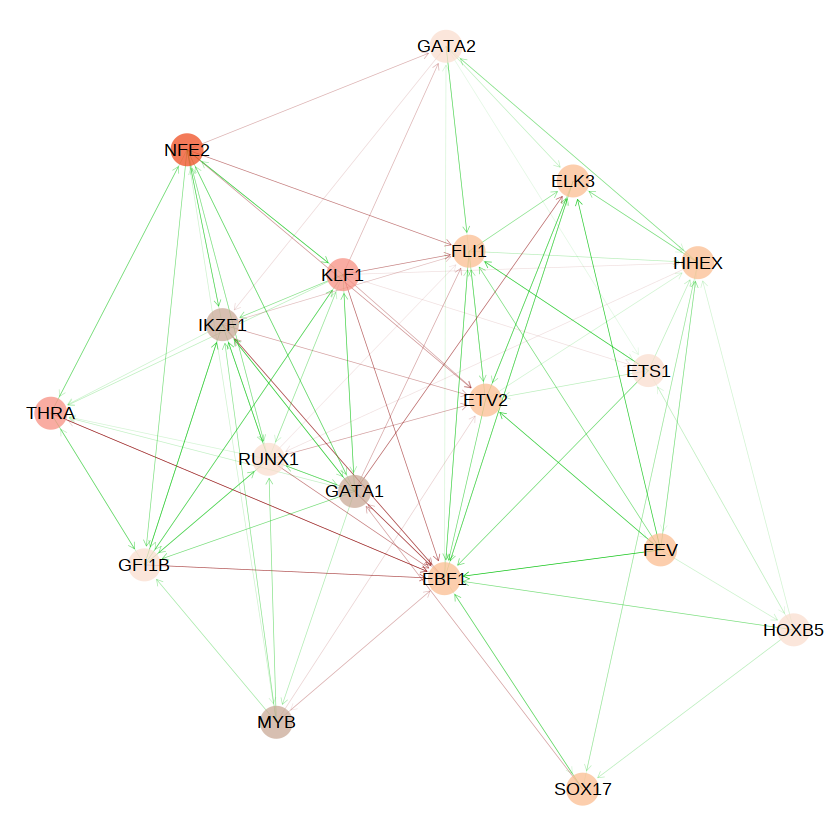

In [25]:
#########################
## Plot global network ##
#########################

# Define node color
tmp <- marker_TFs_all.dt[gene%in%names(V(igraph.net))] %>% .[,.SD[which.max(score)][,"celltype"],by="gene"] %>% setkey(gene)
igraph.tbl <- igraph.tbl %>% activate(nodes) %>% mutate(celltype=tmp[names(V(igraph.net)),celltype])

# Plot
set.seed(42)
p <- ggraph(igraph.tbl, 'lgl') +
  geom_edge_link(aes(edge_colour = sign, alpha=weight), edge_width=0.15, arrow=arrow(length=unit(1.5,'mm')), end_cap=circle(4,'mm')) +
  geom_node_point(aes(fill=celltype), size=9, stroke=0, shape=21, alpha=0.75) +
  geom_node_text(aes(label=name), size=3.75) +
  scale_edge_colour_manual(values=c("Positive"="#08c20e", "Negative"="darkred")) +
  scale_fill_manual(values=opts$celltype.colors) +
  theme_graph()

pdf(file.path(io$outdir,"global_network_celltype.pdf"), width = 10, height = 10)
print(p)
dev.off()
p

png 
  2

png 
  2

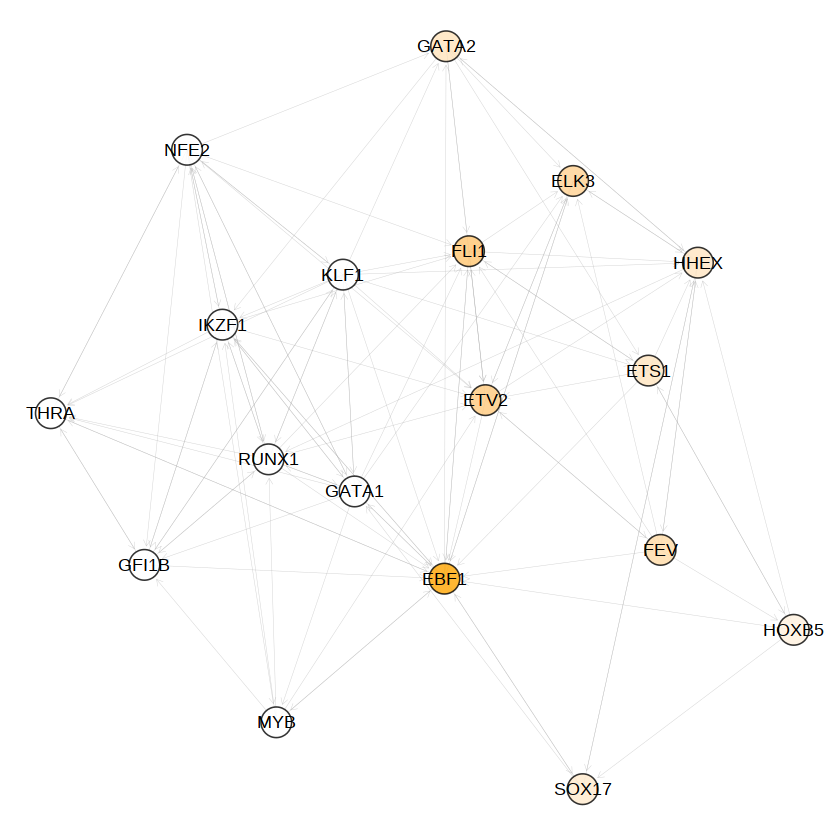

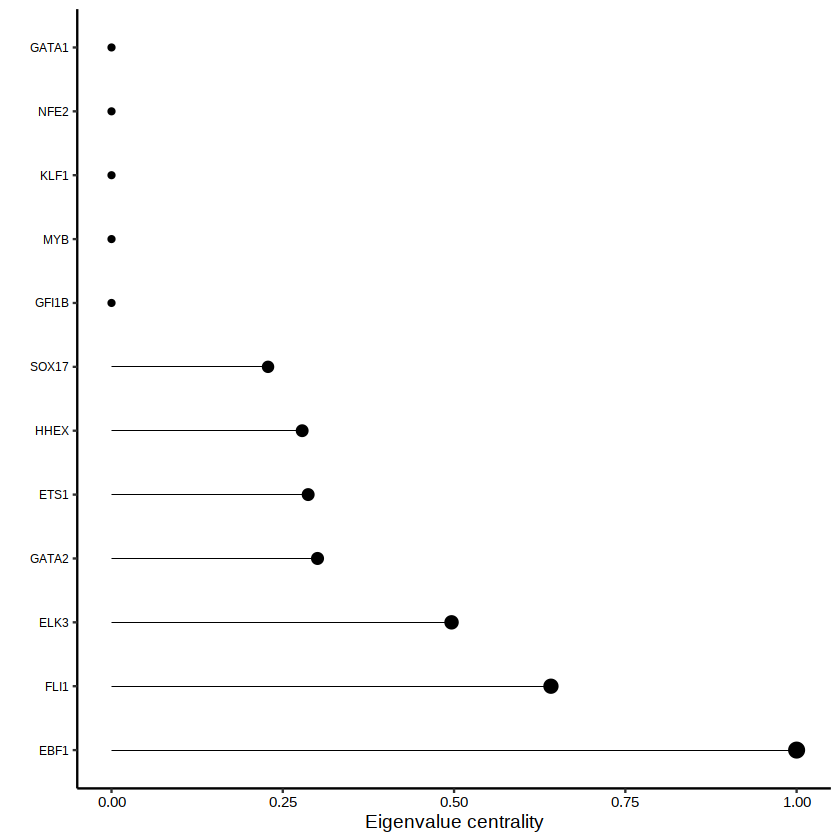

In [26]:
#################################################
## Plot global network, coloured by centrality ##
#################################################

set.seed(42)
p <- ggraph(igraph.tbl, 'lgl') +
  geom_edge_link(edge_colour = "grey66", edge_alpha=0.50, edge_width=0.10, arrow=arrow(length=unit(1.5,'mm')), end_cap=circle(4,'mm')) +
  # geom_node_point(aes(fill=degree), size=8, shape=21) +
  geom_node_point(aes(fill=eigen_centrality), size=8, shape=21, alpha=0.80) +
  geom_node_text(aes(label=name), size=3.75) +
  scale_fill_gradient(low = "white", high = "orange") +
  theme_graph()

pdf(file.path(io$outdir,"global_network_eigen_centrality.pdf"), width = 10, height = 10)
print(p)
dev.off()
p

to.plot <- data.table(tf=names(V(igraph.net)), centrality = eigen_centrality(igraph.net)$vector) %>% 
  .[sample(x=.N, size=round(.N/1.5))] %>%
  setorder(-centrality) %>%
  .[,tf:=factor(tf, levels=tf)] 

# to.plot <- rbind(
#   eigen_centrality.dt %>% head(n=10),
#   eigen_centrality.dt %>% tail(n=10)
# )

p <- ggplot(to.plot, aes_string(x="centrality", y="tf")) +
  geom_point(aes(size=centrality)) +
  geom_segment(aes(yend=tf), xend=0, size=0.20) +
  scale_size_continuous(range = c(1.25,3.75)) +
  labs(y="", x="Eigenvalue centrality") +
  theme_classic() +
  guides(size="none") +
  theme(
    axis.text.x = element_text(size=rel(1.0), color="black"),
    axis.text.y = element_text(size=rel(0.75), color="black")
  )

pdf(file.path(io$outdir,"global_network_eigen_centrality_stats.pdf"), width = 10, height = 10)
print(p)
dev.off()
p

png 
  2

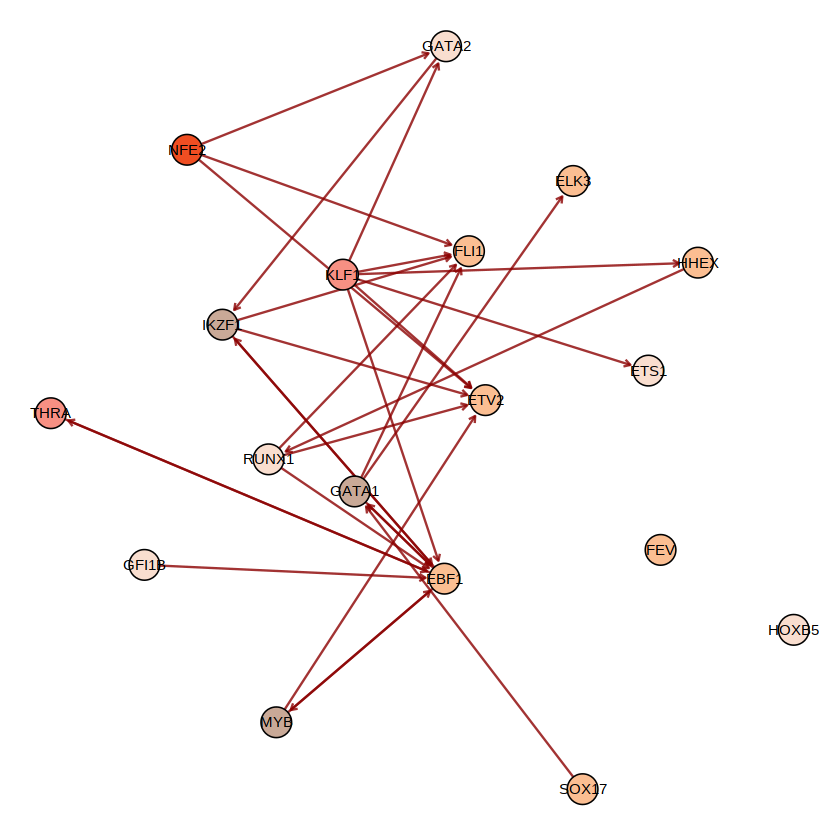

In [27]:
##################################
## Plot repressive interactions ##
##################################

set.seed(42)
p <- ggraph(igraph.tbl, 'lgl') +
  geom_edge_link(aes(edge_colour = sign, edge_alpha = sign), arrow=arrow(length=unit(1.5,'mm')), end_cap=circle(4,'mm')) +
  geom_node_point( aes(fill=celltype), size=8, shape=21) + #
  geom_node_text(aes(label=name), size=3) +
  scale_edge_alpha_manual(values=c("Positive"=0, "Negative"=0.80)) +
  scale_edge_colour_manual(values=c("Positive"="#08c20e", "Negative"="darkred")) +
  scale_fill_manual(values=opts$celltype.colors) +
  theme_graph()

pdf(file.path(io$outdir,"global_network_repressive_interactions.pdf"), width = 25, height = 25)
print(p)
dev.off()
p

png 
  2

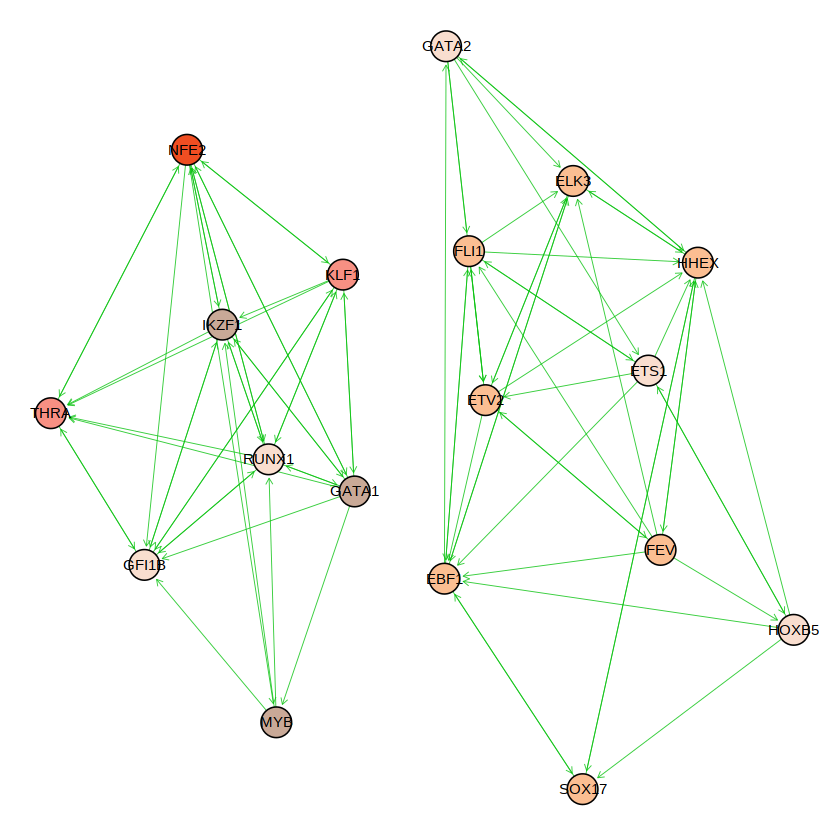

In [28]:
##################################
## Plot activatory interactions ##
##################################

set.seed(42)
p <- ggraph(igraph.tbl, 'lgl') +
  geom_edge_link(aes(edge_colour = sign, edge_alpha = sign), edge_width=0.20, arrow=arrow(length=unit(1.5,'mm')), end_cap=circle(4,'mm')) +
  geom_node_point(aes(fill=celltype), size=8, shape=21) +
  geom_node_text(aes(label=name), size=3) +
  scale_edge_alpha_manual(values=c("Positive"=0.8, "Negative"=0)) +
  scale_edge_colour_manual(values=c("Positive"="#08c20e", "Negative"="darkred")) +
  scale_fill_manual(values=opts$celltype.colors) +
  theme_graph()

pdf(file.path(io$outdir,"global_network_activatory_interactions.pdf"), width = 25, height = 25)
print(p)
dev.off()
p

png 
  2

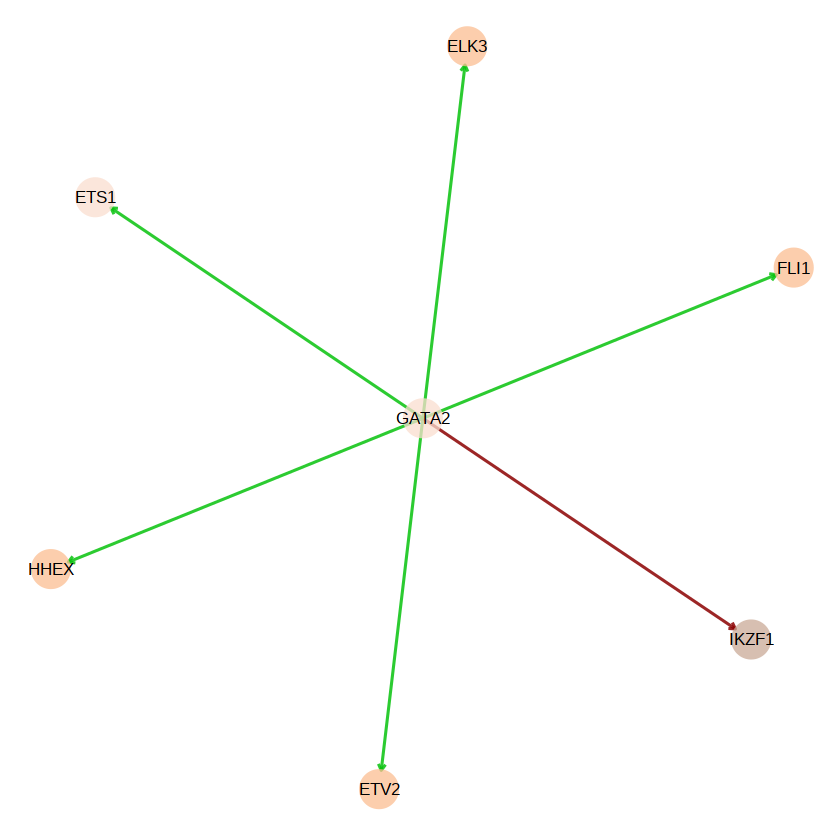

In [29]:
######################################################################################
## Highlight a TF with pleiotropy effects (both positive and negative interactions) ##
######################################################################################

TF_of_interest <- "GATA2"

idx <- which(names(V(igraph.net))==TF_of_interest)
test <- igraph.tbl %>% activate(edges) %>% filter(from==idx)

tmp <- names(V(igraph.net))[test %>% activate(edges) %>% as_tibble() %>% .$to]
test <- test %>% activate(nodes) %>% filter(name%in%c(TF_of_interest,tmp))

set.seed(42)
p <- ggraph(test, 'lgl') +
  geom_edge_link(aes(edge_colour = sign), edge_alpha=0.85, edge_width=0.65, arrow=arrow(length=unit(1.5,'mm')), end_cap=circle(4,'mm')) +
  geom_node_point(aes(fill=celltype), size=11, shape=21, stroke=0, alpha=0.75) +
  geom_node_text(aes(label=name), size=3.5) +
  scale_edge_colour_manual(values=c("Positive"="#08c20e", "Negative"="darkred")) +
  scale_fill_manual(values=opts$celltype.colors) +
  theme_graph()

pdf(file.path(io$outdir,sprintf("%s_network.pdf", TF_of_interest)), width = 4, height = 4)
print(p)
dev.off()
p

In [30]:
################################
## Plot network per cell type ##
################################

#celltypes.to.plot <- c("Spinal_cord","NMP","Somitic_mesoderm")

for (i in celltypes.to.plot){ #celltypes.to.plot , 'Erythroid3'
  
  # Define node color based on TF expr
   expr_i = as.data.table(rna_tf_pseudobulk_scaled.mtx[,i], keep.rownames=T) %>% setnames(c('V1', 'V2'), c('tf', 'expr'))
    edges_i.dt = merge(GRN_coef.dt, expr_i, by='tf') %>%
    #    .[expr>=0.3] %>%
        .[,activity:=beta*expr] #%>%
    #    .[abs(activity)>=0.15]
    nodes_i.dt = expr_i[tf %in% edges_i.dt$tf | tf %in% edges_i.dt$gene] %>% .[,text_alpha:=ifelse(expr<=0.1, 0.1, expr)]

    igraph_i.tbl = tbl_graph(nodes = nodes_i.dt, edges = edges_i.dt) %>% 
          activate(edges) %>%
          mutate(sign=ifelse(E(.)$activity>0,"Positive","Negative")) %>%
          mutate(activity=abs(activity))

  
  set.seed(42)
  p <- ggraph(igraph_i.tbl, 'stress') +
    # Edges
    geom_edge_link(aes(edge_alpha=activity, edge_colour=sign), edge_width=0.15, arrow=arrow(length=unit(1.5,'mm')), end_cap=circle(4,'mm'), show.legend = T) +
    scale_edge_alpha_continuous(range=c(0,1)) +
  #  scale_edge_width_continuous(range=c(0,1)) +
    scale_edge_colour_manual(values=c("Positive"="#08c20e", "Negative"="darkred")) +
    # Nodes
    geom_node_point(aes(col=expr, size=expr, alpha=expr)) + #, size=14
    viridis::scale_colour_viridis() +
    geom_node_text(aes(label=tf, size=1, alpha=text_alpha)) + # , size=3.75
    scale_alpha_continuous(range=c(0.0,1)) +
    # theme
    theme_graph() + theme(
      legend.position = "right"
    )
  
   pdf(file.path(io$outdir,sprintf("network_coloured_by_%s_expr.pdf",i)), width = 10, height = 10)
   print(p)
   dev.off()
}


In [44]:
trajectory.dt$FA1 = -minmax.normalisation(trajectory.dt$FA1)
trajectory.dt$FA2 = minmax.normalisation(trajectory.dt$FA2)

In [46]:
#######################################
## Plot network along the trajectory ##
#######################################

dir.create(file.path(io$outdir,"gif"), showWarnings = F)

ntimepoints <- 20

trajectory.dt[,pseudotime_group:=as.numeric(cut(FA1,ntimepoints))]
trajectory.dt = trajectory.dt[metacell %in% colnames(rna_tf_metacells_scaled.mtx)]
# rna_scaled.mtx <- apply(logcounts(rna_tf_filt.sce),1,minmax.normalisation) %>% t

# i <- "1"
for (i in unique(trajectory.dt$pseudotime_group)) {
  print(i)
  cells <- trajectory.dt[pseudotime_group==i,metacell]
  
# quick fix for metacells that are only one cell, but this shouldn't happen
  if(length(cells)>1){
  rna.expr.i <- apply(rna_tf_metacells_scaled.mtx[,cells],1,mean)
    }else{
  rna.expr.i <- rna_tf_metacells_scaled.mtx[,cells]
    }  
  #####################
  ## Plot trajectory ##
  #####################
  
  to.plot <- trajectory.dt %>% copy %>%
    .[,alpha:=1.0] %>% .[!metacell%in%cells,c("celltype","alpha"):=list("None",0.25)]
    
  p1 <- ggplot(to.plot, aes(x=FA1, y=FA2)) +
    geom_point(aes(x=FA1, y=FA2, fill=celltype), size=2.5, shape=21, alpha=1.0, data=to.plot[metacell%in%cells]) +
    geom_point(aes(x=FA1, y=FA2), size=2.5, color="grey", alpha=0.25, data=to.plot[!metacell%in%cells]) +
    # viridis::scale_fill_viridis() +
    scale_fill_manual(values=opts$celltype.colors) +
    # labs(x="Force-directed layout (Dim 1)", y="Force-directed layout (Dim 2)") +
    theme_classic() +
    ggplot_theme_NoAxes() +
    theme(
      legend.position="none"
    )
  
  ##################
  ## Plot network ##
  ##################
  
   expr_i =  as.data.table(rna.expr.i, keep.rownames=T)  %>% 
        setnames(c('rn', 'rna.expr.i'), c('tf', 'expr')) %>%
        .[,expr:=ifelse(expr<=0.25, 0, expr)]
    edges_i.dt = merge(GRN_coef.dt, expr_i, by='tf') %>%
        .[,activity:=beta*expr] %>%
        .[,activity:=ifelse(abs(activity)<=0.15, 0, activity)]
    nodes_i.dt = expr_i[tf %in% edges_i.dt$tf | tf %in% edges_i.dt$gene] %>% 
        .[,text_alpha:=ifelse(expr<=0.1, 0.1, expr)]

    igraph_i.tbl = tbl_graph(nodes = nodes_i.dt, edges = edges_i.dt) %>% 
          activate(edges) %>%
          mutate(sign=ifelse(E(.)$activity>0,"Positive","Negative")) %>%
          mutate(activity=abs(activity))
  
  set.seed(42)
  p2 <- ggraph(igraph_i.tbl, 'lgl') +
    # Edges
    geom_edge_link(aes(edge_alpha=activity, edge_colour=sign), edge_width=0.15, arrow=arrow(length=unit(1.5,'mm')), end_cap=circle(4,'mm'), show.legend = T) +
    scale_edge_alpha_continuous(range=c(0,1)) +
  #  scale_edge_width_continuous(range=c(0,1)) +
    scale_edge_colour_manual(values=c("Positive"="#08c20e", "Negative"="darkred")) +
    # Nodes
    geom_node_point(aes(col=expr, size=expr, alpha=expr)) + #, size=14
    viridis::scale_colour_viridis() +
    geom_node_text(aes(label=tf, size=1, alpha=expr)) + # , size=3.75
    scale_alpha_continuous(range=c(0.0,1)) +
    # theme
    theme_graph() + theme(
      legend.position = "right"
    )
  
  
  # Combine plots
  p <- cowplot::plot_grid(plotlist=list(p1,p2), nrow = 1, rel_widths = c(1/3,2/3))
  outfile <- sprintf("%s/gif/%d_blood_pseudotime_GRN.png",io$outdir,i)
  png(outfile, width = 1300, height = 650, bg = "white")
  print(p)
  dev.off()
}
# Create GIF 
library(magick)
sprintf("%s/gif/%d_blood_pseudotime_GRN.png",io$outdir,sort(unique(trajectory.dt$pseudotime_group))) %>%
  map(image_read) %>%
  image_join %>%
  image_animate(fps=0.5) %>%
  image_write(quality=100, path = sprintf("%s/gif/blood_filtered.gif",io$outdir))

[1] 11
[1] 7
[1] 5
[1] 4
[1] 8
[1] 3
[1] 6
[1] 10
[1] 9
[1] 2
[1] 14
[1] 1
[1] 15
[1] 18
[1] 16
[1] 13
[1] 12
[1] 17
[1] 19
[1] 20


In [47]:
# All TFs


##################################
## Load global GRN coefficients ##
##################################
# to use all markers:
GRN_coef.dt <- fread(io$grn_coef) %>% 
  .[,gene:=toupper(gene)] %>% #.[gene%in%unique(marker_TFs_filt.dt$gene) & tf%in%unique(marker_TFs_filt.dt$gene)] %>%
  .[pvalue<0.10 & abs(beta)>=opts$min_coef]

##########################
## Filter TFs and genes ##
##########################

# Filter TFs that have few connections
# TFs <- intersect(GRN_coef.dt[,.N,by="tf"][N>=3,tf], GRN_coef.dt[,.N,by="gene"][N>=2,gene])
TFs <- intersect(GRN_coef.dt[,.N,by="tf"][N>=3,tf], GRN_coef.dt[,.N,by="gene"][N>=3,gene])
GRN_coef.dt <- GRN_coef.dt[tf%in%TFs & gene%in%TFs]

# Fetch RNA expression matrices
rna_tf_pseudobulk.mtx <- logcounts(rna_pseudobulk.sce)[str_to_title(TFs),]; rownames(rna_tf_pseudobulk.mtx) <- toupper(rownames(rna_tf_pseudobulk.mtx))
rna_tf_metacells.mtx <- logcounts(rna_metacells.sce)[str_to_title(TFs),]; rownames(rna_tf_metacells.mtx) <- toupper(rownames(rna_tf_metacells.mtx))

# Scale
# rna_tf_pseudobulk_scaled.mtx <- apply(rna_tf_pseudobulk.mtx,1,minmax.normalisation) %>% .[celltypes.to.plot,] %>% t 
rna_tf_pseudobulk_scaled.mtx <- apply(rna_tf_pseudobulk.mtx[,celltypes.to.plot],1,minmax.normalisation) %>% t 
rna_tf_metacells_scaled.mtx <- apply(rna_tf_metacells.mtx,1,minmax.normalisation) %>% t 

################################
## Plot network per cell type ##
################################

#celltypes.to.plot <- c("Spinal_cord","NMP","Somitic_mesoderm")

for (i in celltypes.to.plot){ #celltypes.to.plot , 'Erythroid3'
  
  # Define node color based on TF expr
   expr_i = as.data.table(rna_tf_pseudobulk_scaled.mtx[,i], keep.rownames=T) %>% 
        setnames(c('V1', 'V2'), c('tf', 'expr')) %>%
        .[,expr:=ifelse(expr<=0.25, 0, expr)]
    edges_i.dt = merge(GRN_coef.dt, expr_i, by='tf') %>%
        .[,activity:=beta*expr] %>%
        .[,activity:=ifelse(abs(activity)<=0.25, 0, activity)]
    nodes_i.dt = expr_i[tf %in% edges_i.dt$tf | tf %in% edges_i.dt$gene] %>% 
        .[,text_alpha:=expr]

    igraph_i.tbl = tbl_graph(nodes = nodes_i.dt, edges = edges_i.dt) %>% 
          activate(edges) %>%
          mutate(sign=ifelse(E(.)$activity>0,"Positive","Negative")) %>%
          mutate(activity=abs(activity))
  
  set.seed(42)
  p <- ggraph(igraph_i.tbl, 'stress') +
    # Edges
    geom_edge_link(aes(edge_alpha=activity, edge_colour=sign), edge_width=0.15, arrow=arrow(length=unit(1.5,'mm')), end_cap=circle(4,'mm'), show.legend = T) +
    scale_edge_alpha_continuous(range=c(0,1)) +
  #  scale_edge_width_continuous(range=c(0,1)) +
    scale_edge_colour_manual(values=c("Positive"="#08c20e", "Negative"="darkred")) +
    # Nodes
    geom_node_point(aes(col=expr, size=expr, alpha=expr)) + #, size=14
    viridis::scale_colour_viridis() +
    geom_node_text(aes(label=tf, size=1, alpha=text_alpha)) + # , size=3.75
    scale_alpha_continuous(range=c(0.0,1)) +
    # theme
    theme_graph() + theme(
      legend.position = "none"
    ) + 
    ggtitle(i)
    
   png(file.path(io$outdir,sprintf("full_network_coloured_by_%s_expr.png",i)), width = 1300, height = 850, bg = "white")
       print(p)
   dev.off()
}

sprintf("%s/full_network_coloured_by_%s_expr.png",io$outdir,celltypes.to.plot) %>%
  map(image_read) %>%
  image_join %>%
  image_animate(fps=0.5) %>%
  image_write(quality=100, path = sprintf("%s/gif/full_network_coloured_by_celltype.gif",io$outdir))

In [ ]:
#######################################
## Plot network along the trajectory ##
#######################################

dir.create(file.path(io$outdir,"gif"), showWarnings = F)

ntimepoints <- 20

trajectory.dt[,pseudotime_group:=as.numeric(cut(FA1,ntimepoints))]
trajectory.dt = trajectory.dt[metacell %in% colnames(rna_tf_metacells_scaled.mtx)]
# rna_scaled.mtx <- apply(logcounts(rna_tf_filt.sce),1,minmax.normalisation) %>% t

# i <- "1"
for (i in unique(trajectory.dt$pseudotime_group)) {
  print(i)
  cells <- trajectory.dt[pseudotime_group==i,metacell]
  
# quick fix for metacells that are only one cell, but this shouldn't happen
  if(length(cells)>1){
  rna.expr.i <- apply(rna_tf_metacells_scaled.mtx[,cells],1,mean)
    }else{
  rna.expr.i <- rna_tf_metacells_scaled.mtx[,cells]
    }  
  #####################
  ## Plot trajectory ##
  #####################
  
  to.plot <- trajectory.dt %>% copy %>%
    .[,alpha:=1.0] %>% .[!metacell%in%cells,c("celltype","alpha"):=list("None",0.25)]
    
  p1 <- ggplot(to.plot, aes(x=FA1, y=FA2)) +
    geom_point(aes(x=FA1, y=FA2, fill=celltype), size=2.5, shape=21, alpha=1.0, data=to.plot[metacell%in%cells]) +
    geom_point(aes(x=FA1, y=FA2), size=2.5, color="grey", alpha=0.25, data=to.plot[!metacell%in%cells]) +
    # viridis::scale_fill_viridis() +
    scale_fill_manual(values=opts$celltype.colors) +
    # labs(x="Force-directed layout (Dim 1)", y="Force-directed layout (Dim 2)") +
    theme_classic() +
    ggplot_theme_NoAxes() +
    theme(
      legend.position="none"
    )
  
  ##################
  ## Plot network ##
  ##################
  
   expr_i =  as.data.table(rna.expr.i, keep.rownames=T)  %>% 
        setnames(c('rn', 'rna.expr.i'), c('tf', 'expr')) %>%
        .[,expr:=ifelse(expr<=0.25, 0, expr)]
    edges_i.dt = merge(GRN_coef.dt, expr_i, by='tf') %>%
        .[,activity:=beta*expr] %>%
        .[,activity:=ifelse(abs(activity)<=0.25, 0, activity)]
    nodes_i.dt = expr_i[tf %in% edges_i.dt$tf | tf %in% edges_i.dt$gene] %>% 
        .[,text_alpha:=ifelse(expr<=0.1, 0.1, expr)]

    igraph_i.tbl = tbl_graph(nodes = nodes_i.dt, edges = edges_i.dt) %>% 
          activate(edges) %>%
          mutate(sign=ifelse(E(.)$activity>0,"Positive","Negative")) %>%
          mutate(activity=abs(activity))
  
  set.seed(42)
  p2 <- ggraph(igraph_i.tbl, 'stress') +
    # Edges
    geom_edge_link(aes(edge_alpha=activity, edge_colour=sign), edge_width=0.15, arrow=arrow(length=unit(1.5,'mm')), end_cap=circle(4,'mm'), show.legend = T) +
    scale_edge_alpha_continuous(range=c(0,1)) +
  #  scale_edge_width_continuous(range=c(0,1)) +
    scale_edge_colour_manual(values=c("Positive"="#08c20e", "Negative"="darkred")) +
    # Nodes
    geom_node_point(aes(col=expr, size=expr, alpha=expr)) + #, size=14
    viridis::scale_colour_viridis() +
    geom_node_text(aes(label=tf, size=1, alpha=expr)) + # , size=3.75
    scale_alpha_continuous(range=c(0.0,1)) +
    # theme
    theme_graph() + theme(
      legend.position = "right"
    )
  
  
  # Combine plots
  p <- cowplot::plot_grid(plotlist=list(p1,p2), nrow = 1, rel_widths = c(1/3,2/3))
  outfile <- sprintf("%s/gif/%d_blood_pseudotime_GRN.png",io$outdir,i)
  png(outfile, width = 1300, height = 650, bg = "white")
  print(p)
  dev.off()
}
# Create GIF 
library(magick)
sprintf("%s/gif/%d_blood_pseudotime_GRN.png",io$outdir,sort(unique(trajectory.dt$pseudotime_group))) %>%
  map(image_read) %>%
  image_join %>%
  image_animate(fps=0.5) %>%
  image_write(quality=100, path = sprintf("%s/gif/blood_full.gif",io$outdir))

# Graph umap

In [48]:
library(uwot)

Loading required package: Matrix


Attaching package: ‘Matrix’


The following object is masked from ‘package:S4Vectors’:

    expand




In [49]:
test = edge_list.dt %>% dcast(from~to, value.var="weight", fill=0, drop=F) %>%
    as.data.frame(.) %>% 
    tibble::column_to_rownames('from')

In [50]:
test2 = umap(test, n_neighbors =10) %>% 
    as.data.table(., keep.rownames=T) %>%
    setnames(c('gene', 'umap1', 'umap2'))

In [51]:
test2 = merge(test2, as.data.table(rna_tf_pseudobulk_scaled.mtx,keep.rownames=T), by.x='gene', by.y='rn')

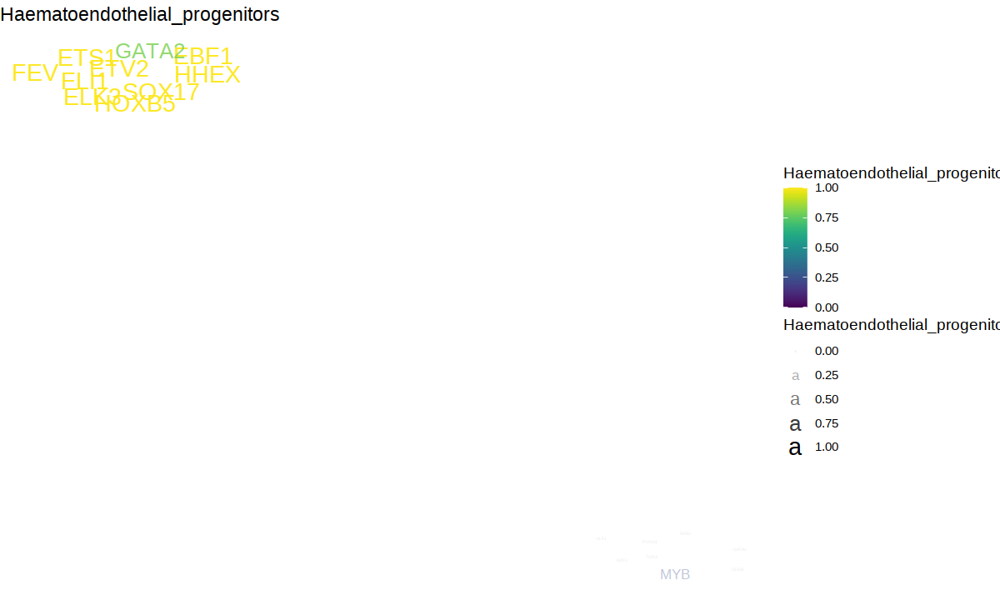

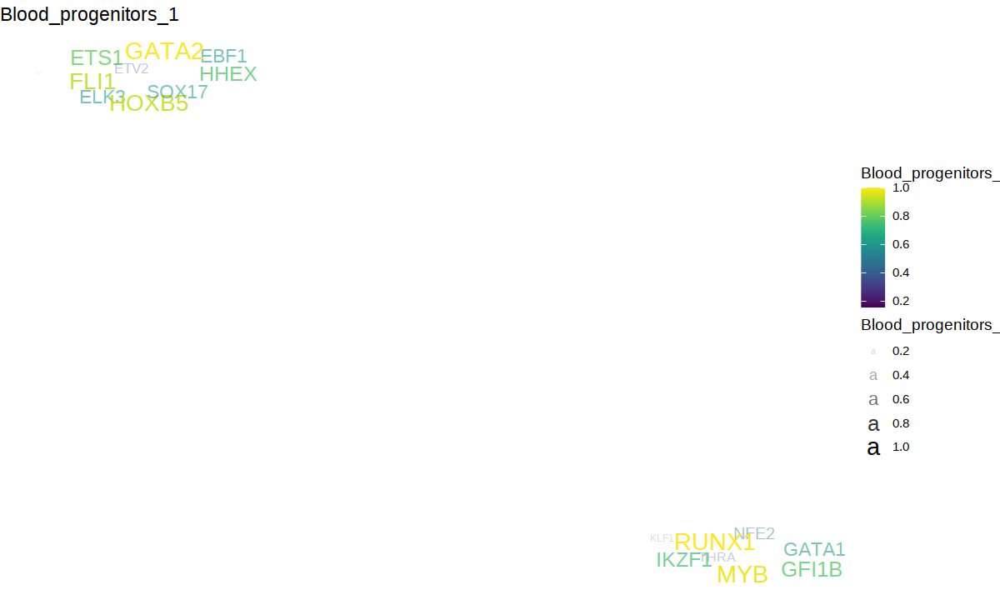

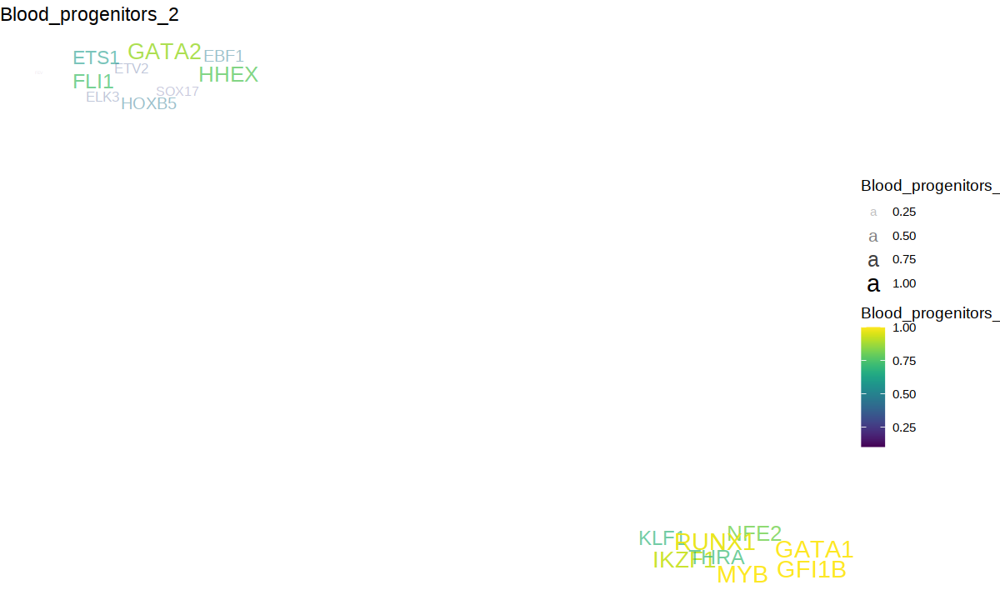

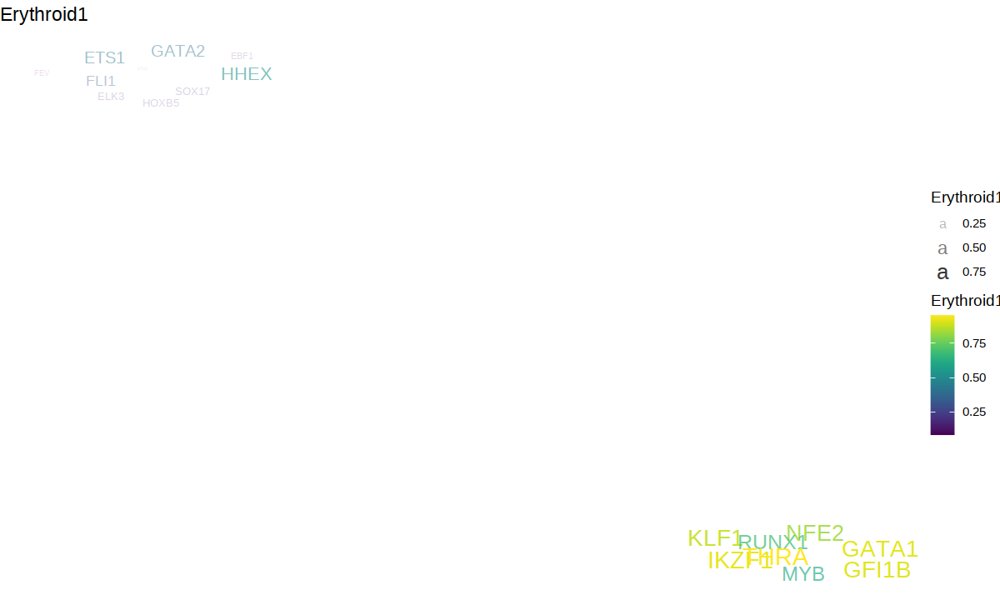

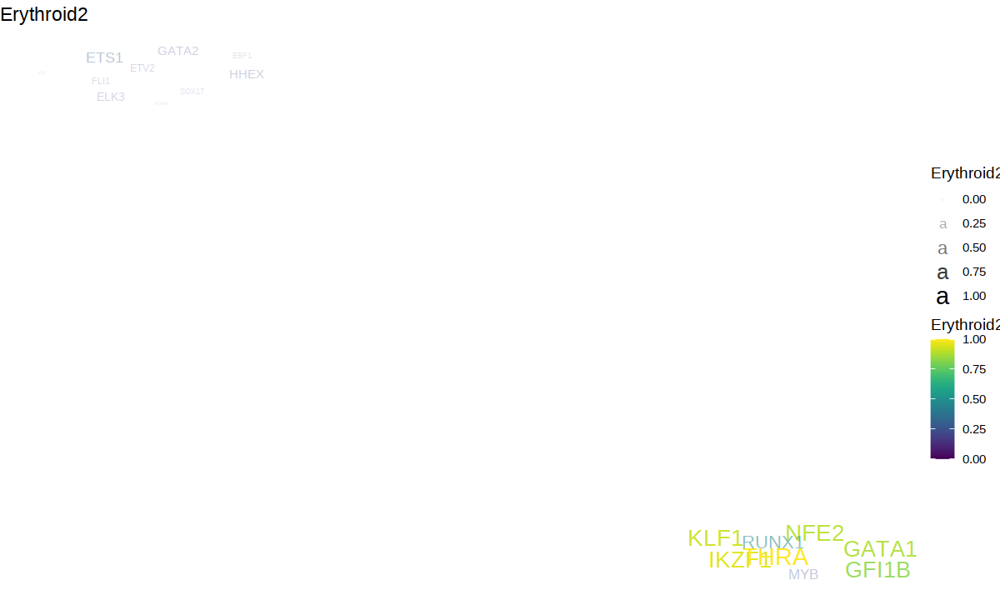

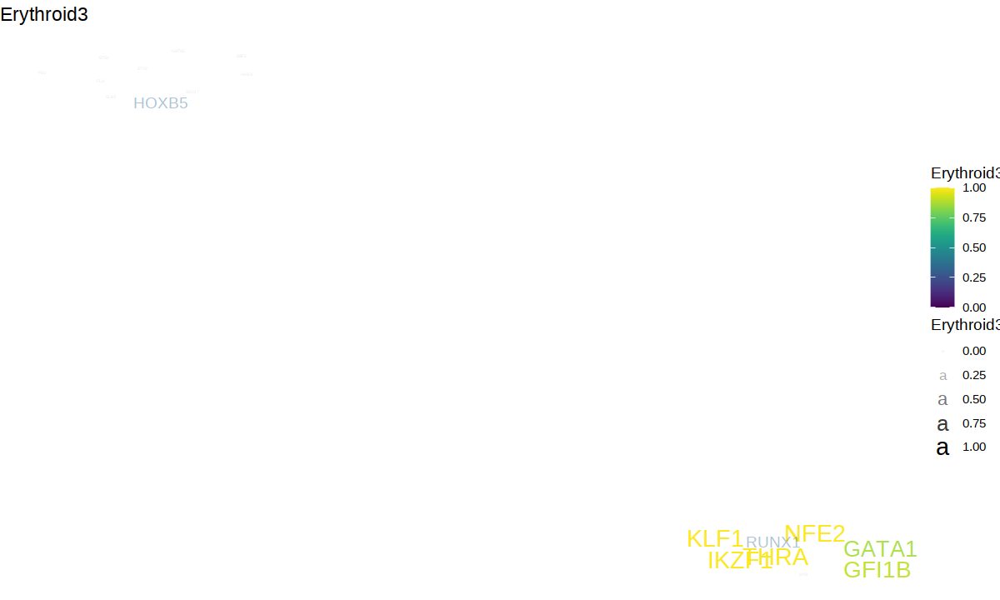

In [52]:
options(repr.plot.width=10, repr.plot.height=6)
for(i in colnames(rna_tf_pseudobulk_scaled.mtx)){
    p = ggplot(test2, aes_string('umap1', 'umap2', label='gene', col=i, alpha=i,size=i)) + 
        geom_text() + 
        viridis::scale_color_viridis() + 
        ggtitle(i) + 
        theme_void()
    print(p)
}

# investigate target genes

In [ ]:
##################################
## Load global GRN coefficients ##
##################################

GRN_coef.dt <- fread(io$grn_coef) %>% 
  .[,gene:=toupper(gene)] %>% 
  .[pvalue<0.05 & abs(beta)>=opts$min_coef]

In [ ]:
blood_tfs = c('LYL1', 'TAL1', 'KLF1', 'GATA1', 'GATA2', 'RUNX1', 'ELF1', 'STAT3')

In [ ]:
targets = blood_tfs %>% map(function(x){
    tmp = GRN_coef.dt[tf==x]
    }) %>% rbindlist() %>%
    .[beta>0]

In [ ]:
# Create igraph object
igraph.net <- graph_from_data_frame(d = targets)

# Create tbl_graph object for ggraph
igraph.tbl <- as_tbl_graph(igraph.net) 

In [ ]:
ggraph(igraph.tbl, 'stress') +
    # Edges
    geom_edge_arc(aes(edge_alpha=beta), edge_width=0.15, arrow=arrow(length=unit(1.5,'mm')), end_cap=circle(4,'mm'), show.legend = T) +
    scale_edge_alpha_continuous(range=c(0,1)) +
    # Nodes
   # geom_node_point(aes(size=14)) + #, size=14
    geom_node_text(aes(label=name, size=1)) + # , size=3.75
    scale_alpha_continuous(range=c(0.0,1)) +
    # theme
    theme_graph() + theme(
      legend.position = "none"
    )

In [ ]:
#Gene ontology corresponds to oxygen transport, erythrocyte differentiation etc, so as expected

In [ ]:
 head(GRN_coef.dt[tf=='ARID3A' & beta> 0] %>% .[order(-beta),gene], 100)

# Aucell test

In [ ]:
library(AUCell)

In [ ]:
GRN_coef.dt <- fread(io$grn_coef) %>% 
  .[,gene:=toupper(gene)] %>% #.[gene%in%unique(marker_TFs_filt.dt$gene) & tf%in%unique(marker_TFs_filt.dt$gene)] %>%
  .[pvalue<0.10 & abs(beta)>=opts$min_coef]

In [ ]:
gene_list = unique(GRN_coef.dt$tf) %>% map(function(x){
    tmp = GRN_coef.dt[tf==x,str_to_title(gene)]
})
names(gene_list) = unique(GRN_coef.dt$tf)

In [ ]:
cells_rankings <- AUCell_buildRankings(logcounts(rna_metacells.sce), plotStats=FALSE)
cells_AUC <- AUCell_calcAUC(gene_list, cells_rankings)

In [ ]:
cells_assignment <- AUCell_exploreThresholds(cells_AUC, plotHist=TRUE, assign=TRUE) 

In [ ]:
AUC = cells_AUC@assays@data$AUC

In [ ]:
library(uwot)

In [ ]:
UMAP = umap(t(AUC), n_neighbors=25)

In [ ]:
colnames(UMAP) = c('Umap1', 'Umap2')

In [ ]:
UMAP = merge(UMAP, as.data.frame(colData(rna_metacells.sce)), by=0)

In [ ]:
ggplot(as.data.frame(UMAP), aes(Umap1, Umap2, col=celltype)) + 
    geom_point() + 
    scale_color_manual(values=opts$celltype.colors) + 
    theme_void() + 
    theme(legend.position='none')

In [ ]:
UMAP = merge(UMAP,t(AUC), by.x='Row.names', by.y=0)

 AUCell gives a score of TF activity, but it's based on how many target genes are in the top x% of each cell's gene expr
 
 What can we use this for?
 
 maybe to see if there is a delay between TF expression and target gene activation?

In [ ]:
plot_TF = function(TF){
p1 = ggplot(as.data.frame(UMAP), aes_string('Umap1', 'Umap2', col=TF)) + 
    geom_point() + 
    scale_color_viridis() + 
    theme_bw() + 
    ggtitle(paste(TF, 'AUC')) + 
    theme(legend.position='none')
p2 = ggplot(as.data.frame(UMAP), aes(Umap1, Umap2, col=logcounts(rna_metacells.sce)[str_to_title(TF),])) + 
    geom_point() + 
    scale_color_viridis() + 
    ggtitle(paste(TF, 'Expression')) + 
    theme_bw() + 
    theme(legend.position='none')

cowplot::plot_grid(plotlist=list(p1,p2), nrow = 1)
}

In [ ]:
options(repr.plot.height=5, repr.plot.width=15)

In [ ]:
plot_TF('GATA1')
plot_TF('TAL1')
plot_TF('KLF1')
plot_TF('GATA2')
plot_TF('FLI1')
plot_TF('HOXA11')

# Iwo's genes
https://www.embopress.org/doi/full/10.15252/embj.2020104983

In [ ]:
##################################
## Load global GRN coefficients ##
##################################

GRN_coef.dt <- fread(io$grn_coef) %>% 
  .[,gene:=toupper(gene)] %>% #.[gene%in%unique(marker_TFs_filt.dt$gene) & tf%in%unique(marker_TFs_filt.dt$gene)] %>%
  .[pvalue<0.10 & abs(beta)>=opts$min_coef]

In [ ]:
head(GRN_coef.dt[tf=='LMO2'])

In [ ]:
####################
## Create network ##
####################

# Create node and edge data.frames
TFs <- c('GATA3', 'CBFB', 'GFI1', 'SPI1', 'CEBPA', 'LMO2', 'ERG', 'TCF3', 'RAD21', 'EBF1', 'FOS', 'MEIS1', 'MYC', 'MAX', 'HOXB8', 'HOXA9', 'IKZF1', 'MITF')
node_list.dt <- data.table(node_id=1:length(TFs), node_name=TFs)
edge_list.dt <- GRN_coef.dt[,c("tf","gene","beta")] %>% setnames(c("from","to","weight")) %>% .[!from==to]

# Create igraph object
igraph.net <- graph_from_data_frame(d = edge_list.dt[from %in% TFs & to %in% TFs])

# Create tbl_graph object for ggraph
igraph.tbl <- as_tbl_graph(igraph.net) %>%
  activate(nodes) %>%
  mutate(tf=names(V(igraph.net))) %>%
  mutate(degree=igraph::degree(igraph.net)) %>%
  mutate(eigen_centrality=eigen_centrality(igraph.net)$vector) %>%
  activate(edges) %>%
  mutate(sign=ifelse(E(igraph.net)$weight>0,"Positive","Negative")) %>%
  mutate(weight=abs(weight))

In [ ]:
#########################
## Plot global network ##
#########################

# Define node color
tmp <- marker_TFs_all.dt[gene%in%names(V(igraph.net))] %>% .[,.SD[which.max(score)][,"celltype"],by="gene"] %>% setkey(gene)
igraph.tbl <- igraph.tbl %>% activate(nodes) %>% mutate(celltype=tmp[names(V(igraph.net)),celltype])

# Plot
set.seed(42)
p <- ggraph(igraph.tbl, 'stress') +
  geom_edge_link(aes(edge_colour = sign, alpha=weight), edge_width=0.15, arrow=arrow(length=unit(1.5,'mm')), end_cap=circle(4,'mm')) +
  geom_node_point(aes(fill=celltype), size=9, stroke=0, shape=21, alpha=0.75) +
  geom_node_text(aes(label=name), size=3.75) +
  scale_edge_colour_manual(values=c("Positive"="#08c20e", "Negative"="darkred")) +
  scale_fill_manual(values=opts$celltype.colors) +
  theme_graph()

p

# GRN with ATAC test

In [147]:
args$metadata <- file.path(io$basedir,"results/rna/mapping/sample_metadata_after_mapping.txt.gz")
args$outdir <- file.path(io$basedir,"results/rna_atac/gene_regulatory_networks/metacells/trajectories/erythroid")
args$sce <- file.path(args$outdir,"SingleCellExperiment_metacells.rds")
args$atac_peak_matrix <- file.path(args$outdir,"PeakMatrix_summarized_experiment_metacells.rds")

io$rna_metacells.sce <- file.path(args$outdir, 'SingleCellExperiment_metacells.rds')
io$rna_pseudobulk.sce <- file.path(io$basedir,"results/rna/pseudobulk/celltype/SingleCellExperiment_pseudobulk.rds")
#io$trajectory_file <- file.path(args$outdir, "metacell_trajectory.txt.gz")
io$trajectory_file <- file.path(args$outdir, "epiblast_blood_trajectory.txt.gz")
io$trajectory <- "epiblast_blood"
io$metacell_metadata <- file.path(args$outdir, "metacells_metadata.txt.gz")
io$grn_coef <- file.path(args$outdir, 'global_chip_GRN_coef.txt.gz')
io$outdir = args$outdir

all_TFs = fread("/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/TFs.txt", header=F)$V1

# Options
opts$min_coef <- 0.25
opts$min_tf_score <- 0.75

In [91]:
#######################
## Load RNA and ATAC ##
#######################

# Load SingleCellExperiment
rna_metacells.sce <- readRDS(args$sce)

# Load ATAC SummarizedExperiment
atac_peakMatrix_metacells.se <- readRDS(args$atac_peak_matrix)

# Normalise ATAC data
assayNames(atac_peakMatrix_metacells.se) <- "counts"
assay(atac_peakMatrix_metacells.se,"logcounts") <- log(1e6*(sweep(assay(atac_peakMatrix_metacells.se),2,colSums(assay(atac_peakMatrix_metacells.se),na.rm=T),"/"))+1)

# Make sure that samples are consistent
samples <- intersect(colnames(rna_metacells.sce),colnames(atac_peakMatrix_metacells.se))
rna_metacells.sce <- rna_metacells.sce[,samples]
atac_peakMatrix_metacells.se <- atac_peakMatrix_metacells.se[,samples]

print(sprintf("Number of metacells: %s",length(samples)))

[1] "Number of metacells: 175"


In [293]:
##################################
## Load global GRN coefficients ##
##################################
io$grn_coef <- file.path(args$outdir, 'global_chip_GRN_coef.txt.gz')
opts$min_coef <- 0.25

GRN_coef.dt <- fread(io$grn_coef) %>% 
  .[,gene:=toupper(gene)] %>% #.[gene%in%unique(marker_TFs_filt.dt$gene) & tf%in%unique(marker_TFs_filt.dt$gene)] %>%
  .[pvalue<0.10 & abs(beta)>=opts$min_coef]


In [294]:
##########################
## Filter TFs and genes ##
##########################

# Filter TFs that have few connections
# TFs <- intersect(GRN_coef.dt[,.N,by="tf"][N>=3,tf], GRN_coef.dt[,.N,by="gene"][N>=2,gene])
TFs <- intersect(GRN_coef.dt[,.N,by="tf"][N>=3,tf], GRN_coef.dt[,.N,by="gene"][N>=3,gene])
GRN_coef.dt <- GRN_coef.dt[tf%in%TFs & gene%in%TFs]

In [297]:
length(TFs)

[1] 196

In [299]:
length(unique(GRN_coef.dt$gene))

[1] 196

In [94]:
#######################
##  Load ChIP-scores ##
#######################
args$outfile <- file.path(args$outdir, "TF2gene_after_virtual_chip.txt.gz")
chip = fread(args$outfile) %>% 
  .[,gene:=toupper(gene)] %>%
  .[gene!='']

In [95]:
#######################
##  merge GRN & ChIP ##
#######################
chip_GRN = merge(chip, GRN_coef.dt, by=c('tf', 'gene')) %>%
    .[tf!=gene] # remove auto regulation because it messes up the plot

In [309]:
## test
#TFs = c('FLI1', 'GATA2', 'KLF1', 'TAL1')
TFs = unique(chip_GRN$tf)
#TFs = c('POU5F1', 'NANOG')
chip_GRN_i = chip_GRN[gene %in% tf][chip_score>0.25 & abs(beta) > 0.35]

# Clear up network to keep only TFs with multiple connection with new thresholds set
TFs <- intersect(chip_GRN_i[,.N,by="tf"][N>=3,tf], chip_GRN_i[,.N,by="gene"][N>=3,gene])
chip_GRN_i <- chip_GRN_i[tf%in%TFs & gene%in%TFs]


TF_peak = chip_GRN_i[tf%in%TFs, c('tf', 'peak', 'chip_score')] %>% .[,sign:='Positive'] %>% .[,chip_score:=minmax.normalisation(chip_score)]
peak_gene = chip_GRN_i[tf%in%TFs, c('peak', 'gene', 'beta')] %>%  .[,sign:=ifelse(beta>0, 'Positive', 'Negative')]  %>% .[,beta:=abs(beta)] # %>% .[,beta:=minmax.normalisation(abs(beta))]

In [310]:
summary(chip_GRN_i$beta)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
-1.1760  0.4180  0.5160  0.5104  0.6750  1.4470 

In [311]:
TF.node = TF_peak[,c('tf')] %>% 
    unique(by='tf') %>% 
    setnames(c('node')) %>% 
    .[,type:='TF'] 
peak.node =  peak_gene[,c('peak')] %>% 
    unique(by='peak') %>% 
    setnames(c('node')) %>% 
    .[,type:='peak']
gene.node = chip_GRN_i[tf%in%TFs, 'gene'] %>%
    unique(by='gene') %>% 
    setnames('node' ) %>% 
    .[,type:=ifelse(node %in% unique(GRN_coef.dt$tf), 'TF', 'target')]
nodes.dt = rbind(TF.node, peak.node, gene.node) %>% unique(by='node')

In [312]:
edges.dt = rbind(TF_peak, peak_gene,use.names=FALSE) %>% setnames(c('node', 'target', 'score', 'sign')) #%>% unique(by=c('node', 'target'))

In [313]:
igraph.tbl = tbl_graph(nodes = nodes.dt, edges = edges.dt)# %>%
   # activate(edges) #%>%
   # mutate(sign=ifelse(score>0, 'Positive', 'Negative')) %>%
   # mutate(score=abs(score))

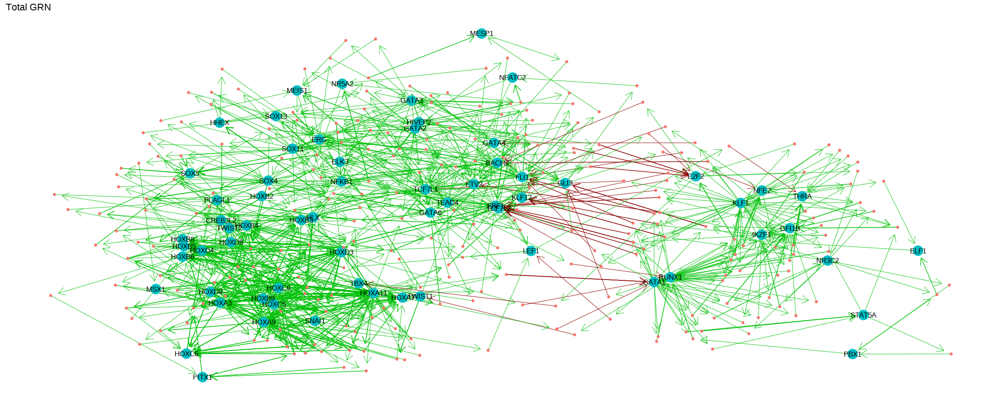

In [315]:
options(repr.plot.width=20, repr.plot.height=8)

ggraph(igraph.tbl, 'stress') +
    # Edges
    geom_edge_link(aes(edge_alpha=1, edge_color=sign), edge_width=0.3, arrow=arrow(length=unit(4,'mm')), end_cap=circle(4,'mm'), show.legend = T) +
    scale_edge_alpha_continuous(range=c(0,max(edges.dt$score))) +
    scale_edge_colour_manual(values=c("Positive"="#08c20e", "Negative"="darkred")) +
    # Nodes
    geom_node_point(aes(size=ifelse(type=='TF', 5, 1), color=type)) + #, size=14
    geom_node_text(aes(filter=type=='TF' , label=node, size=2)) + # , size=3.75| type=='target'
    scale_alpha_continuous(range=c(0.0,1)) +
    # theme
    theme_graph() + theme(
      legend.position = "none"
    ) + 
    ggtitle('Total GRN')

# Celltype specific GRN

In [ ]:
logcounts(rna_metacells.sce) = apply(logcounts(rna_metacells.sce),1,minmax.normalisation) %>% t
assay(atac_peakMatrix_metacells.se,"logcounts") = apply(assay(atac_peakMatrix_metacells.se,"logcounts"), 1, minmax.normalisation) %>% t

Warning message in min(x, na.rm = T):
“no non-missing arguments to min; returning Inf”
Warning message in max(x, na.rm = T):
“no non-missing arguments to max; returning -Inf”
Warning message in min(x, na.rm = T):
“no non-missing arguments to min; returning Inf”
Warning message in min(x, na.rm = T):
“no non-missing arguments to min; returning Inf”
Warning message in max(x, na.rm = T):
“no non-missing arguments to max; returning -Inf”
Warning message in min(x, na.rm = T):
“no non-missing arguments to min; returning Inf”
Warning message in min(x, na.rm = T):
“no non-missing arguments to min; returning Inf”
Warning message in max(x, na.rm = T):
“no non-missing arguments to max; returning -Inf”
Warning message in min(x, na.rm = T):
“no non-missing arguments to min; returning Inf”
Warning message in min(x, na.rm = T):
“no non-missing arguments to min; returning Inf”
Warning message in max(x, na.rm = T):
“no non-missing arguments to max; returning -Inf”
Warning message in min(x, na.rm = T):
“

In [104]:
#####################
## Load trajectory ##
#####################
io$metacell_metadata <- file.path(args$outdir, "metacells_metadata.txt.gz")
metacell_metadata.dt <- fread(io$metacell_metadata)
metacell_metadata.dt = metacell_metadata.dt[metacell %in% samples]

In [105]:
head(chip_GRN_i)

tf,gene,peak,chip_score,dist,beta,pvalue
<chr>,<chr>,<chr>,<dbl>,<int>,<dbl>,<dbl>
BACH2,ELK3,chr10:93335966-93336566,0.32,25131,0.733,4.81e-21
BACH2,NFIB,chr4:82435627-82436227,0.32,0,0.647,9.31e-21
CBFB,BACH2,chr4:32250061-32250661,0.33,0,0.915,2.53e-21
CBFB,BACH2,chr4:32250918-32251518,0.31,0,0.915,2.53e-21
CBFB,E2F2,chr4:136134212-136134812,0.31,37882,-0.661,2.68e-13
CBFB,ERG,chr16:95321829-95322429,0.31,37040,1.090,1.78e-24


In [106]:
metacell = 2
chip_GRN_i_metacell = chip_GRN_i %>% 
    cbind(logcounts(rna_metacells.sce)[str_to_title(chip_GRN_i$tf), metacell]) %>%  # Add expression data
    setnames('V2', 'expr') %>% 
    cbind(assay(atac_peakMatrix_metacells.se[chip_GRN_i$peak, metacell],"logcounts")) %>%  # Add accessibility data
    setnames(colnames(atac_peakMatrix_metacells.se)[metacell], 'acc') %>%
     .[,peak_score:=minmax.normalisation(chip_score*expr*acc)] %>% # TF-peak score # normalisation within metacell or between metacells????
     .[,target_score:=minmax.normalisation(peak_score*beta*sign(beta))*sign(beta)] #%>%
   # .[,peak_score:=chip_score*expr*acc] %>% # TF-peak score
   # .[,target_score:=peak_score*beta] #%>%


In [107]:
## test
#TFs = c('FLI1', 'GATA2', 'KLF1', 'TAL1')
TFs = unique(chip_GRN$tf)
#TFs = c('POU5F1', 'NANOG')
TF_peak = chip_GRN_i_metacell[tf%in%TFs, c('tf', 'peak', 'peak_score', 'expr')]
peak_gene = chip_GRN_i_metacell[tf%in%TFs, c('peak', 'gene', 'target_score', 'acc')] 

In [108]:
TF.node = TF_peak[,c('tf', 'expr')] %>% 
    unique(by='tf') %>% 
    setnames(c('node', 'value')) %>% 
    .[,type:='TF'] 
peak.node =  peak_gene[,c('peak', 'acc')] %>% 
    unique(by='peak') %>% 
    setnames(c('node', 'value')) %>% 
    .[,type:='peak']
gene.node = chip_GRN_i_metacell[tf%in%TFs, 'gene'] %>%
    unique(by='gene') %>% 
    setnames('node' ) %>% 
    .[,type:=ifelse(node %in% unique(GRN_coef.dt$tf), 'TF', 'target')] %>% 
# Fix later: Normalisation now happens separately for targets and TFs, but should be done together.
    .[,value:=(minmax.normalisation(logcounts(rna_metacells.sce)[str_to_title(node), metacell]))] # add target gene expression values.
nodes.dt = rbind(TF.node, peak.node, gene.node) %>% unique(by='node')

In [109]:
edges.dt = rbind(TF_peak, peak_gene,use.names=FALSE) %>% .[,c(1,2,3)] %>% setnames(c('node', 'target', 'score')) %>% unique(by=c('node', 'target'))

In [110]:
no_target = edges.dt[,sum:=sum(score), by='target'][sum==0, ] 
activator = edges.dt[,sum:=sum(score), by='node'][sum>0,] 
edges.dt[,sum:=NULL]

In [111]:
nodes.dt[node %in% no_target$target & !node %in% activator$node]$value = 0 #& node %in% no_activator

In [112]:
igraph.tbl = tbl_graph(nodes = nodes.dt, edges = edges.dt) %>%
    activate(edges) %>%
    mutate(sign=ifelse(score>0, 'Positive', ifelse(score<0, 'Negative', '0'))) %>%
    mutate(score=abs(score))

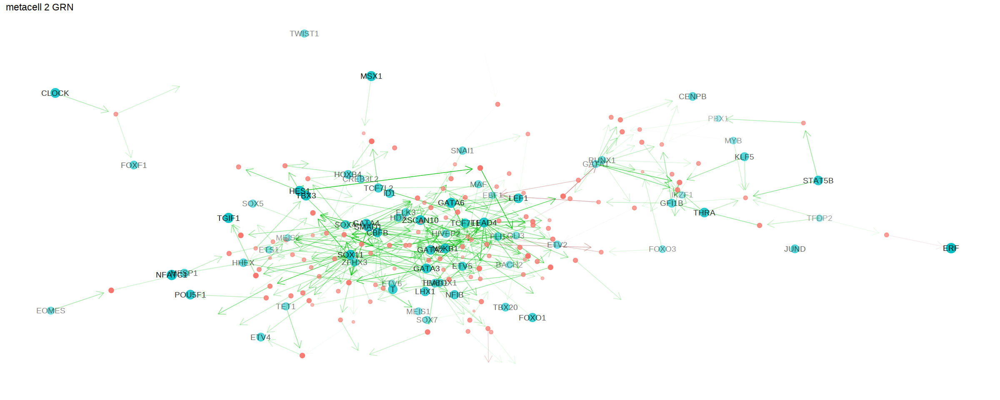

In [113]:
options(repr.plot.width=20, repr.plot.height=8)

ggraph(igraph.tbl, 'stress') +
    # Edges
        geom_edge_fan(aes(filter=score>0.1, edge_alpha=score, edge_color=sign), edge_width=0.3, arrow=arrow(length=unit(4,'mm')), end_cap=circle(4,'mm'), show.legend = T) + #filter=score>score_thr, 
        scale_edge_alpha_continuous(range=c(0,1)) +
        scale_edge_colour_manual(values=c("Positive"="#08c20e", "Negative"="darkred", "0"='white')) +
        # Nodes
        geom_node_point(aes(filter=value>0.3,size=ifelse(type=='TF', value, value/5), color=type, alpha=value)) + #It looks nice to filter above a threshold but it's not fair because TF-peak are higher than peak-target, and there is no minmax norm so far
        geom_node_text(aes(filter=value>0.3 & type=='TF' , label=node, alpha=value)) + # , size=3.75| type=='target'
        geom_node_point(aes(alpha=0)) + #
        scale_alpha_continuous(range=c(0.0,1)) +
        # theme
        theme_graph() + theme(
          legend.position = "none"
        ) + 
    ggtitle(paste('metacell', metacell, 'GRN'))

Warning message:
“Using `bins = 30` by default. Pick better value with the argument `bins`.”
Warning message:
“Using `bins = 30` by default. Pick better value with the argument `bins`.”


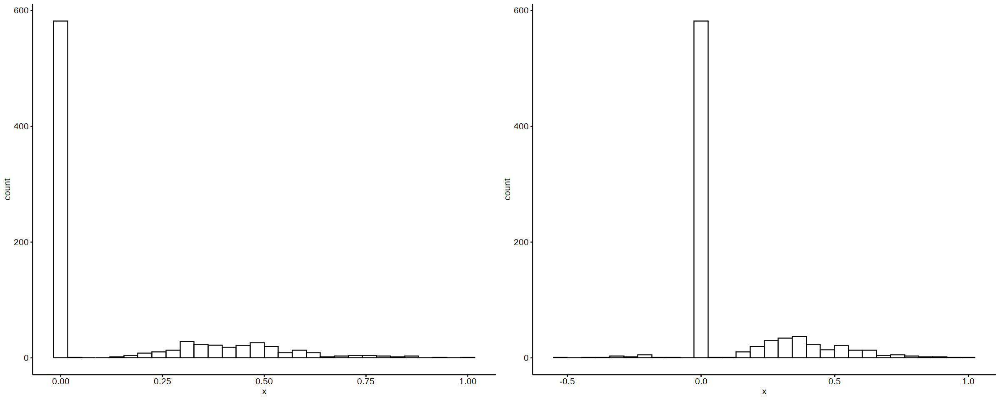

In [114]:
ggarrange(gghistogram(chip_GRN_i_metacell$peak_score), gghistogram(chip_GRN_i_metacell$target_score))


In [115]:
GRN_metacell = function(metacell, expr_thr = 0.25, acc_thr = 0.25){
    chip_GRN_i_metacell = chip_GRN_i %>% 
        cbind(logcounts(rna_metacells.sce)[str_to_title(chip_GRN_i$tf), metacell]) %>%  # Add expression data
        setnames('V2', 'expr') %>% 
        cbind(assay(atac_peakMatrix_metacells.se[chip_GRN_i$peak, metacell],"logcounts")) %>%  # Add accessibility data
        setnames(metacell, 'acc') %>%
      #  .[,c('expr', 'acc'):=list(minmax.normalisation(expr), minmax.normalisation(acc))] %>%
         .[,peak_score:=minmax.normalisation(chip_score*expr*acc)] %>% # TF-peak score
         .[,target_score:=minmax.normalisation(peak_score*beta*sign(beta))*sign(beta)] #%>% # peak-gene score
        # .[,peak_score:=chip_score*expr*acc] %>% # TF-peak score
        # .[,target_score:=peak_score*beta] #%>%
    
    #TFs = c('FLI1', 'GATA2', 'KLF1', 'TAL1')
    TFs = unique(chip_GRN$tf)
    #TFs = c('POU5F1', 'NANOG')
    #chip_GRN_i = chip_GRN[gene %in% tf][chip_score>0.4 & abs(beta) > 0.3]
    TF_peak = chip_GRN_i_metacell[tf%in%TFs, c('tf', 'peak', 'peak_score', 'expr')]
    peak_gene = chip_GRN_i_metacell[tf%in%TFs, c('peak', 'gene', 'target_score', 'acc')] 
    edges.dt = rbind(TF_peak, peak_gene,use.names=FALSE) %>% .[,c(1,2,3)] %>% setnames(c('node', 'target', 'score')) %>% unique(by=c('node', 'target'))

    
    TF.node = TF_peak[,c('tf', 'expr')] %>% 
#        .[order(-expr)] %>%
        unique(by='tf') %>% 
        setnames(c('node', 'value')) %>% 
        .[,type:='TF'] 
    peak.node =  peak_gene[,c('peak', 'acc')] %>% 
#        .[order(-acc)] %>%
        unique(by='peak') %>% 
        setnames(c('node', 'value')) %>% 
        .[,type:='peak']
    gene.node = chip_GRN_i_metacell[tf%in%TFs, 'gene'] %>%
        unique(by='gene') %>% 
        setnames('node' ) %>% 
        .[,type:=ifelse(node %in% unique(GRN_coef.dt$tf), 'TF', 'target')] %>% 
        .[,value:=(minmax.normalisation(logcounts(rna_metacells.sce)[str_to_title(node), metacell]))] # %>% # add target gene expression values
#       .[,value:=ifelse(value<=expr_thr, 0, value)]
    nodes.dt = rbind(TF.node, peak.node, gene.node) %>% unique(by='node')
    
    
    no_target = edges.dt[,sum:=sum(score), by='target'] %>% .[sum==0, ] 
    activator = edges.dt[,sum:=sum(score), by='node'] %>% .[sum>0,] 
    edges.dt[,sum:=NULL]
    nodes.dt[node %in% no_target$target & !node %in% activator$node]$value = 0 #& node %in% no_activator
    
    GRN = list(edges.dt, nodes.dt)
    names(GRN) = c('edges', 'nodes')
    return(GRN)
}

#### Calculate for all metacells

In [116]:
GRN_per_metacell = lapply(metacell_metadata.dt$metacell, GRN_metacell)
names(GRN_per_metacell) = metacell_metadata.dt$metacell

In [117]:
edges = GRN_per_metacell[[1]]$edges[,c(1,2)]
for(x in metacell_metadata.dt$metacell){
    tmp = GRN_per_metacell[[x]]$edges[,'score'] %>% setnames(x)
    edges = cbind(edges, tmp)
    }

nodes = GRN_per_metacell[[1]]$nodes[,c(1,3)]
for(x in metacell_metadata.dt$metacell){
    tmp = GRN_per_metacell[[x]]$nodes[,'value'] %>% setnames(x)
    nodes = cbind(nodes, tmp)
    }

In [118]:
group_GRN = function(metacells){
    nodes_tmp = data.table(node = nodes$node, type=nodes$type, value = rowMeans(as.matrix(nodes[,..metacells])))
    edges_tmp = data.table(node = edges$node, target=edges$target, score = rowMeans(as.matrix(edges[,..metacells])))
    GRN = list(edges_tmp, nodes_tmp)
    names(GRN) = c('edges', 'nodes')
    return(GRN)
}

plot_group_GRN = function(metacells, score_thr=0, value_thr=0){
    # get group GRN
    GRN_tmp = group_GRN(metacells)
    
    # Create network
    igraph.tbl_tmp = tbl_graph(nodes = GRN_tmp[['nodes']], edges =  GRN_tmp[['edges']]) %>%
        activate(edges) %>%
        mutate(sign=ifelse(score>0, 'Positive', ifelse(score<0, 'Negative', '0'))) %>%
        mutate(score=abs(score))
    
    # plot
    p = ggraph(igraph.tbl_tmp, 'stress') +
    # Edges
        geom_edge_fan(aes(filter=score>0.1, edge_alpha=score, edge_color=sign), edge_width=0.3, arrow=arrow(length=unit(4,'mm')), end_cap=circle(4,'mm'), show.legend = T) + #filter=score>score_thr, 
        scale_edge_alpha_continuous(range=c(0,1)) +
        scale_edge_colour_manual(values=c("Positive"="#08c20e", "Negative"="darkred", "0"='white')) +
        # Nodes
        geom_node_point(aes(filter=value>0.3,size=ifelse(type=='TF', value, value/5), color=type, alpha=value)) + #It looks nice to filter above a threshold but it's not fair because TF-peak are higher than peak-target, and there is no minmax norm so far
        geom_node_text(aes(filter=value>0.3 & type=='TF' , label=node, alpha=value)) + # , size=3.75| type=='target'
        geom_node_point(aes(alpha=0)) + # so that layout is the same for all celltypes
        scale_alpha_continuous(range=c(0.0,1)) +
        # theme
        theme_graph() + theme(
          legend.position = "none"
        )
    return(p)
}

[1] "Haematoendothelial_progenitors"

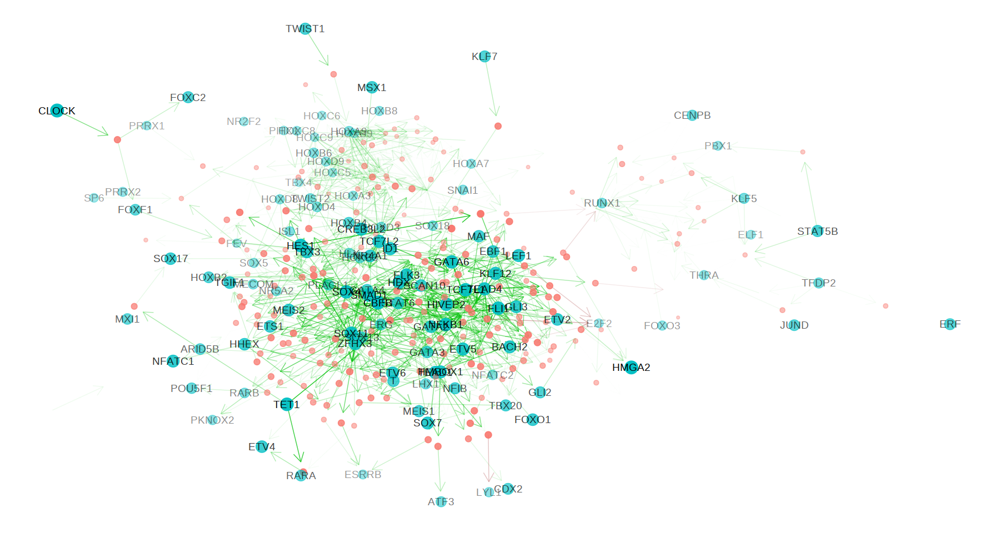

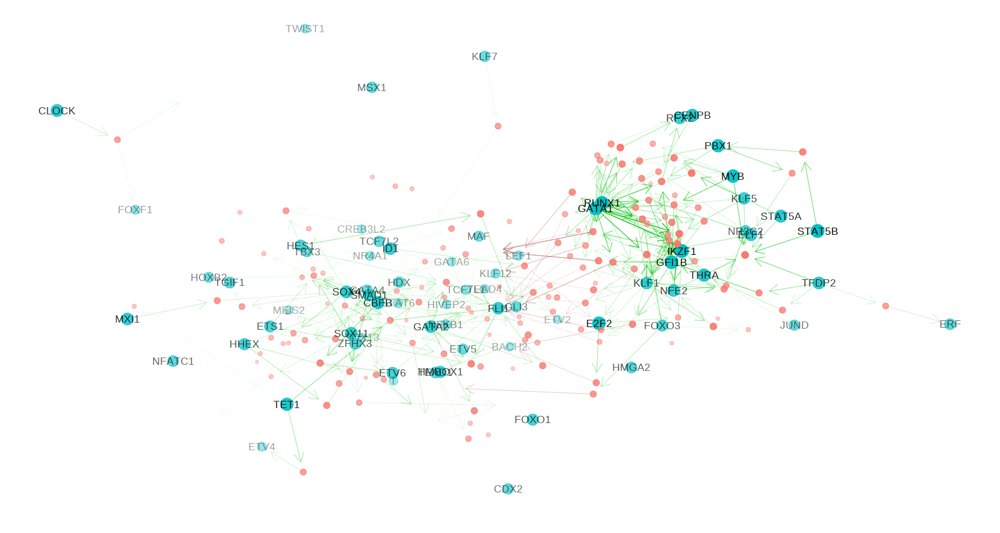

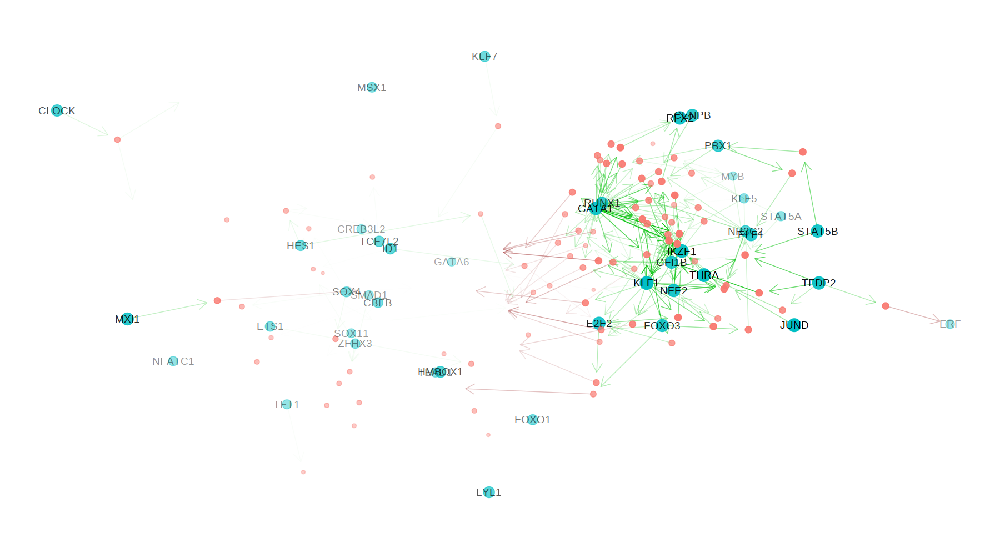

In [132]:
options(repr.plot.width=15, repr.plot.height=8)

metacells = metacell_metadata.dt[celltype==celltypes.to.plot[1], metacell]
p = plot_group_GRN(metacells)
p

GRN_tmp = group_GRN(metacells)

metacells = metacell_metadata.dt[celltype==celltypes.to.plot[3], metacell]
p = plot_group_GRN(metacells)
p

GRN_tmp = group_GRN(metacells)


metacells = metacell_metadata.dt[celltype=='Erythroid3', metacell]
p = plot_group_GRN(metacells)
p

GRN_tmp = group_GRN(metacells)


# Create network
igraph.tbl_tmp = tbl_graph(nodes = GRN_tmp[['nodes']], edges =  GRN_tmp[['edges']]) %>%
    activate(edges) %>%
    mutate(sign=ifelse(score>0, 'Positive', ifelse(score<0, 'Negative', '0'))) %>%
    mutate(score=abs(score))

In [133]:
# GIF of all celltypes
for(i in celltypes.to.plot){
    metacells = metacell_metadata.dt[celltype==i, metacell]
    p = plot_group_GRN(metacells) + ggtitle(i)
    
   png(file.path(io$outdir,sprintf("gif/full_network_coloured_by_%s_weighted.png",i)), width = 1300, height = 850, bg = "white")
       print(p)
   dev.off()
}
library(magick)
sprintf("%s/gif/full_network_coloured_by_%s_weighted.png",io$outdir,celltypes.to.plot) %>%
  map(image_read) %>%
  image_join %>%
  image_animate(fps=0.5) %>%
  image_write(quality=100, path = sprintf("%s/gif/full_network_coloured_by_celltype_weighted.gif",io$outdir))

In [134]:
test = merge(group_GRN(metacell_metadata.dt[celltype=='Erythroid3', metacell])$edges, group_GRN(metacell_metadata.dt[celltype=='Erythroid3', metacell])$nodes, by= 'node')

`geom_smooth()` using method = 'loess' and formula 'y ~ x'



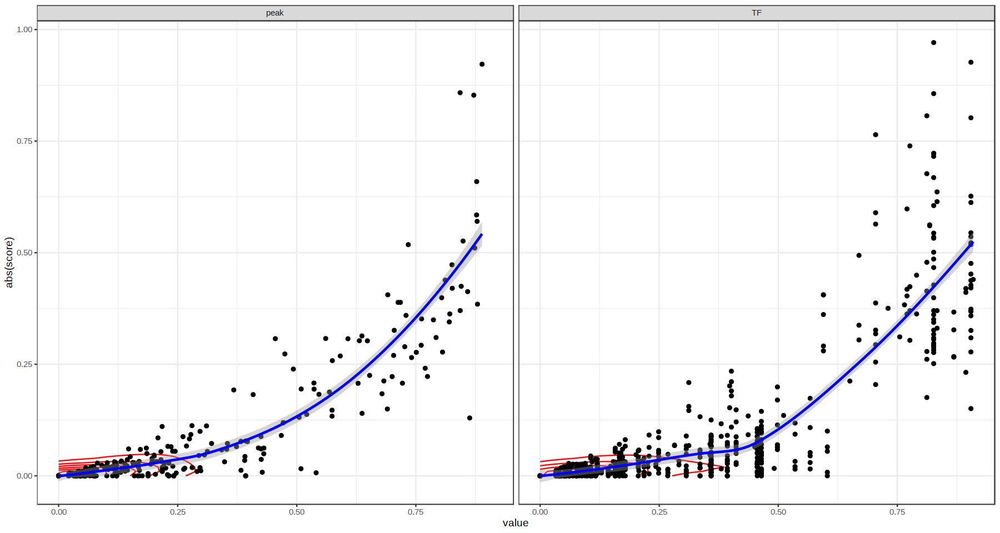

In [135]:
ggplot(test, aes(value, abs(score))) + 
    geom_density_2d(col='red') + 
    geom_point() + 
    geom_smooth(col='blue') + 
    facet_grid(~type) + 
    theme_bw()

# Leiden

In [136]:
# leiden=cluster_leiden(as.undirected(igraph.tbl_tmp))#,
#   #  weights=E(igraph.tbl_tmp)$score)

# #leiden = do.call('cbind', leiden) #%>% as.data.table() #%>% .$membership

In [137]:
# igraph.tbl_tmp = igraph.tbl_tmp %>% activate(nodes) %>% mutate(leiden = leiden)

In [138]:
# ggraph(igraph.tbl_tmp, 'stress') +
#     # Edges
#         geom_edge_fan(aes(filter=score>0.1, edge_alpha=score, edge_color=sign), edge_width=0.3, arrow=arrow(length=unit(4,'mm')), end_cap=circle(4,'mm'), show.legend = T) + #filter=score>score_thr, 
#         scale_edge_alpha_continuous(range=c(0,1)) +
#         scale_edge_colour_manual(values=c("Positive"="#08c20e", "Negative"="darkred", "0"='white')) +
#         # Nodes
#         geom_node_point(aes(filter=value>0.3,size=ifelse(type=='TF', value, value/5), color=leiden, alpha=value)) + #It looks nice to filter above a threshold but it's not fair because TF-peak are higher than peak-target, and there is no minmax norm so far
#         geom_node_text(aes(filter=value>0.3 & type=='TF' , label=node, alpha=value)) + # , size=3.75| type=='target'
#         geom_node_point(aes(alpha=0)) + # so that layout is the same for all celltypes
#         scale_alpha_continuous(range=c(0.0,1)) +
#         # theme
#         theme_graph() + theme(
#           legend.position = "none"
#         )

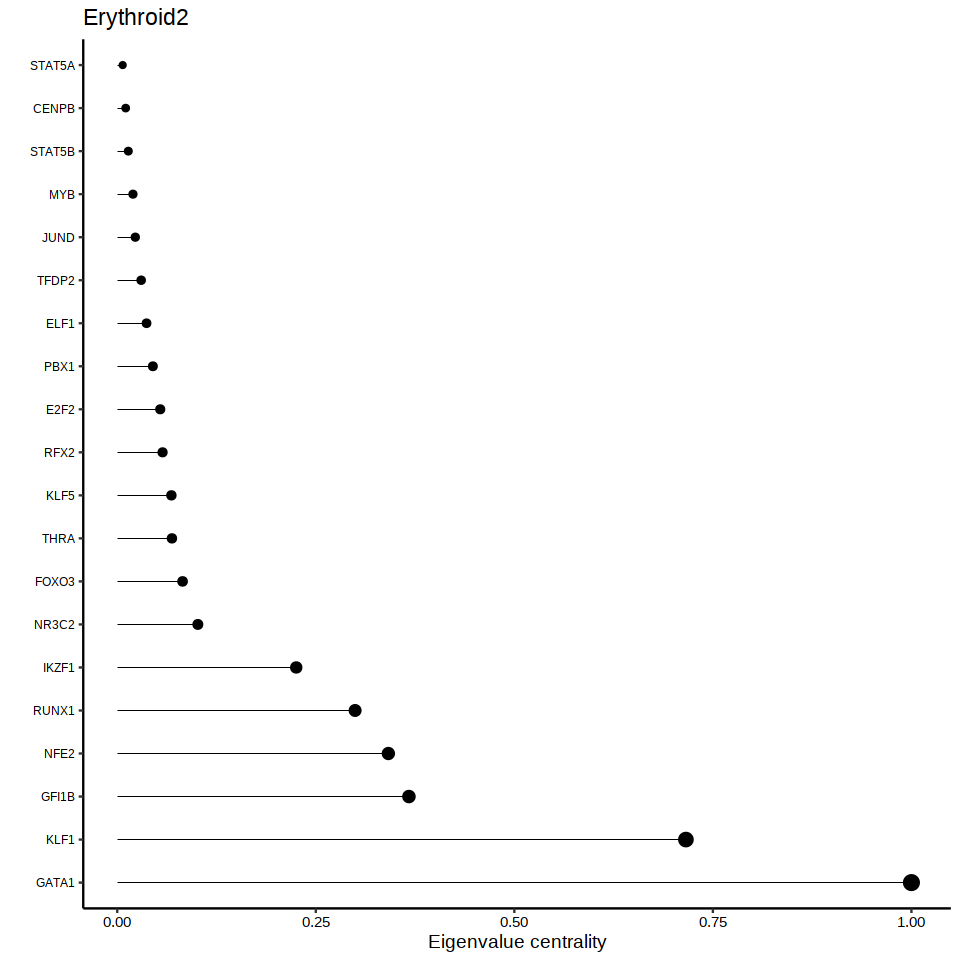

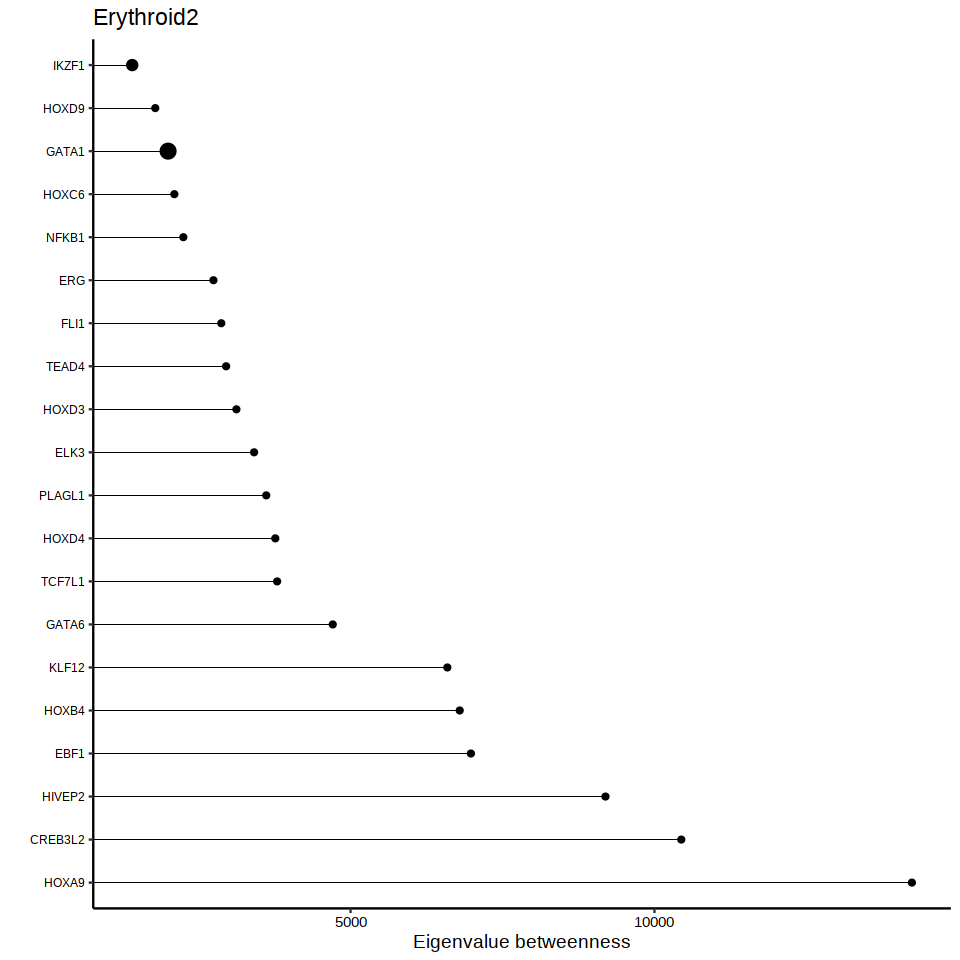

In [140]:
# Eigenvanlue centrality
celltype_i=celltypes.to.plot[5]
    GRN_tmp = group_GRN(metacell_metadata.dt[celltype==celltype_i, metacell])
    
    # Create network
    igraph.tbl = tbl_graph(nodes = GRN_tmp[['nodes']], edges =GRN_tmp[['edges']][score>0]) %>%
  #  activate(edges) %>%
 #   mutate(sign=ifelse(score>0, 'Positive', 'Negative')) %>%
 #   mutate(score=round(abs(score),3)) %>%
    activate(nodes) %>% 
    mutate(eigen_centrality=eigen_centrality(., directed =FALSE, weights = E(.)$score)$vector) %>%
    mutate(eigen_betweenness=estimate_betweenness(., v=V(.), directed =TRUE, weights = E(.)$score, cutoff=0)) # GRN_tmp[['edges']]$score#estimate_betweenness(., directed =TRUE, weights = E(.)$score, cutoff=0)) # #vertex_attr(igraph.tbl)$score
    
nodes.eigen = do.call('cbind', vertex_attr(igraph.tbl)) %>% as.data.table() %>% setnames('node', 'tf')

to.plot <- nodes.eigen[type=='TF'] %>%
    .[,eigen_centrality:=as.numeric(eigen_centrality)] %>%
    .[,eigen_betweenness:=as.numeric(eigen_betweenness)] %>%

  setorder(-eigen_centrality) %>%
  .[,tf:=factor(tf, levels=tf)]

options(repr.plot.width=8, repr.plot.height=8)

p <- ggplot(head(to.plot, 20), aes_string(x="eigen_centrality", y="tf")) +
  geom_point(aes(size=eigen_centrality)) +
  geom_segment(aes(yend=tf), xend=0, size=0.20) +
  scale_size_continuous(range = c(1.25,3.75)) +
  labs(y="", x="Eigenvalue centrality") +
  theme_classic() +
  guides(size="none") +
  theme(
    axis.text.x = element_text(size=rel(1.0), color="black"),
    axis.text.y = element_text(size=rel(0.75), color="black")
  )
p + ggtitle(celltype_i)
p <- ggplot(head(to.plot %>%  setorder(-eigen_betweenness) %>%
  .[,tf:=factor(tf, levels=tf)], 20), aes_string(x="eigen_betweenness", y="tf")) +
  geom_point(aes(size=eigen_centrality)) +
  geom_segment(aes(yend=tf), xend=0, size=0.20) +
  scale_size_continuous(range = c(1.25,3.75)) +
  labs(y="", x="Eigenvalue betweenness") +
  theme_classic() +
  guides(size="none") +
  theme(
    axis.text.x = element_text(size=rel(1.0), color="black"),
    axis.text.y = element_text(size=rel(0.75), color="black")
  )
p + ggtitle(celltype_i)

# Differential testing on edges

Between two celltypes but could also be used to determine celltype-specific edges by comparing against everything else

In [141]:
metacells = metacell_metadata.dt[celltype=='Erythroid3', metacell]
epiblast = edges[,c('node', 'target', ..metacells)]
metacells = metacell_metadata.dt[celltype==celltypes.to.plot[1], metacell]
Erythroid3 = edges[,c('node', 'target', ..metacells)]

In [142]:
edge.stats = lapply(1:nrow(edges), function(x){
    # to-do = first filter for edges that are present & have some minimum difference in accessibility
    keep_edge = abs(mean(as.numeric(epiblast[x,-c(1,2)]))) > 0.04 | abs(mean(as.numeric(Erythroid3[x,-c(1,2)]))) > 0.04
    if(keep_edge==TRUE){
        tmp = data.table(node = epiblast$node[[x]], 
                         target = epiblast$target[[x]], 
                         logFC = log1p(abs(mean(as.numeric(epiblast[x,-c(1,2)]))) / abs(mean(as.numeric(Erythroid3[x,-c(1,2)]))) - 1),
                         pvalue =  t.test(as.numeric(epiblast[x,-c(1,2)]), as.numeric(Erythroid3[x,-c(1,2)]))$p.value) 
        return(tmp) 
        }
    })%>% rbindlist() %>%
     .[,FDR:=p.adjust(pvalue, method ='BH', nrow(.))] %>%
     .[order(FDR)] %>%
     .[,sig:=ifelse(FDR<0.05 & abs(logFC)>2, TRUE, FALSE)] %>%
     .[,logFC:=ifelse(logFC<=-5, -5, ifelse(logFC>=5, 5, logFC))]


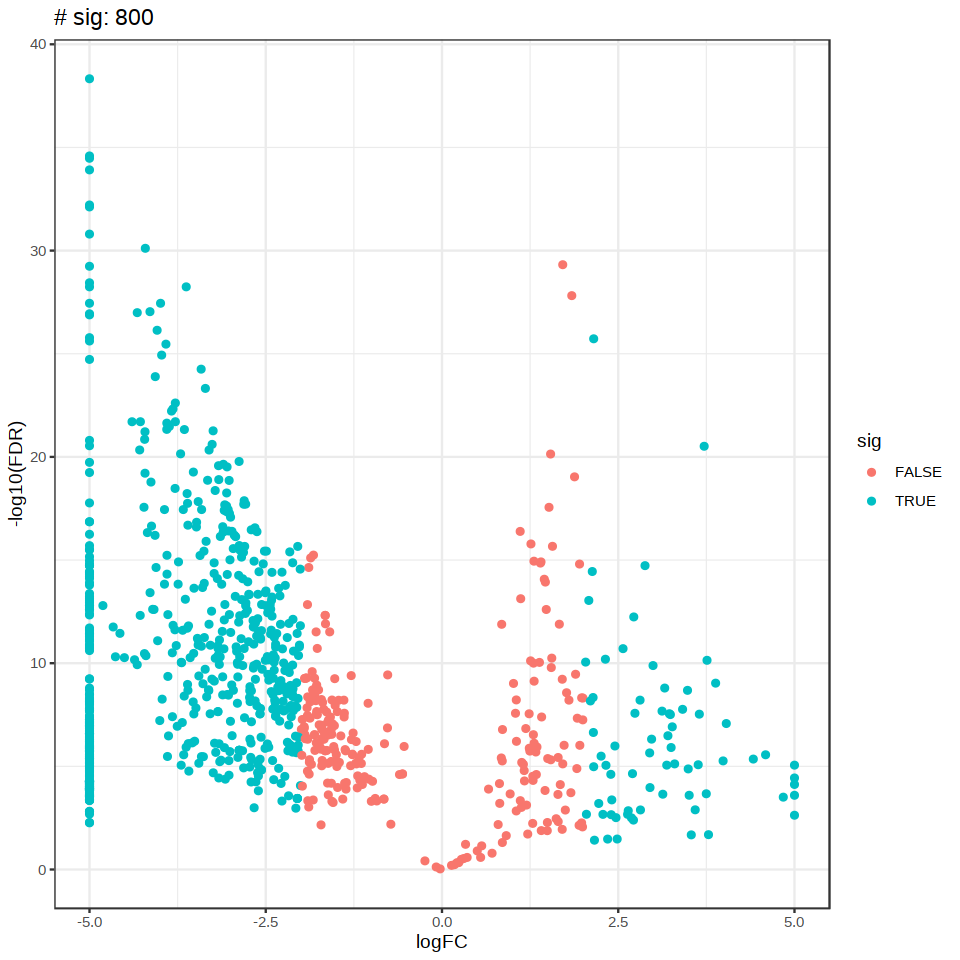

In [143]:
options(repr.plot.width=8, repr.plot.height=8)
ggplot(edge.stats, aes(logFC, -log10(FDR), col=sig)) + 
    geom_point() +
    theme_bw() + 
    ggtitle(paste('# sig:', nrow(edge.stats[sig==TRUE])))

In [148]:
tf_data = data.table(node=all_TFs, type='TF')

In [149]:
#edge.stats = edge.stats[,sig:=ifelse(FDR<0.05 & abs(logFC)>1, TRUE, FALSE)]


In [150]:
nodes_test = data.table(node=unique(c(edge.stats[sig==TRUE]$node,edge.stats[sig==TRUE]$target))) %>% unique(by='node') %>% merge(tf_data,by='node', all.x=TRUE)  %>% .[,type:=ifelse(is.na(type), 'peak', 'TF')]

In [151]:
igraph.tbl = tbl_graph(edges =edge.stats[sig==TRUE], nodes=nodes_test) 

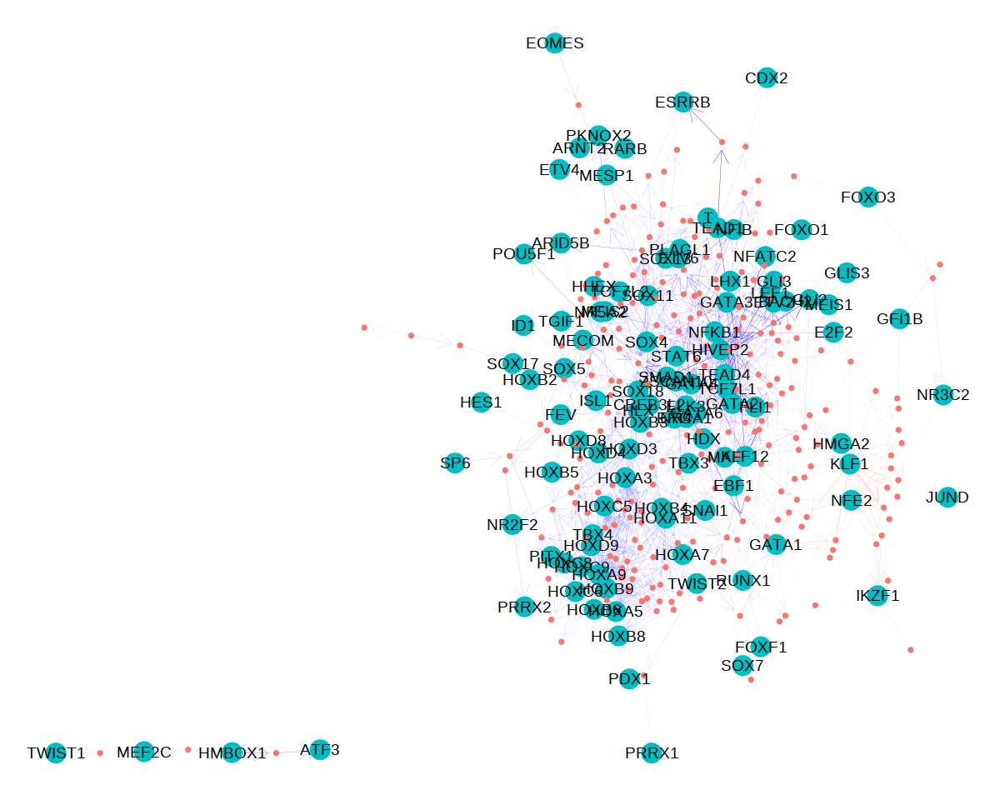

In [152]:
options(repr.plot.width=10, repr.plot.height=8)
ggraph(igraph.tbl, 'stress') +
        # Edges
        geom_edge_link(aes(edge_alpha=-log10(FDR), edge_color=logFC), edge_width=0.1, arrow=arrow(length=unit(4,'mm')), end_cap=circle(2,'mm'), show.legend = T) + #filter=score>score_thr, edge_alpha=-log10(FDR), 
    #    scale_edge_alpha_continuous(range=c(0,1)) +
        scale_edge_colour_gradient2(low="blue", mid='white', high='red') +
        # Nodes
        geom_node_point(aes(size=ifelse(type=='TF', 2, 0.2), color=type)) + #, size=14 # filter=value>value_thr, 
        geom_node_text(aes(filter=type=='TF' , label=node), size=4) + # , size=3.75| type=='target'
        scale_alpha_continuous(range=c(0.0,1)) +
        # theme
        theme_graph() + theme(
         # legend.position = "none"
        )

In [153]:
nrow(edges.dt[node=='GATA5'])
nrow(edge.stats[sig==TRUE & node=='GATA5'])

[1] 0

[1] 0

In [154]:
tf_diff = fread("/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/results/rna/differential/cells/celltype/parsed/diff_expr_results_tfs.txt.gz")

In [167]:
diff = tf_diff[celltypeA==celltypes.to.plot[1] & celltypeB=='Erythroid3',c('gene', 'logFC')] %>% setnames('gene', 'node')

In [168]:
test = data.table(node=unique(c(edge.stats[sig==TRUE]$node,edge.stats[sig==TRUE]$target))) %>% 
    unique(by='node') %>% 
    merge(tf_data,by='node', all.x=TRUE)  %>% 
    .[,type:=ifelse(is.na(type), 'peak', 'TF')] %>%
    merge(diff, by='node', all.x=T) %>% 
    .[,logFC:=ifelse(is.na(logFC), 0, logFC)]
head(test)

node,type,logFC
<chr>,<chr>,<dbl>
FEV,TF,0.000
GATA1,TF,2.223
GFI1B,TF,2.173
HOXA11,TF,0.000
HOXA3,TF,0.000
HOXA5,TF,0.000


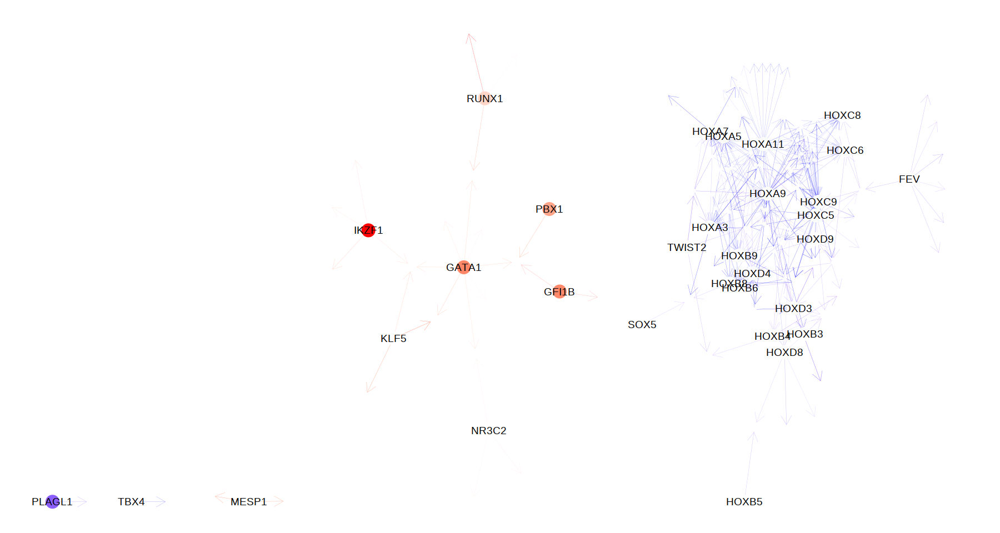

In [170]:
nodes_test = data.table(node=unique(c(edge.stats[sig==TRUE]$node,edge.stats[sig==TRUE]$target))) %>% 
    unique(by='node') %>% 
    merge(tf_data,by='node', all.x=TRUE)  %>% 
    .[,type:=ifelse(is.na(type), 'peak', 'TF')] %>%
    merge(diff, by='node', all.x=T) %>% 
    .[,logFC:=ifelse(is.na(logFC), 0, logFC)]
igraph.tbl = tbl_graph(edges =edge.stats[sig==TRUE], nodes=nodes_test) 

options(repr.plot.width=15, repr.plot.height=8)
ggraph(igraph.tbl, 'stress') +
        # Edges
        geom_edge_link(aes(edge_alpha=-log10(FDR), edge_color=logFC), edge_width=0.1, arrow=arrow(length=unit(4,'mm')), end_cap=circle(2,'mm'), show.legend = T) + #filter=score>score_thr, edge_alpha=-log10(FDR), 
    #    scale_edge_alpha_continuous(range=c(0,1)) +
        scale_edge_colour_gradient2(low="blue", mid='white', high='red') +
        # Nodes
        geom_node_point(aes(size=ifelse(type=='TF', 2, 0.2), color=logFC)) + #, size=14 # filter=value>value_thr, 
        geom_node_text(aes(filter=type=='TF' , label=node), size=4) + # , size=3.75| type=='target'
        scale_color_gradient2(low="blue", mid='white', high='red') + 
        scale_alpha_continuous(range=c(0.0,1)) +
        # theme
        theme_graph() + theme(
   #      legend.position = "right"
        )

In [158]:
gene = 'FOXO1'
nrow(edges.dt[node==gene])
nrow(edge.stats[sig==TRUE & node==gene])

[1] 1

[1] 1

In [159]:
opts$stages

[1] "E7.5"  "E7.75" "E8.0"  "E8.5"  "E8.75"

In [160]:
head(edge.stats[,nodeN:=.N, by=node] %>% .[nodeN>1])

node,target,logFC,pvalue,FDR,sig,nodeN
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<lgl>,<int>
CBFB,chr1:119033686-119034286,-5,4.456374e-42,4.692561e-39,TRUE,28
SMAD1,chr1:119033686-119034286,-5,4.910589e-38,2.585425e-35,TRUE,10
NFKB1,chr18:11077974-11078574,-5,9.563478e-38,3.356781e-35,TRUE,13
TEAD4,chr1:119033686-119034286,-5,4.657334e-37,1.226043e-34,TRUE,25
NFKB1,chr9:32582039-32582639,-5,4.363665e-35,7.658231e-33,TRUE,13
GLI3,chr1:119033686-119034286,-5,1.054689e-33,1.586554e-31,TRUE,2


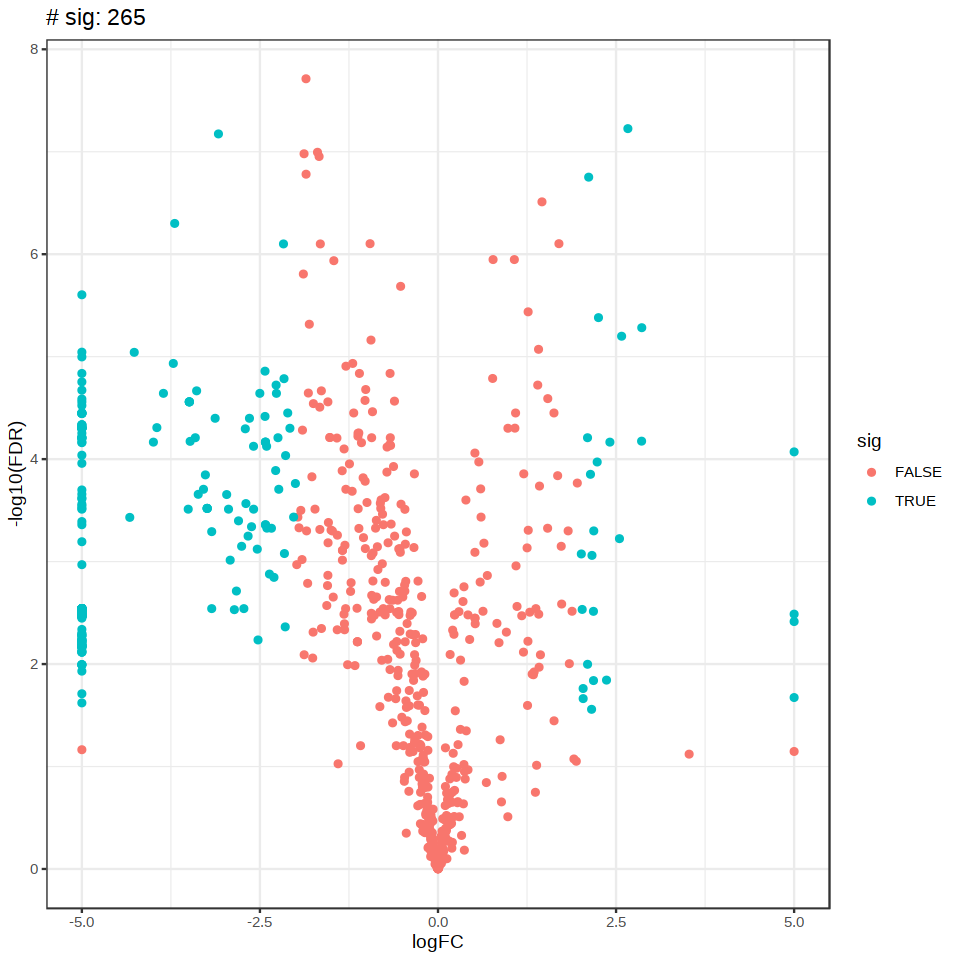

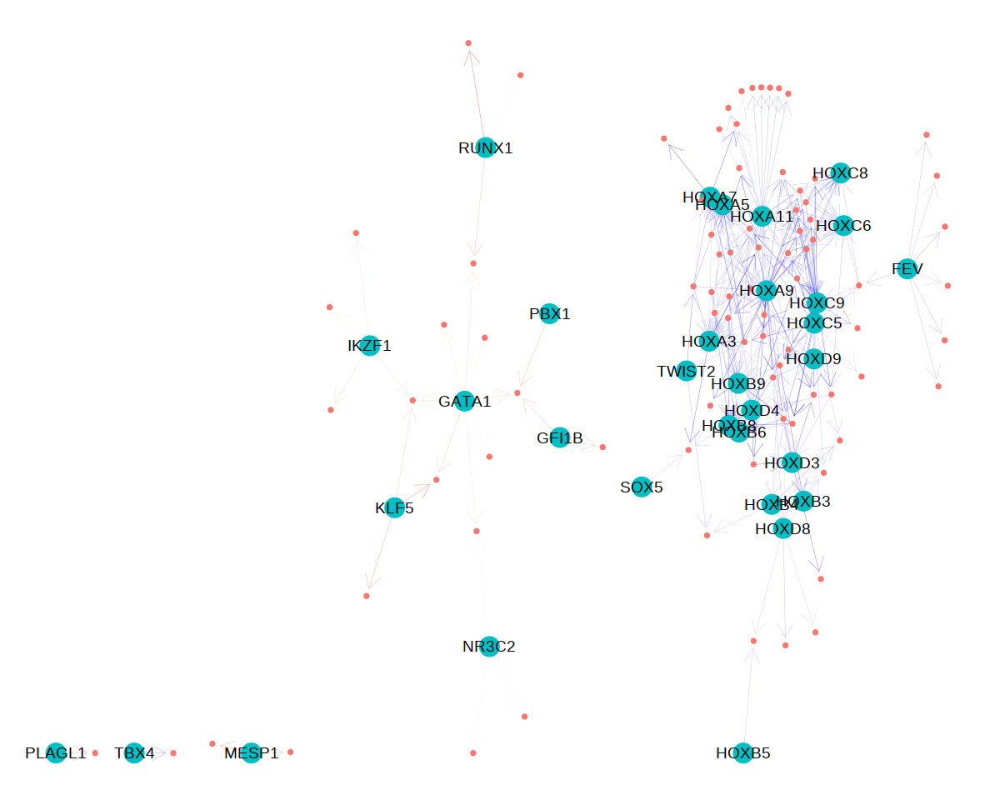

In [161]:
metacells = metacell_metadata.dt[celltype=='Haematoendothelial_progenitors' & stage%in%c('E7.5', 'E7.75'), metacell]
epiblast = edges[,c('node', 'target', ..metacells)]
metacells = metacell_metadata.dt[celltype=='Haematoendothelial_progenitors'& stage%in%c('E8.5', 'E8.75'), metacell]
Erythroid3 = edges[,c('node', 'target', ..metacells)]
edge.stats = lapply(1:nrow(edges), function(x){
    # to-do = first filter for edges that are present & have some minimum difference in accessibility
    keep_edge = abs(mean(as.numeric(epiblast[x,-c(1,2)]))) > 0.04 | abs(mean(as.numeric(Erythroid3[x,-c(1,2)]))) > 0.04
    if(keep_edge==TRUE){
        tmp = data.table(node = epiblast$node[[x]], 
                         target = epiblast$target[[x]], 
                         logFC = log1p(abs(mean(as.numeric(epiblast[x,-c(1,2)]))) / abs(mean(as.numeric(Erythroid3[x,-c(1,2)]))) - 1),
                         pvalue =  t.test(as.numeric(epiblast[x,-c(1,2)]), as.numeric(Erythroid3[x,-c(1,2)]))$p.value) 
        return(tmp) 
        }
    })%>% rbindlist() %>%
     .[,FDR:=p.adjust(pvalue, method ='BH', nrow(.))] %>%
     .[order(FDR)] %>%
     .[,sig:=ifelse(FDR<0.05 & abs(logFC)>2, TRUE, FALSE)] %>%
     .[,logFC:=ifelse(logFC<=-5, -5, ifelse(logFC>=5, 5, logFC))]
options(repr.plot.width=8, repr.plot.height=8)

edge.stats = edge.stats[,nodeN:=.N, by=node] %>% .[nodeN>1]

ggplot(edge.stats, aes(logFC, -log10(FDR), col=sig)) + 
    geom_point() +
    theme_bw() + 
    ggtitle(paste('# sig:', nrow(edge.stats[sig==TRUE])))

nodes_test = data.table(node=unique(c(edge.stats[sig==TRUE]$node,edge.stats[sig==TRUE]$target))) %>% unique(by='node') %>% merge(tf_data,by='node', all.x=TRUE)  %>% .[,type:=ifelse(is.na(type), 'peak', 'TF')]
igraph.tbl = tbl_graph(edges =edge.stats[sig==TRUE], nodes=nodes_test)
options(repr.plot.width=10, repr.plot.height=8)
ggraph(igraph.tbl, 'stress') +
        # Edges
        geom_edge_link(aes(edge_alpha=-log10(FDR), edge_color=logFC), edge_width=0.1, arrow=arrow(length=unit(4,'mm')), end_cap=circle(2,'mm'), show.legend = T) + #filter=score>score_thr, edge_alpha=-log10(FDR), 
    #    scale_edge_alpha_continuous(range=c(0,1)) +
        scale_edge_colour_gradient2(low="blue", mid='white', high='red') +
        # Nodes
        geom_node_point(aes(size=ifelse(type=='TF', 2, 0.2), color=type)) + #, size=14 # filter=value>value_thr, 
        geom_node_text(aes(filter=type=='TF' , label=node), size=4) + # , size=3.75| type=='target'
        scale_alpha_continuous(range=c(0.0,1)) +
        # theme
        theme_graph() + theme(
         # legend.position = "none"
        )

In [ ]:
head(edge.stats[sig==TRUE], 10)

# Per celltype pseudobulk 

In [171]:
io$rna_pseudobulk.sce <- file.path(io$basedir,"results/rna/pseudobulk/celltype/SingleCellExperiment_pseudobulk.rds")
io$atac_pseudobulk.sce <- file.path(io$basedir,"results/atac/archR/pseudobulk/celltype/PeakMatrix/pseudobulk_PeakMatrix_summarized_experiment.rds")


In [172]:
rna_pseudobulk.sce <- readRDS(io$rna_pseudobulk.sce)[,celltypes.to.plot]
atac_pseudobulk.sce <- readRDS(io$atac_pseudobulk.sce)[,celltypes.to.plot]

# Normalise ATAC data
assayNames(atac_pseudobulk.sce) <- "counts"
assay(atac_pseudobulk.sce,"logcounts") <- log(1e6*(sweep(assay(atac_pseudobulk.sce),2,colSums(assay(atac_pseudobulk.sce),na.rm=T),"/"))+1)

In [173]:
# Scale
# rna_tf_pseudobulk_scaled.mtx <- apply(rna_tf_pseudobulk.mtx,1,minmax.normalisation) %>% .[celltypes.to.plot,] %>% t 
logcounts(rna_pseudobulk.sce) <- apply(logcounts(rna_pseudobulk.sce),1,minmax.normalisation) %>% t 
assay(atac_pseudobulk.sce,"logcounts") <- apply(assay(atac_pseudobulk.sce,"logcounts"),1,minmax.normalisation) %>% t 

In [174]:
GRN_celltype = function(celltype, expr_thr = 0.25, acc_thr = 0.25){
    chip_GRN_i_metacell = chip_GRN_i %>% 
    cbind(logcounts(rna_pseudobulk.sce)[str_to_title(chip_GRN_i$tf), celltype]) %>%  # Add expression data
    setnames('V2', 'expr') %>% 
    cbind(assay(atac_pseudobulk.sce[chip_GRN_i$peak, celltype],"logcounts")) %>%  # Add accessibility data
    setnames(celltype, 'acc') %>%
  #  .[,c('expr', 'acc'):=list(minmax.normalisation(expr), minmax.normalisation(acc))] %>%
         .[,peak_score:=minmax.normalisation(chip_score*expr*acc)] %>% # TF-peak score
         .[,target_score:=minmax.normalisation(peak_score*beta*sign(beta))*sign(beta)] #%>% # peak-gene score
    
    
    #TFs = c('FLI1', 'GATA2', 'KLF1', 'TAL1')
    TFs = unique(chip_GRN$tf)
    #TFs = c('POU5F1', 'NANOG')
    #chip_GRN_i = chip_GRN[gene %in% tf][chip_score>0.4 & abs(beta) > 0.3]
    TF_peak = chip_GRN_i_metacell[tf%in%TFs, c('tf', 'peak', 'peak_score', 'expr')]
    peak_gene = chip_GRN_i_metacell[tf%in%TFs, c('peak', 'gene', 'target_score', 'acc')] 
    edges.dt = rbind(TF_peak, peak_gene,use.names=FALSE) %>% .[,c(1,2,3)] %>% setnames(c('node', 'target', 'score')) %>% unique(by=c('node', 'target'))

    
    TF.node = TF_peak[,c('tf', 'expr')] %>% 
        unique(by='tf') %>% 
        setnames(c('node', 'value')) %>% 
        .[,type:='TF'] 
    peak.node =  peak_gene[,c('peak', 'acc')] %>% 
        unique(by='peak') %>% 
        setnames(c('node', 'value')) %>% 
        .[,type:='peak']
    gene.node = chip_GRN_i_metacell[tf%in%TFs, 'gene'] %>%
        unique(by='gene') %>% 
        setnames('node' ) %>% 
        .[,type:=ifelse(node %in% unique(GRN_coef.dt$tf), 'TF', 'target')] %>% 
        .[,value:=minmax.normalisation(logcounts(rna_pseudobulk.sce)[str_to_title(node), celltype])] #%>% # add target gene expression values
#        .[,value:=ifelse(value<=expr_thr, 0, value)]
    nodes.dt = rbind(TF.node, peak.node, gene.node) %>% unique(by='node')
    
    
    no_target = edges.dt[,sum:=sum(score), by='target'] %>% .[sum==0, ] 
    activator = edges.dt[,sum:=sum(score), by='node'] %>% .[sum>0,] 
    edges.dt[,sum:=NULL]
    nodes.dt[node %in% no_target$target & !node %in% activator$node]$value = 0 #& node %in% no_activator
    
    GRN = list(edges.dt, nodes.dt)
    names(GRN) = c('edges', 'nodes')
    return(GRN)
}

plot_pseudobulk_GRN = function(celltype, score_thr=0, value_thr=0){
    # get group GRN
    GRN_tmp = GRN_celltype(celltype)
    
    # Create network
    igraph.tbl = tbl_graph(nodes = GRN_tmp[['nodes']], edges =GRN_tmp[['edges']]) %>%
    activate(edges) %>%
    mutate(sign=ifelse(score>0, 'Positive', 'Negative')) %>%
    mutate(score=abs(score))
    
    # plot
    p = ggraph(igraph.tbl, 'stress') +
    # Edges
        geom_edge_fan(aes(filter=score>0.1, edge_alpha=score, edge_color=sign), edge_width=0.3, arrow=arrow(length=unit(4,'mm')), end_cap=circle(4,'mm'), show.legend = T) + #filter=score>score_thr, 
        scale_edge_alpha_continuous(range=c(0,1)) +
        scale_edge_colour_manual(values=c("Positive"="#08c20e", "Negative"="darkred", "0"='white')) +
        # Nodes
        geom_node_point(aes(filter=value>0.3,size=ifelse(type=='TF', value, value/5), color=type, alpha=value)) + #It looks nice to filter above a threshold but it's not fair because TF-peak are higher than peak-target, and there is no minmax norm so far
        geom_node_text(aes(filter=value>0.3 & type=='TF' , label=node, alpha=value)) + # , size=3.75| type=='target'
        geom_node_point(aes(alpha=0)) + # so that layout is the same for all celltypes
        scale_alpha_continuous(range=c(0.0,1)) +
        # theme
        theme_graph() + theme(
          legend.position = "none"
        ) + ggtitle(celltype)
    return(p)
}

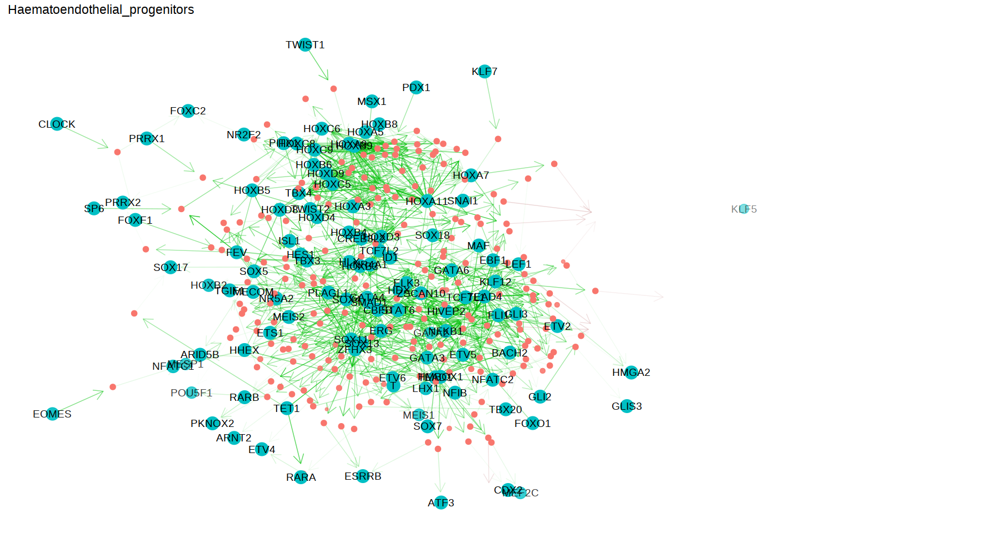

In [175]:
print(plot_pseudobulk_GRN(celltypes.to.plot[1]))

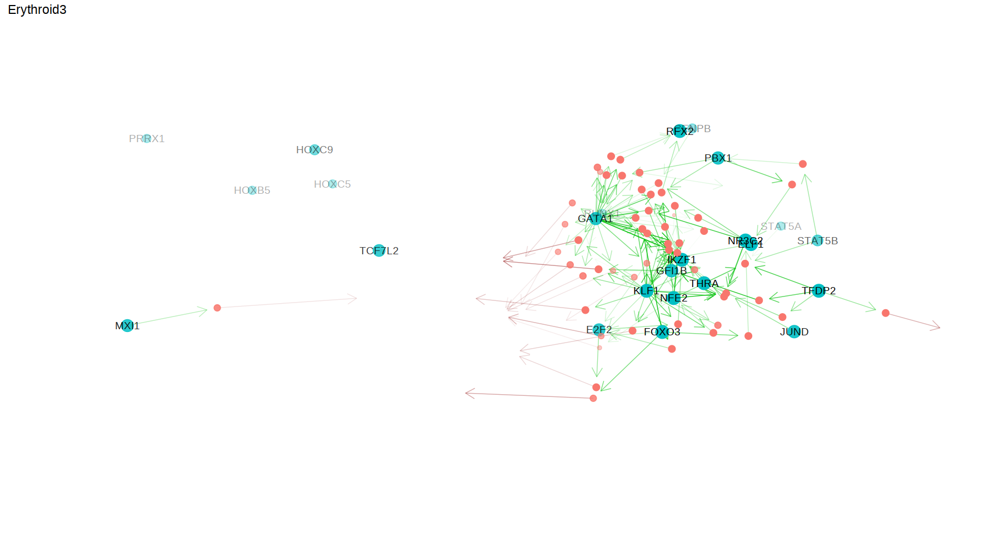

In [176]:
print(plot_pseudobulk_GRN(celltypes.to.plot[6]))

# With ATAC but without peaks as nodes

In [177]:
#######################
## Load RNA and ATAC ##
#######################

# Load SingleCellExperiment
rna_metacells.sce <- readRDS(args$sce)

# Load ATAC SummarizedExperiment
atac_peakMatrix_metacells.se <- readRDS(args$atac_peak_matrix)

# Normalise ATAC data
assayNames(atac_peakMatrix_metacells.se) <- "counts"
assay(atac_peakMatrix_metacells.se,"logcounts") <- log(1e6*(sweep(assay(atac_peakMatrix_metacells.se),2,colSums(assay(atac_peakMatrix_metacells.se),na.rm=T),"/"))+1)

# Minmax normalize
logcounts(rna_metacells.sce) = apply(logcounts(rna_metacells.sce),1,minmax.normalisation) %>% t
assay(atac_peakMatrix_metacells.se,"logcounts") = apply(assay(atac_peakMatrix_metacells.se,"logcounts"), 1, minmax.normalisation) %>% t

# Make sure that samples are consistent
samples <- intersect(colnames(rna_metacells.sce),colnames(atac_peakMatrix_metacells.se))
rna_metacells.sce <- rna_metacells.sce[,samples]
atac_peakMatrix_metacells.se <- atac_peakMatrix_metacells.se[,samples]

print(sprintf("Number of metacells: %s",length(samples)))
metacell_metadata.dt = metacell_metadata.dt[metacell %in% samples]

##################################
## Load global GRN coefficients ##
##################################
io$grn_coef <- file.path(args$outdir, 'global_chip_GRN_coef.txt.gz')
opts$min_coef <- 0.25

GRN_coef.dt <- fread(io$grn_coef) %>% 
  .[,gene:=toupper(gene)] %>% #.[gene%in%unique(marker_TFs_filt.dt$gene) & tf%in%unique(marker_TFs_filt.dt$gene)] %>%
  .[pvalue<0.10 & abs(beta)>=opts$min_coef]

TFs <- intersect(GRN_coef.dt[,.N,by="tf"][N>=3,tf], GRN_coef.dt[,.N,by="gene"][N>=3,gene])
GRN_coef.dt <- GRN_coef.dt[tf%in%TFs & gene%in%TFs]

#######################
##  Load ChIP-scores ##
#######################
args$outfile <- file.path(args$outdir, "TF2gene_after_virtual_chip.txt.gz")
chip = fread(args$outfile) %>% 
  .[,gene:=toupper(gene)] %>%
  .[gene!='']

#######################
##  merge GRN & ChIP ##
#######################
chip_GRN = merge(chip, GRN_coef.dt, by=c('tf', 'gene')) %>%
    .[tf!=gene] # remove auto regulation because it messes up the plot

## test
#TFs = c('FLI1', 'GATA2', 'KLF1', 'TAL1')
TFs = unique(chip_GRN$tf)
#TFs = c('POU5F1', 'NANOG')
chip_GRN_i = chip_GRN[gene %in% tf][chip_score>0.25 & abs(beta) > 0.35]

[1] "Number of metacells: 175"


In [285]:
TF_target = chip_GRN_i[,c('tf', 'gene', 'beta')] %>%
    .[,sign:=ifelse(beta>0, 'Positive', ifelse(beta<0, 'Negative', '0'))] %>%
    .[,beta:=abs(beta)]

In [286]:
tf_keep = TF_target[,N:=.N, by=tf] %>% .[N>3, tf]  %>% unique() 
TF_target = TF_target[tf %in% tf_keep] %>% .[,N:=NULL]

In [ ]:
TF.node = TF_target[,c('tf')] %>% 
    unique(by='tf') %>% 
    setnames(c('node')) %>% 
    .[,type:='TF'] 
gene.node = chip_GRN_i[tf%in%TFs, 'gene'] %>%
    unique(by='gene') %>% 
    setnames('node' ) %>% 
    .[,type:=ifelse(node %in% unique(GRN_coef.dt$tf), 'TF', 'target')]
nodes.dt = rbind(TF.node, gene.node) %>% unique(by='node')

edges.dt = TF_target %>% setnames(c('node', 'target', 'score', 'sign')) #%>% unique(by=c('node', 'target'))

 igraph.tbl = tbl_graph(nodes = nodes.dt, edges = edges.dt)

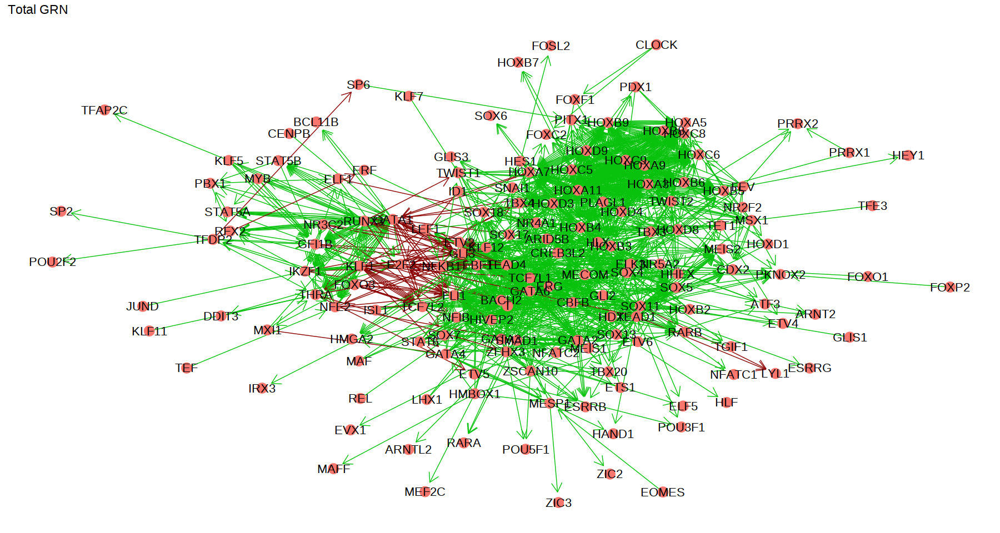

In [180]:
options(repr.plot.width=15, repr.plot.height=8)
ggraph(igraph.tbl, 'stress') +
    # Edges
    geom_edge_fan(aes(edge_alpha=1, edge_color=sign), edge_width=0.3, arrow=arrow(length=unit(4,'mm')), end_cap=circle(4,'mm'), show.legend = T) +
    scale_edge_alpha_continuous(range=c(0,max(edges.dt$score))) +
    scale_edge_colour_manual(values=c("Positive"="#08c20e", "Negative"="darkred")) +
    # Nodes
    geom_node_point(aes(size=3, color=type)) + #, size=14
    geom_node_text(aes(label=node, size=3)) + # , size=3.75| type=='target'
    scale_alpha_continuous(range=c(0.0,1)) +
    # theme
    theme_graph() + theme(
      legend.position = "none"
    ) + 
    ggtitle('Total GRN')

In [181]:
#####################
## Load trajectory ##
#####################
#io$metacell_metadata <- file.path(args$outdir, "metacells_metadata.txt.gz")

#metacell_metadata.dt <- fread(io$metacell_metadata)

In [182]:
GRN_metacell = function(metacell, expr_thr = 0.25, acc_thr = 0.25, TFs_i =  unique(chip_GRN$tf)){
    
    chip_GRN_i_metacell = chip_GRN_i %>% 
        cbind(logcounts(rna_metacells.sce)[str_to_title(chip_GRN_i$tf), metacell]) %>%  # Add expression data
        setnames('V2', 'expr') %>% 
        cbind(assay(atac_peakMatrix_metacells.se[chip_GRN_i$peak, metacell],"logcounts")) %>%  # Add accessibility data
        setnames(metacell, 'acc') %>%
  #      .[,c('expr', 'acc'):=list(minmax.normalisation(expr), minmax.normalisation(acc))] %>%
         .[,peak_score:=minmax.normalisation(chip_score*expr*acc)] %>% # TF-peak score
         .[,target_score:=minmax.normalisation(peak_score*beta*sign(beta))*sign(beta)] %>%
         .[,sign:=ifelse(sign(beta)>0, 'Positive', 'Negative')]#%>% # peak-gene score
        # .[,peak_score:=chip_score*expr*acc] %>% # TF-peak score
        # .[,target_score:=peak_score*beta] #%>%
    
    #TFs = c('FLI1', 'GATA2', 'KLF1', 'TAL1')
    TFs = TFs_i
    #TFs = c('POU5F1', 'NANOG')
    #chip_GRN_i = chip_GRN[gene %in% tf][chip_score>0.4 & abs(beta) > 0.3]
    TF_target = chip_GRN_i_metacell[,c('tf', 'gene', 'target_score', 'sign')] %>%
     #   .[,sign:=ifelse(target_score>0, 'Positive', ifelse(target_score<0, 'Negative', '0'))] %>%
        .[,target_score:=abs(target_score)] %>%
        .[,id:=1:nrow(.)] %>%
        .[order(-target_score)] %>% unique(by=c('tf', 'gene')) %>%# select only highest score if multiple same TF-gene edges
        .[order(id)] %>% .[, id:=NULL]
    edges.dt = TF_target %>% setnames(c('node', 'target', 'score', 'sign')) %>% unique(by=c('node', 'target'))

    
    TF.node = chip_GRN_i_metacell[,c('tf', 'expr')] %>% 
        .[,type:='TF']  %>%
        setnames(c('node', 'value', 'type'))
    gene.node = chip_GRN_i[tf%in%TFs, 'gene'] %>%
        unique(by='gene') %>% 
        setnames('node' ) %>% 
        # Fix later: Normalisation now happens separately for targets and TFs, but should be done together.
        .[,value:=(minmax.normalisation(logcounts(rna_metacells.sce)[str_to_title(node), metacell]))] %>%
        .[,type:=ifelse(node %in% unique(GRN_coef.dt$tf), 'TF', 'target')] 

    nodes.dt = rbind(TF.node, gene.node) %>% unique(by='node')

    edges.dt = TF_target %>% setnames(c('node', 'target', 'score', 'sign')) #%>% unique(by=c('node', 'target'))
    
    
     # no_target = edges.dt[,sum:=sum(score), by='target'] %>% .[sum==0, ] 
     # activator = edges.dt[,sum:=sum(score), by='node'] %>% .[sum>0,] 
     # edges.dt[,sum:=NULL]
     # nodes.dt[node %in% no_target$target & !node %in% activator$node]$value = 0 #& node %in% no_activator
    
    GRN = list(edges.dt, nodes.dt)
    names(GRN) = c('edges', 'nodes')
    return(GRN)
}

In [183]:
GRN_per_metacell = lapply(metacell_metadata.dt$metacell, GRN_metacell)
names(GRN_per_metacell) = metacell_metadata.dt$metacell

In [184]:
edges = GRN_per_metacell[[1]]$edges[,c(1,2,4)]
for(x in metacell_metadata.dt$metacell){
    tmp = GRN_per_metacell[[x]]$edges[,'score'] %>% setnames(x)
    edges = cbind(edges, tmp)
    }

nodes = GRN_per_metacell[[1]]$nodes[,c(1,3)]
for(x in metacell_metadata.dt$metacell){
    tmp = GRN_per_metacell[[x]]$nodes[,'value'] %>% setnames(x)
    nodes = cbind(nodes, tmp)
    }

In [185]:
group_GRN = function(metacells){
    nodes_tmp = data.table(node = nodes$node, type=nodes$type, value = rowMeans(as.matrix(nodes[,..metacells])))
    edges_tmp = data.table(node = edges$node, target=edges$target, sign = edges$sign,  score = rowMeans(as.matrix(edges[,..metacells])))
    GRN = list(edges_tmp, nodes_tmp)
    names(GRN) = c('edges', 'nodes')
    return(GRN)
}

plot_group_GRN = function(metacells, score_thr=0, value_thr=0){
    # get group GRN
    GRN_tmp = group_GRN(metacells)
    
    # Create network
    igraph.tbl_tmp = tbl_graph(nodes = GRN_tmp[['nodes']], edges =  GRN_tmp[['edges']]) #%>%
        # activate(edges) %>%
        # mutate(sign=ifelse(score>0, 'Positive', ifelse(score<0, 'Negative', '0'))) %>%
        # mutate(score=abs(score))
    
    # plot
    p = ggraph(igraph.tbl_tmp, 'stress') +
    # Edges
        geom_edge_fan(aes(filter=score>0.1, edge_alpha=score, edge_color=sign), edge_width=0.3, arrow=arrow(length=unit(4,'mm')), end_cap=circle(4,'mm'), show.legend = T) + #filter=score>score_thr, 
        scale_edge_alpha_continuous(range=c(0,1)) +
        scale_edge_colour_manual(values=c("Positive"="#08c20e", "Negative"="darkred")) +
        # Nodes
        geom_node_point(aes(filter=value>0.3,size=value, alpha=value, col=value)) + #It looks nice to filter above a threshold but it's not fair because TF-peak are higher than peak-target, and there is no minmax norm so far
        geom_node_text(aes(filter=value>0.3 & type=='TF' , label=node, alpha=value)) + # , size=3.75| type=='target'
        geom_node_point(aes(alpha=0)) + # so that layout is the same for all celltypes
        viridis::scale_color_viridis() + 
        scale_alpha_continuous(range=c(0.0,1)) +
        # theme
        theme_graph() + theme(
          legend.position = "none"
        )
    return(p)
}

In [186]:
options(repr.plot.width=15, repr.plot.height=8)

metacells = metacell_metadata.dt[celltype==celltypes.to.plot[1], metacell]
# p = plot_group_GRN(metacells)
# p

GRN_tmp = group_GRN(metacells)

# Create network
igraph.tbl_tmp = tbl_graph(nodes = GRN_tmp[['nodes']], edges =  GRN_tmp[['edges']]) %>%
    activate(edges) %>%
    mutate(sign=ifelse(score>0, 'Positive', ifelse(score<0, 'Negative', '0'))) %>%
    mutate(score=abs(score))

In [187]:
# GIF of all celltypes
for(i in celltypes.to.plot){
    print(i)
    metacells = metacell_metadata.dt[celltype==i, metacell]
    p = plot_group_GRN(metacells) + ggtitle(i)
    
   png(file.path(io$outdir,sprintf("gif/full_network_coloured_by_%s_weighted_no_peaks.png",i)), width = 1300, height = 850, bg = "white")
       print(p)
   dev.off()
}
library(magick)
sprintf("%s/gif/full_network_coloured_by_%s_weighted_no_peaks.png",io$outdir,celltypes.to.plot) %>%
  map(image_read) %>%
  image_join %>%
  image_animate(fps=0.5) %>%
  image_write(quality=100, path = sprintf("%s/gif/full_network_coloured_by_celltype_weighted_no_peaks.gif",io$outdir))

[1] "Haematoendothelial_progenitors"
[1] "Blood_progenitors_1"
[1] "Blood_progenitors_2"
[1] "Erythroid1"
[1] "Erythroid2"
[1] "Erythroid3"


# Differential on ATAC without peaks

In [188]:
head(edges)

node,target,sign,E7.5_rep1#AATCTCAAGGAGTAAT-1,E7.5_rep1#AGCTACGTCAAGCCTG-1,E7.5_rep1#AGCTTAATCCTGCGAA-1,E7.5_rep1#CCCTCAGTCCCGTTGT-1,E7.5_rep1#CCTAAATCAAACAACA-1,E7.5_rep1#GGTATTTCAATAACGA-1,E7.5_rep1#TAAACAGCATTAGGCC-1,⋯,E8.75_rep2#GTGAGGAGTTGCTTCG-1,E8.75_rep2#GTGCTGGGTAAACAAG-1,E8.75_rep2#GTGCTTCTCGGGCCAT-1,E8.75_rep2#TATCACAAGAATGACG-1,E8.75_rep2#TCATTACTCTAAGTCA-1,E8.75_rep2#TCTCCTCGTTTGCAGA-1,E8.75_rep2#TCTGGCTTCGAGGAGT-1,E8.75_rep2#TCTTCAAGTGCTTAGA-1,E8.75_rep2#TGGACTAGTCATGCCC-1,E8.75_rep2#TTGGGCGGTCAAGACC-1
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ARID5B,MECOM,Positive,0.03428982,0.0000000,0.1158678,0.1429646,0.03153788,0.00000000,0.1029441,⋯,0.02377630,0.03012425,0.02336481,0.0000000,0.0000000,0.01844337,0.05369803,0.04821870,0.14225507,0.0000000
BACH2,ELK3,Positive,0.06683370,0.1588522,0.0000000,0.2585476,0.00000000,0.00000000,0.0000000,⋯,0.03277084,0.00000000,0.00000000,0.0000000,0.0000000,0.05750450,0.00000000,0.08452433,0.44691148,0.0000000
BACH2,NFIB,Positive,0.00000000,0.0000000,0.0000000,0.2146877,0.00000000,0.10332383,0.0000000,⋯,0.00000000,0.00000000,0.00000000,0.0000000,0.0000000,0.00000000,0.00000000,0.00000000,0.35746478,0.0000000
BACH2,RARB,Positive,0.00000000,0.0000000,0.1144952,0.1603714,0.08291857,0.05175493,0.0000000,⋯,0.03185846,0.00000000,0.00000000,0.0000000,0.0000000,0.00000000,0.00000000,0.04882886,0.08103989,0.0000000
CBFB,BACH2,Positive,0.17966669,0.6347002,0.4133219,0.3794664,0.19664510,0.23235805,0.6261620,⋯,0.11608549,0.15156710,0.15944076,0.1581927,0.3927510,0.15993602,0.25947457,0.21451070,0.51829197,0.2787799
CBFB,E2F2,Negative,0.29420926,0.3911750,0.3335116,0.3368289,0.00000000,0.24908458,0.0000000,⋯,0.00000000,0.00000000,0.08555466,0.0000000,0.3039201,0.00000000,0.14686920,0.09973331,0.21002663,0.1204422


In [189]:
differential_GRN = function(celltype1_in, celltyp2_in){
    metacells = metacell_metadata.dt[celltype==celltype1_in, metacell]
    celltype1 = edges[,c('node', 'target', ..metacells)]
    metacells = metacell_metadata.dt[celltype==celltyp2_in, metacell]
    celltype2 = edges[,c('node', 'target', ..metacells)]
    
    edge.stats = lapply(1:nrow(edges), function(x){
        # to-do = first filter for edges that are present & have some minimum difference in accessibility
        keep_edge = abs(mean(as.numeric(celltype1[x,-c(1,2)]))) > 0.04 | abs(mean(as.numeric(celltype2[x,-c(1,2)]))) > 0.04
        if(keep_edge==TRUE){
            tmp = data.table(node = celltype1$node[[x]], 
                             target = celltype1$target[[x]], 
                             logFC = log1p(abs(mean(as.numeric(celltype1[x,-c(1,2)]))) / abs(mean(as.numeric(celltype2[x,-c(1,2)]))) - 1),
                             pvalue =  t.test(as.numeric(celltype1[x,-c(1,2)]), as.numeric(celltype2[x,-c(1,2)]))$p.value) 
            return(tmp) 
            }
        })%>% rbindlist() %>%
         .[,FDR:=p.adjust(pvalue, method ='BH', nrow(.))] %>%
         .[order(FDR)] %>%
         .[,sig:=ifelse(FDR<0.05 & abs(logFC)>2, TRUE, FALSE)] %>%
         .[,logFC:=ifelse(logFC<=-2.5, -2.5, ifelse(logFC>=2.5, 2.5, logFC))] %>%
        merge(edges[,c('node', 'target', 'sign')], ., by=c('node', 'target'), all.x=TRUE) %>%
        .[,logFC:=ifelse(is.na(logFC), 0, logFC)] %>%
        .[,FDR:=ifelse(is.na(FDR), 0, FDR)]
    
    metacells = metacell_metadata.dt[celltype==celltype1_in, metacell]
    celltype1 = nodes[,c('node', ..metacells)]
    metacells = metacell_metadata.dt[celltype==celltyp2_in, metacell]
    celltype2 = nodes[,c('node', ..metacells)]
    
    node.stats = lapply(1:nrow(nodes), function(x){
        # to-do = first filter for edges that are present & have some minimum difference in accessibility
        keep_node = abs(mean(as.numeric(celltype1[x,-c(1,2)]))) > 0.2 | abs(mean(as.numeric(celltype2[x,-c(1,2)]))) > 0.2
        if(keep_node==TRUE){
            tmp = data.table(node = celltype1$node[[x]], 
                             logFC = log1p(abs(mean(as.numeric(celltype1[x,-c(1,2)]))) / abs(mean(as.numeric(celltype2[x,-c(1,2)]))) - 1))
            return(tmp) 
            }
        })%>% rbindlist() %>%
        .[,logFC:=ifelse(logFC<=-2.5, -2.5, ifelse(logFC>=2.5, 2.5, logFC))] %>%
        merge(nodes[,c('node')], ., by=c('node'), all.x=TRUE) %>%
        .[,logFC:=round(ifelse(is.na(logFC), 0, logFC),2)]
    
    return(list(edge.stats, node.stats))
}
    


In [207]:
diff_test = differential_GRN(celltypes.to.plot[6], celltypes.to.plot[1])

Warning message:
“Removed 39 rows containing non-finite values (stat_edge_fan).”


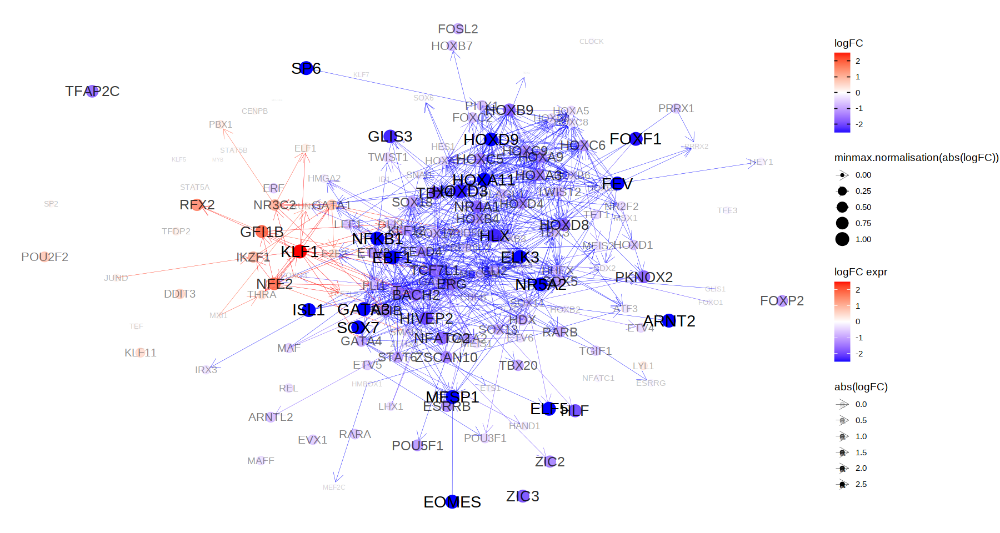

In [208]:
    # Create network
    igraph.tbl_tmp = tbl_graph(nodes = diff_test[[2]], edges = diff_test[[1]]) 
    
    # plot
    p = ggraph(igraph.tbl_tmp, 'stress') +
    # Edges
        geom_edge_fan(aes(filter=sig==TRUE, edge_color=logFC), edge_width=0.1, arrow=arrow(length=unit(4,'mm')), end_cap=circle(2,'mm'), show.legend = T) + #filter=score>score_thr, edge_alpha=-log10(FDR), 
    #    scale_edge_alpha_continuous(range=c(0,1)) +
        scale_edge_colour_gradient2(low="blue", mid='white', high='red') +
        # Nodes
        geom_node_point(aes(size=minmax.normalisation(abs(logFC)), color=logFC, alpha=abs(logFC))) + #It looks nice to filter above a threshold but it's not fair because TF-peak are higher than peak-target, and there is no minmax norm so far
        geom_node_text(aes(label=node, alpha=abs(logFC),size=minmax.normalisation(abs(logFC)))) + # , size=3.75| type=='target'
   #     geom_node_point(aes(alpha=0)) + # so that layout is the same for all celltypes
        scale_colour_gradient2(low="blue", mid='white', high='red', name='logFC expr') +
        # theme
        theme_graph() + theme(
          legend.position = "right"
        )
options(repr.plot.width=15, repr.plot.height=8)

p

In [209]:
celltypes.to.plot[1]

[1] "Haematoendothelial_progenitors"

Warning message:
“Removed 66 rows containing non-finite values (stat_edge_fan).”
Warning message:
“Removed 897 rows containing non-finite values (stat_edge_fan).”


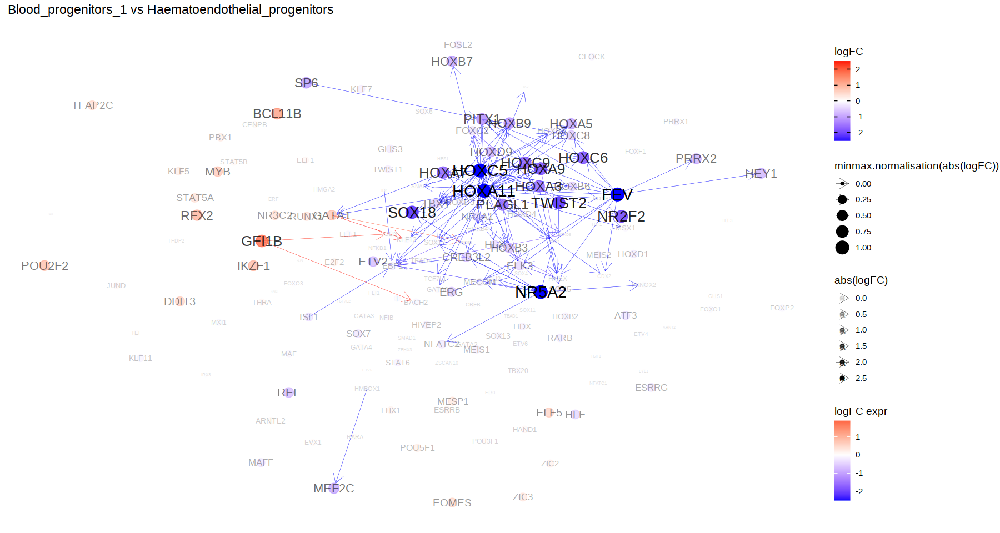

Warning message:
“Removed 1494 rows containing non-finite values (stat_edge_fan).”


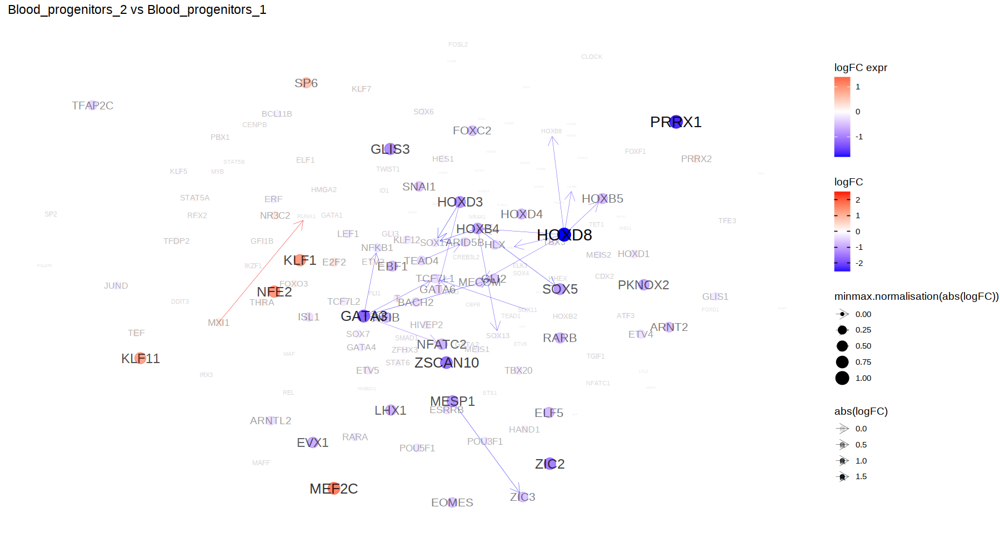

Warning message:
“Removed 1809 rows containing non-finite values (stat_edge_fan).”


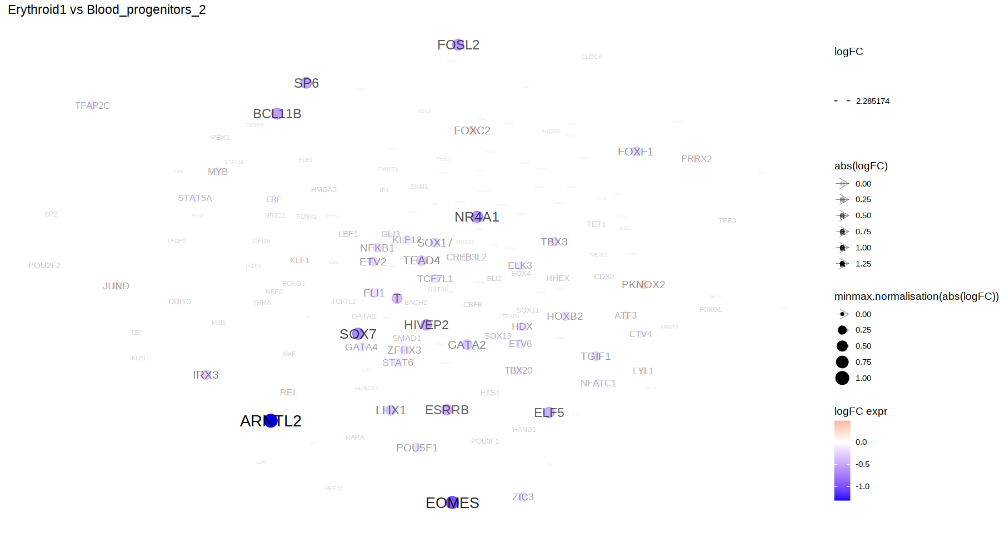

Warning message:
“Removed 2106 rows containing non-finite values (stat_edge_fan).”


ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'y' in selecting a method for function 'merge': missing value where TRUE/FALSE needed


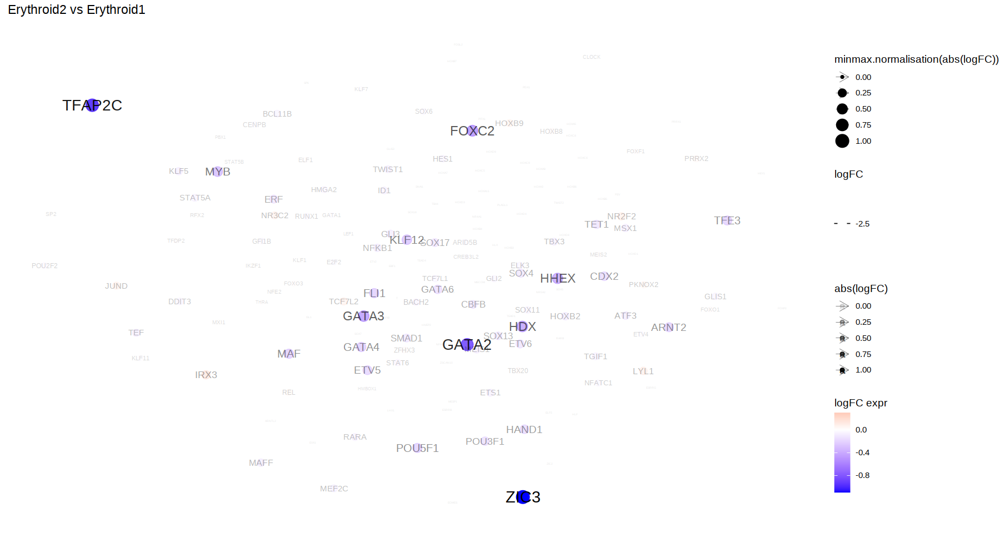

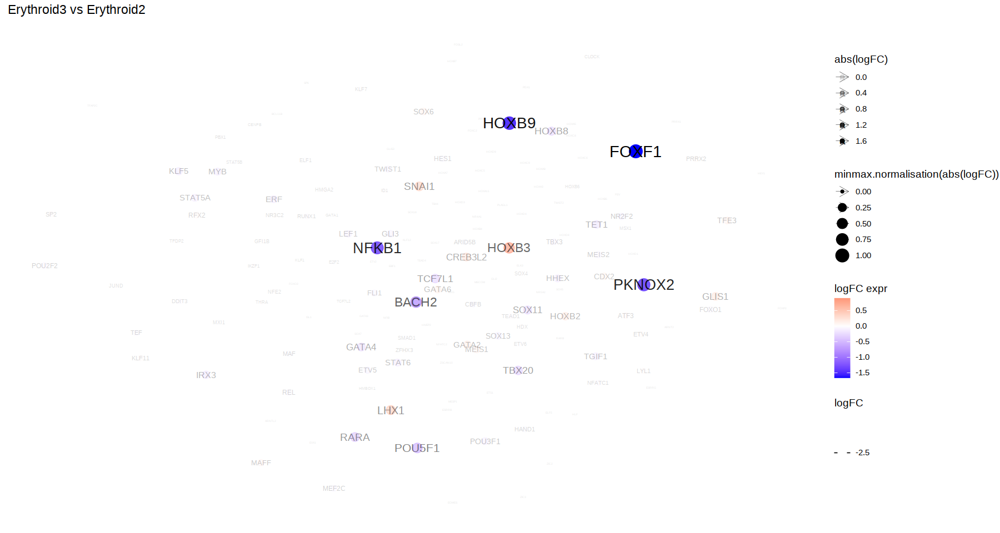

In [211]:
for(i in 1:length(celltypes.to.plot)){
    diff_test = differential_GRN(celltypes.to.plot[i+1], celltypes.to.plot[i])
    # Create network
    igraph.tbl_tmp = tbl_graph(nodes = diff_test[[2]], edges = diff_test[[1]]) 
    
    # plot
    p = ggraph(igraph.tbl_tmp, 'stress') +
    # Edges
        geom_edge_fan(aes(filter=sig==TRUE, edge_color=logFC), edge_width=0.1, arrow=arrow(length=unit(4,'mm')), end_cap=circle(2,'mm'), show.legend = T) + #filter=score>score_thr, edge_alpha=-log10(FDR), 
    #    scale_edge_alpha_continuous(range=c(0,1)) +
        scale_edge_colour_gradient2(low="blue", mid='white', high='red') +
        # Nodes
        geom_node_point(aes(size=minmax.normalisation(abs(logFC)), color=logFC, alpha=abs(logFC))) + #It looks nice to filter above a threshold but it's not fair because TF-peak are higher than peak-target, and there is no minmax norm so far
        geom_node_text(aes(label=node, alpha=abs(logFC),size=minmax.normalisation(abs(logFC)))) + # , size=3.75| type=='target'
   #     geom_node_point(aes(alpha=0)) + # so that layout is the same for all celltypes
        scale_colour_gradient2(low="blue", mid='white', high='red', name='logFC expr') +
        # theme
        theme_graph() + theme(
          legend.position = "right"
        ) + ggtitle(paste0(celltypes.to.plot[i+1], ' vs ', celltypes.to.plot[i]))
    options(repr.plot.width=15, repr.plot.height=8)

print(p)
}

In [247]:
edges_celltype = lapply(celltypes.to.plot, function(celltype_in){
    
    metacells = metacell_metadata.dt[celltype==celltype_in, metacell]
    group_GRN(metacells)[['edges']] %>% .[,celltype:=celltype_in]
}) %>% rbindlist() %>% .[,celltype:=factor(celltype, levels=celltypes.to.plot)]

nodes_celltype = lapply(celltypes.to.plot, function(celltype_in){
    
    metacells = metacell_metadata.dt[celltype==celltype_in, metacell]
    group_GRN(metacells)[['nodes']] %>% .[,celltype:=celltype_in]
}) %>% rbindlist() %>% .[,celltype:=factor(celltype, levels=celltypes.to.plot)]

In [259]:
head(edges_celltype)

node,target,sign,score,celltype
<chr>,<chr>,<chr>,<dbl>,<fct>
AHR,ST3GAL2,Positive,0.01282675,Haematoendothelial_progenitors
ARID3B,ARAP3,Positive,0.24414556,Haematoendothelial_progenitors
ARID3B,DUSP6,Positive,0.09536114,Haematoendothelial_progenitors
ARID3B,FARP1,Positive,0.33097953,Haematoendothelial_progenitors
ARID3B,GNG2,Positive,0.14594679,Haematoendothelial_progenitors
ARID3B,KIF6,Positive,0.08470727,Haematoendothelial_progenitors


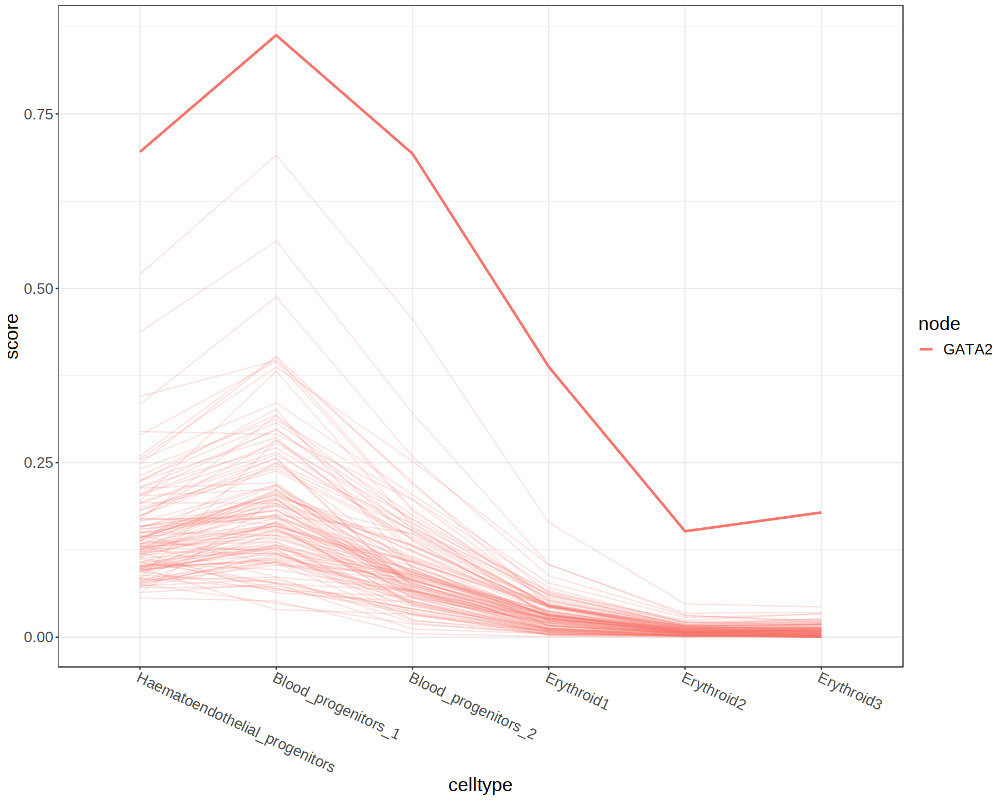

In [258]:
options(repr.plot.width=15, repr.plot.height=12)

TFs=c( 'GATA2')#, 'GATA1', 'GATA2')
ggplot(edges_celltype[node%in%TFs], aes(celltype, score, group=interaction(node, target), col=node)) + 
   # geom_point() + 
    geom_line(alpha=0.2) + 
    geom_line(data=nodes_celltype[node%in%TFs], aes(celltype, value, col=node, group=node), size=1) + 
    theme_bw() + 
    theme(text=element_text(size=20),
         axis.text.x=element_text(angle=-25, hjust=0, vjust=1))

# Graph statistics

In [212]:
metacells = metacell_metadata.dt[celltype==celltypes.to.plot[1], metacell]
GRN_tmp = group_GRN(metacells)


In [213]:
nrow(GRN_tmp$nodes[order(-value)])


[1] 161

In [214]:
io$rna_pseudobulk.sce <- file.path(io$basedir,"results/rna/pseudobulk/celltype/SingleCellExperiment_pseudobulk.rds")
rna_pseudobulk.sce = readRDS(io$rna_pseudobulk.sce)

In [223]:
celltype_i= celltypes.to.plot[6]
metacells = metacell_metadata.dt[celltype==celltype_i, metacell]

GRN_tmp = group_GRN(metacells)
igraph.tbl_tmp = tbl_graph(nodes = GRN_tmp[['nodes']], edges =  GRN_tmp[['edges']][score>0.15]) %>%
    activate(nodes) %>% 
    mutate(eigen_centrality=eigen_centrality(., directed =TRUE, weights = E(.)$score)$vector) %>%
    mutate(eigen_betweenness=estimate_betweenness(., v=V(.), directed =TRUE, weights = 1/E(.)$score, cutoff=0)) %>%
    mutate(outdegree = igraph::degree(., V(.), mode='out')) %>% 
    mutate(indegree = igraph::degree(., V(.), mode='in'))

Warning message in eigen_centrality(., directed = TRUE, weights = E(.)$score):
“At centrality.c:352 :Weighted directed graph in eigenvector centrality”


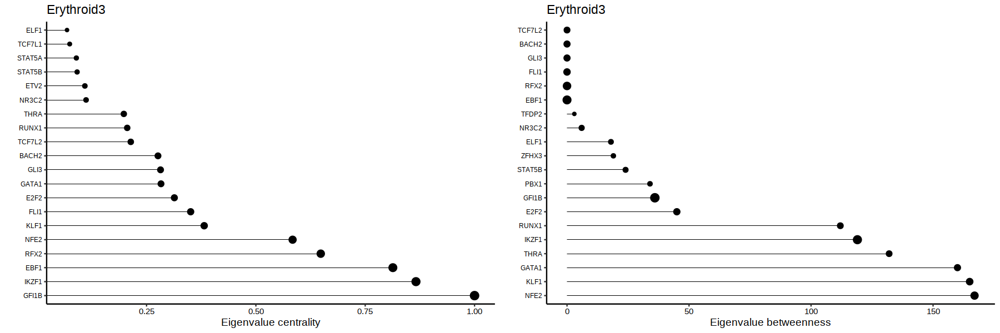

In [224]:
nodes.eigen = do.call('cbind', vertex_attr(igraph.tbl_tmp)) %>% as.data.table() %>% setnames('node', 'tf')

to.plot <- nodes.eigen[type=='TF'] %>%
    .[,eigen_centrality:=as.numeric(eigen_centrality)] %>%
    .[,eigen_betweenness:=as.numeric(eigen_betweenness)] %>%
  setorder(-eigen_centrality) %>%
  .[,tf:=factor(tf, levels=tf)]

options(repr.plot.width=8, repr.plot.height=8)

p1 <- ggplot(head(to.plot, 20), aes_string(x="eigen_centrality", y="tf")) +
  geom_point(aes(size=eigen_centrality)) +
  geom_segment(aes(yend=tf), xend=0, size=0.20) +
  scale_size_continuous(range = c(1.25,3.75)) +
  labs(y="", x="Eigenvalue centrality") +
  theme_classic() +
  guides(size="none") +
  theme(
    axis.text.x = element_text(size=rel(1.0), color="black"),
    axis.text.y = element_text(size=rel(0.75), color="black")
  )+ ggtitle(celltype_i)

p2 <- ggplot(head(to.plot %>%  setorder(-eigen_betweenness) %>%
  .[,tf:=factor(tf, levels=tf)], 20), aes_string(x="eigen_betweenness", y="tf")) +
  geom_point(aes(size=eigen_centrality)) +
  geom_segment(aes(yend=tf), xend=0, size=0.20) +
  scale_size_continuous(range = c(1.25,3.75)) +
  labs(y="", x="Eigenvalue betweenness") +
  theme_classic() +
  guides(size="none") +
  theme(
    axis.text.x = element_text(size=rel(1.0), color="black"),
    axis.text.y = element_text(size=rel(0.75), color="black")
  )+ ggtitle(celltype_i)
options(repr.plot.width=15, repr.plot.height=5)

ggarrange(p1, p2)

In [217]:
plot_weight_stats = function(celltypes){
metacells = metacell_metadata.dt[celltype==celltypes, metacell]

GRN_tmp = group_GRN(metacells)
node_stats = GRN_tmp$edges %>% 
                .[,c('outweight', 'Ntargets'):=list(sum(score), .N), by=node] %>%
                .[,c('inweight', 'Nregulators'):=list(sum(score), .N), by=target] %>%
               unique(by='node') %>%
              .[,c('node', 'outweight','Ntargets', 'inweight', 'Nregulators')] %>%
               merge(GRN_tmp$nodes, by='node') %>%
               .[,c('out_norm', 'in_norm'):=list(outweight/Ntargets, inweight/Nregulators)]

    p = ggplot(node_stats, aes(out_norm,in_norm, label=node, col=value)) + 
        geom_point(size=15, col='black') + 
        geom_text(aes(fontface = "bold")) + 
        viridis::scale_color_viridis() + 
        theme_bw() +
        ggtitle(celltypes) #+ 
    #    xlim(0,0.7) + ylim(0,0.7)
    return(p)
}

In [218]:
for(i in celltypes.to.plot){
    p = plot_weight_stats(i)
    
   png(file.path(io$outdir,sprintf("gif/weight_stats_%s.png",i)), width = 1000, height = 500, bg = "white")
       print(p)
   dev.off()
}
library(magick)
sprintf("%s/gif/weight_stats_%s.png",io$outdir,celltypes.to.plot) %>%
  map(image_read) %>%
  image_join %>%
  image_animate(fps=0.5) %>%
  image_write(quality=100, path = sprintf("%s/gif/weight_stats.gif",io$outdir))

All blaz's recommendations are difficult

# All genes

In [225]:
##################################
## Load global GRN coefficients ##
##################################
io$grn_coef <- file.path(args$outdir, 'global_chip_GRN_coef.txt.gz')
opts$min_coef <- 0.25

GRN_coef.dt <- fread(io$grn_coef) %>% 
  .[,gene:=toupper(gene)] %>% #.[gene%in%unique(marker_TFs_filt.dt$gene) & tf%in%unique(marker_TFs_filt.dt$gene)] %>%
  .[pvalue<0.10 & abs(beta)>=opts$min_coef]

#######################
##  Load ChIP-scores ##
#######################
args$outfile <- file.path(args$outdir, "TF2gene_after_virtual_chip.txt.gz")
chip = fread(args$outfile) %>% 
  .[,gene:=toupper(gene)] %>%
  .[gene!='']

#######################
##  merge GRN & ChIP ##
#######################
chip_GRN = merge(chip, GRN_coef.dt, by=c('tf', 'gene')) %>%
    .[tf!=gene] # remove auto regulation because it messes up the plot

## test
#TFs = c('FLI1', 'GATA2', 'KLF1', 'TAL1')
TFs = unique(chip_GRN$tf)
#TFs = c('POU5F1', 'NANOG')
chip_GRN_i = chip_GRN[chip_score>0.25 & abs(beta) > 0.35]

In [226]:
GRN_metacell = function(metacell, expr_thr = 0.25, acc_thr = 0.25, TFs_i =  unique(chip_GRN$tf)){
   chip_GRN_i_metacell = chip_GRN_i %>% 
        .[gene!=tf] %>%
        cbind(logcounts(rna_metacells.sce)[str_to_title(chip_GRN_i$tf), metacell]) %>%  # Add expression data
        setnames('V2', 'expr') %>% 
        cbind(assay(atac_peakMatrix_metacells.se[chip_GRN_i$peak, metacell],"logcounts")) %>%  # Add accessibility data
        setnames(metacell, 'acc') %>%
        .[,c('expr', 'acc'):=list(minmax.normalisation(expr), minmax.normalisation(acc))] %>%
         .[,peak_score:=minmax.normalisation(chip_score*expr*acc)] %>% # TF-peak score
         .[,target_score:=minmax.normalisation(peak_score*beta*sign(beta))*sign(beta)] %>%
         .[,sign:=ifelse(sign(beta)>0, 'Positive', 'Negative')]#%>% # peak-gene score
        # .[,peak_score:=chip_score*expr*acc] %>% # TF-peak score
        # .[,target_score:=peak_score*beta] #%>%
    
    #TFs = c('FLI1', 'GATA2', 'KLF1', 'TAL1')
    TFs = TFs_i
    #TFs = c('POU5F1', 'NANOG')
    #chip_GRN_i = chip_GRN[gene %in% tf][chip_score>0.4 & abs(beta) > 0.3]
    TF_target = chip_GRN_i_metacell[,c('tf', 'gene', 'target_score', 'sign')] %>%
     #   .[,sign:=ifelse(target_score>0, 'Positive', ifelse(target_score<0, 'Negative', '0'))] %>%
        .[,target_score:=abs(target_score)] %>%
        .[,id:=1:nrow(.)] %>%
        .[order(-target_score)] %>% unique(by=c('tf', 'gene')) %>%# select only highest score if multiple same TF-gene edges
        .[order(id)] %>% .[, id:=NULL]
    edges.dt = TF_target %>% setnames(c('node', 'target', 'score', 'sign')) %>% unique(by=c('node', 'target'))

    

    nodes.dt = data.table(node = toupper(rownames(logcounts(rna_metacells.sce))),
                  value = minmax.normalisation(logcounts(rna_metacells.sce)[, metacell]))


    GRN = list(edges.dt, nodes.dt)
    names(GRN) = c('edges', 'nodes')
    return(GRN)
}

In [227]:
GRN_per_metacell = lapply(metacell_metadata.dt$metacell, GRN_metacell)
names(GRN_per_metacell) = metacell_metadata.dt$metacell

In [228]:
edges = GRN_per_metacell[[1]]$edges[,c(1,2,4)]
for(x in metacell_metadata.dt$metacell){
    tmp = GRN_per_metacell[[x]]$edges[,'score'] %>% setnames(x)
    edges = cbind(edges, tmp)
    }

nodes = GRN_per_metacell[[1]]$nodes[,c(1)]
for(x in metacell_metadata.dt$metacell){
    tmp = GRN_per_metacell[[x]]$nodes[,'value'] %>% setnames(x)
    nodes = cbind(nodes, tmp)
    }

In [229]:
group_GRN = function(metacells){
    nodes_tmp = data.table(node = nodes$node, type=ifelse(nodes$node %in% all_TFs, 'TF', 'gene'), value = rowMeans(as.matrix(nodes[,..metacells])))
    edges_tmp = data.table(node = edges$node, target=edges$target, sign = edges$sign,  score = rowMeans(as.matrix(edges[,..metacells])))
    GRN = list(edges_tmp, nodes_tmp)
    names(GRN) = c('edges', 'nodes')
    return(GRN)
}

plot_group_GRN = function(metacells, score_thr=0, value_thr=0){
    # get group GRN
    GRN_tmp = group_GRN(metacells)
    
    # Create network
    igraph.tbl_tmp = tbl_graph(nodes = GRN_tmp[['nodes']][node %in% GRN_tmp[['edges']]$node | node %in% GRN_tmp[['edges']]$target], edges =  GRN_tmp[['edges']]) #%>%
        # activate(edges) %>%
        # mutate(sign=ifelse(score>0, 'Positive', ifelse(score<0, 'Negative', '0'))) %>%
        # mutate(score=abs(score))
    
    # plot
    p = ggraph(igraph.tbl_tmp, 'stress') +
    # Edges
        geom_edge_fan(aes(filter=score>0.1, edge_alpha=score, edge_color=sign), edge_width=0.3, arrow=arrow(length=unit(4,'mm')), end_cap=circle(4,'mm'), show.legend = T) + #filter=score>score_thr, 
        scale_edge_alpha_continuous(range=c(0,1)) +
        scale_edge_colour_manual(values=c("Positive"="#08c20e", "Negative"="darkred")) +
        # Nodes
        geom_node_point(aes(filter=value>0.3,size=ifelse(type=='TF', value, value/5), alpha=value, col=type)) + #It looks nice to filter above a threshold but it's not fair because TF-peak are higher than peak-target, and there is no minmax norm so far
        geom_node_text(aes(filter=value>0.3 & type=='TF' , label=node, alpha=value)) + # , size=3.75| type=='target'
        geom_node_point(aes(alpha=0)) + # so that layout is the same for all celltypes
       # viridis::scale_color_viridis() + 
        scale_alpha_continuous(range=c(0.0,1)) +
        # theme
        theme_graph() + theme(
          legend.position = "none"
        )
    return(p)
}

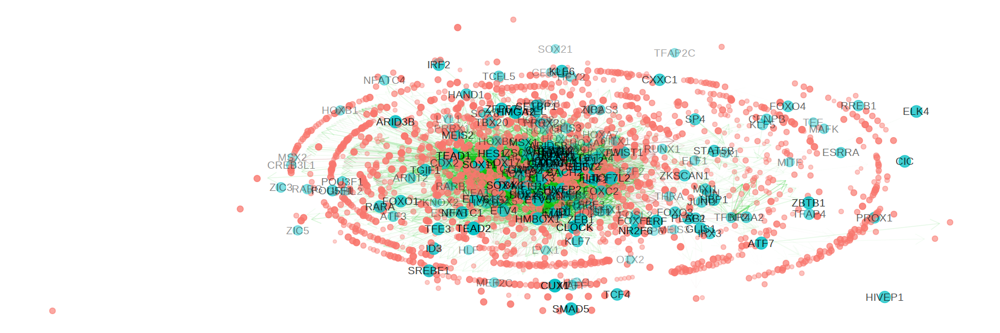

In [230]:
metacells = metacell_metadata.dt[celltype==celltypes.to.plot[1], metacell]
p = plot_group_GRN(metacells)
p

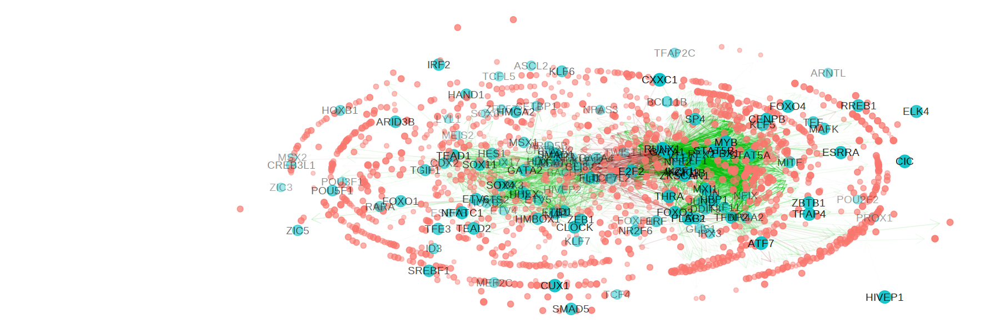

In [231]:
metacells = metacell_metadata.dt[celltype==celltypes.to.plot[3], metacell]
p = plot_group_GRN(metacells)
p

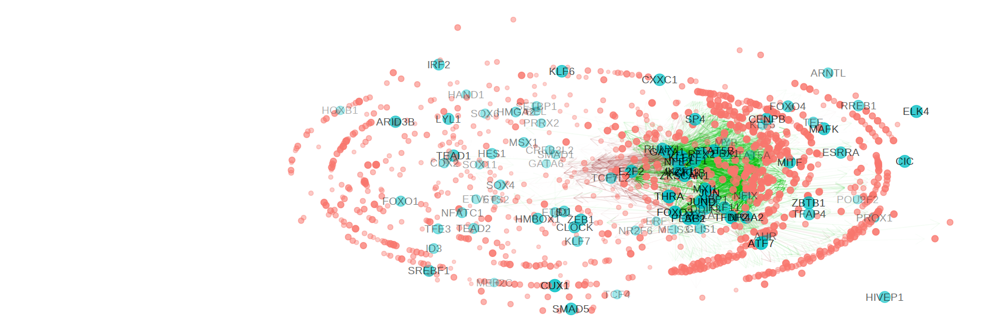

In [232]:
metacells = metacell_metadata.dt[celltype==celltypes.to.plot[6], metacell]
p = plot_group_GRN(metacells)
p

In [233]:
celltype_i= celltypes.to.plot[6]
metacells = metacell_metadata.dt[celltype==celltype_i, metacell]

GRN_tmp = group_GRN(metacells)
igraph.tbl_tmp = tbl_graph(nodes = GRN_tmp[['nodes']], edges =  GRN_tmp[['edges']][score>0.15]) %>%
    activate(nodes) %>% 
    mutate(eigen_centrality=eigen_centrality(., directed =TRUE, weights = E(.)$score)$vector) %>%
    mutate(eigen_betweenness=estimate_betweenness(., v=V(.), directed =TRUE, weights = 1/E(.)$score, cutoff=0)) %>%
    mutate(outdegree = igraph::degree(., V(.), mode='out')) %>% 
    mutate(indegree = igraph::degree(., V(.), mode='in'))

Warning message in eigen_centrality(., directed = TRUE, weights = E(.)$score):
“At centrality.c:352 :Weighted directed graph in eigenvector centrality”


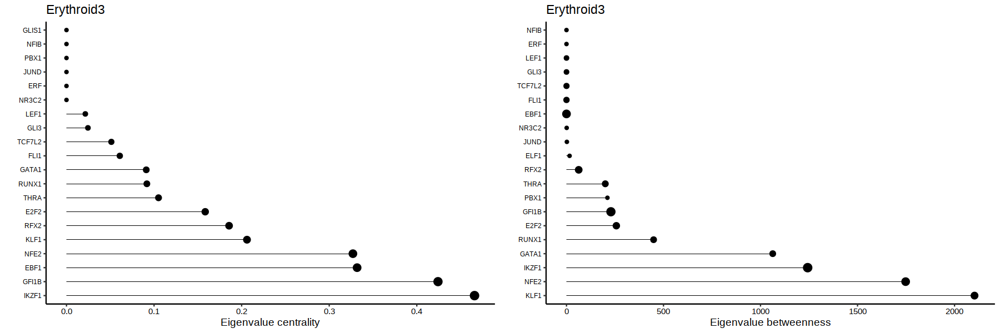

In [234]:
nodes.eigen = do.call('cbind', vertex_attr(igraph.tbl_tmp)) %>% as.data.table() %>% setnames('node', 'tf')

to.plot <- nodes.eigen[type=='TF'] %>%
    .[,eigen_centrality:=as.numeric(eigen_centrality)] %>%
    .[,eigen_betweenness:=as.numeric(eigen_betweenness)] %>%
  setorder(-eigen_centrality) %>%
  .[,tf:=factor(tf, levels=tf)]

options(repr.plot.width=8, repr.plot.height=8)

p1 <- ggplot(head(to.plot, 20), aes_string(x="eigen_centrality", y="tf")) +
  geom_point(aes(size=eigen_centrality)) +
  geom_segment(aes(yend=tf), xend=0, size=0.20) +
  scale_size_continuous(range = c(1.25,3.75)) +
  labs(y="", x="Eigenvalue centrality") +
  theme_classic() +
  guides(size="none") +
  theme(
    axis.text.x = element_text(size=rel(1.0), color="black"),
    axis.text.y = element_text(size=rel(0.75), color="black")
  )+ ggtitle(celltype_i)

p2 <- ggplot(head(to.plot %>%  setorder(-eigen_betweenness) %>%
  .[,tf:=factor(tf, levels=tf)], 20), aes_string(x="eigen_betweenness", y="tf")) +
  geom_point(aes(size=eigen_centrality)) +
  geom_segment(aes(yend=tf), xend=0, size=0.20) +
  scale_size_continuous(range = c(1.25,3.75)) +
  labs(y="", x="Eigenvalue betweenness") +
  theme_classic() +
  guides(size="none") +
  theme(
    axis.text.x = element_text(size=rel(1.0), color="black"),
    axis.text.y = element_text(size=rel(0.75), color="black")
  )+ ggtitle(celltype_i)
options(repr.plot.width=15, repr.plot.height=5)

ggarrange(p1, p2)

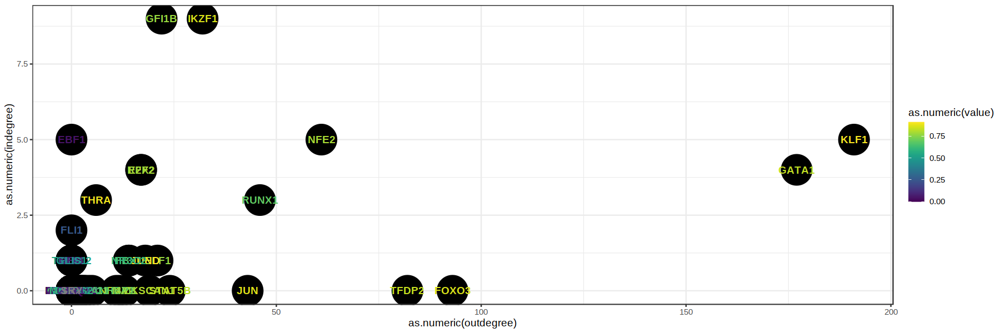

In [235]:
ggplot(to.plot, aes(as.numeric(outdegree), as.numeric(indegree), label=tf, col=as.numeric(value))) + geom_point(size=15, col='black') + geom_text(aes(fontface = "bold")) + viridis::scale_color_viridis() + theme_bw()